#Predicción de precios mediante análisis de regresión
##Tutor: Jorge Crespo

**Entrega intermedia del TFM: 28/09/2022**

**Entrega final del TFM: 19/10/2022**

En este TFM queremos estimar el precio de venta de vehículos de segunda mano
mediante un aprendizaje supervisado. Trabajaremos con datos etiquetados con
el precio al que se venden o se están vendiendo una serie de coches,
analizaremos las variables a nuestra disposición, algunas categóricas otras
numéricas, explicaremos la relación de las variables entre sí (análisis de
correlación) y con la variable dependiente (precio del vehículo) y construiremos
un modelo de regresión que nos permita predecir el precio, calcularemos las
métricas principales que expliquen el rendimiento de nuestro modelo (r2, rmse,
mape).

#Librerías

In [ ]:
import pandas as pd
pd.options.mode.chained_assignment = None
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from prettytable import PrettyTable
from sklearn.feature_selection import f_regression, mutual_info_regression
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV  
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import LassoCV
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import ElasticNetCV
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor

In [ ]:
pip install Scrapy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 264 kB 7.2 MB/s 
     |████████████████████████████████| 3.1 MB 44.2 MB/s 
     |████████████████████████████████| 4.0 MB 43.7 MB/s 
     |████████████████████████████████| 251 kB 37.7 MB/s 
     |████████████████████████████████| 93 kB 2.7 MB/s 
     |████████████████████████████████| 57 kB 5.2 MB/s 
     |████████████████████████████████| 74 kB 3.4 MB/s 
  Created wheel for PyDispatcher: filename=PyDispatcher-2.0.6-py3-none-any.whl size=11958 sha256=f98b24296538b5839a7a97c88d9378f3a630cb05b3914dff4ff90a7dd86518f4
  Stored in directory: /root/.cache/pip/wheels/c9/d6/6a/de198d890277cde60ca3dbebe7ae592d3b381c7d9bb2455f4d
Successfully built PyDispatcher


#Shell

Para hacer el scrap que luego incluiremos dentro de la araña

In [ ]:
#!scrapy shell 'https://www.cazoo.co.uk/car-details/901996d8-f7fb-57b1-bac5-54f3cac4af43/'

#Project

Creamos el proyecto y construimos todo lo necesario para usar nuestra araña

In [ ]:
!scrapy startproject TFM

New Scrapy project 'TFM', using template directory '/usr/local/lib/python3.7/dist-packages/scrapy/templates/project', created in:
    /content/TFM

You can start your first spider with:
    cd TFM
    scrapy genspider example example.com


Cambiamos el **settings.py** para obtener un scrapeo exitoso. Concretamente:

* USERG_AGENT = 'Applebot'

* BOBOTSTXT_OBEY = False



In [ ]:
# get the current working directory
import os
os.getcwd()

'/content'

In [ ]:
# change working directories
os.chdir('/content/TFM/TFM/spiders')
os.getcwd()

'/content/TFM/TFM/spiders'

#Araña 1

In [ ]:
%%writefile -a araña.py

import scrapy
import re

class CarSpider(scrapy.Spider):

  #definimos el nombre del scraper
  name = "new_car"

  #generamos todas las url de la pagina principal
  def generate_urls(self):
    urls = []
    for i in range(1, 200):  #hay 47 coches por página y el nº de coches oscila entre 7000 y 7500, por lo que 200 páginas asegura cogerlos todos
      urls.append(f'https://www.cazoo.co.uk/cars/?page={i}')
    return urls
  
  #parse all main page information and go to each car detail page
  def parse(self, response):
    # follow links to car listings
    for href in response.xpath('//a[contains(@href, "car-details")]/@href'):
      # filter out the advertisement links
      url = response.urljoin(href.extract())
      yield scrapy.Request(url, callback=self.parse_car)

  #making requests to all page url
  def start_requests(self):
    for url in self.generate_urls():
      yield scrapy.Request(url=url, callback=self.parse)
    
  #parseamos cada pagina de cada coche y tomamos la info necesaria
  def parse_car(self, response):
    result = dict()
    result['Modelo'] = response.xpath('//h1/text()').get()
    result['Versión'] = response.xpath('//p[@class="sc-yrk414-0 jBtyVi"]/text()').get()
    result['Kilometros']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[0].get()
    result['Año']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[1].get()
    result['Marchas']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[2].get()
    result['Combustible']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[3].get()
    result['Color']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[6].get()
    result['Motor']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[4].get()
    result['Asientos']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[3].get()
    result['Dueños anteriores']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[9].get()
    result['Emisiones']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[11].get()
    result['Tracción']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[7].get()
    result['Potencia del motor']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[15].get()
    result['Capacidad del tanque']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[17].get()
    result['Consumo']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[21].get()
    result['Precio']= response.xpath('//p[@class="Pricingstyles__TotalPriceValue-sc-1m171co-4 drnOgY"]/text()').get()

    yield result

Writing araña.py


#Crawl

Hacemos el crawl a la página web para obtener los datos

In [ ]:
!scrapy crawl new_car -t csv -o ./output/resultados_coches.csv

Streaming output truncated to the last 5000 lines.
2022-08-01 10:20:47 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://www.cazoo.co.uk/car-details/1ef67ae4-0f3a-5579-a6be-e4b69b7e47de/> (referer: https://www.cazoo.co.uk/cars/?page=131)
2022-08-01 10:20:47 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://www.cazoo.co.uk/car-details/71ca5a6b-40fc-5117-abaa-452596d692d3/> (referer: https://www.cazoo.co.uk/cars/?page=131)
2022-08-01 10:20:47 [scrapy.core.scraper] DEBUG: Scraped from <200 https://www.cazoo.co.uk/car-details/df49b524-f8d2-5bb3-8ad4-9cccd7edc89a/>
{'Modelo': 'Land Rover Range Rover Evoque', 'Versión': '2L SE Tech TD4', 'Kilometros': '22,868 miles', 'Año': 'Mar 2018', 'Marchas': 'Manual', 'Combustible': 'Diesel', 'Color': 'Red', 'Motor': '2L', 'Asientos': '5', 'Dueños anteriores': '1', 'Emisiones': '125g/km (band G)', 'Tracción': 'Four wheel drive', 'Potencia del motor': '178 bhp', 'Capacidad del tanque': '54 litres', 'Consumo': '58.90mpg (approx. £20 / week)', 'P

#EDA Araña 1

Cuando lo scrapeamos por primera vez:

In [ ]:
df = pd.read_csv('/content/TFM/TFM/spiders/output/resultados_coches.csv')

Para no scrapear cada vez que ejecutamos el programa, guardamos el csv del scraping en drive y lo usamos:

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Máster/TFM/resultados_coches.csv')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7302 entries, 0 to 7301
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Modelo                7302 non-null   object
 1   Versión               7302 non-null   object
 2   Kilometros            7302 non-null   object
 3   Año                   7302 non-null   object
 4   Marchas               7302 non-null   object
 5   Combustible           7302 non-null   object
 6   Color                 7302 non-null   object
 7   Motor                 7302 non-null   object
 8   Asientos              7302 non-null   int64 
 9   Dueños anteriores     7302 non-null   object
 10  Emisiones             7302 non-null   object
 11  Tracción              7302 non-null   object
 12  Potencia del motor    7302 non-null   object
 13  Capacidad del tanque  7302 non-null   object
 14  Consumo               7302 non-null   object
 15  Precio                7118 non-null   

Observamos que existen coches cuyo precio presenta valor nulo

In [ ]:
nan_rows = df[df.isnull().any(1)]

In [ ]:
nan_rows.sample(5)

,Modelo,Versión,Kilometros,Año,Marchas,Combustible,Color,Motor,Asientos,Dueños anteriores,Emisiones,Tracción,Potencia del motor,Capacidad del tanque,Consumo,Precio
6198,Mini Countryman,1.5L Cooper SE Exclusive,"15,778 miles",Jun 2019,Automatic,Hybrid,7.6 kWh,1.5L,5,Four wheel drive,1,5 door SUV,123 mph,221 bhp,£155 / year,NaN
5257,Audi A1,1L S line TFSI,"15,561 miles",Apr 2019,Manual,Petrol,Blue,1L,5,1,111g/km (band G),Front wheel drive,114 bhp,40 litres,49.60mpg (approx. £23 / week),NaN
6908,Land Rover Range Rover Sport,3L HSE SD V6,"32,639 miles",May 2017,Automatic,Diesel,Silver,3L,5,1,185g/km (band J),Four wheel drive,302 bhp,86 litres,40.40mpg (approx. £29 / week),NaN
1490,Hyundai i30,1L SE Blue Drive T-GDi,"27,343 miles",Jul 2018,Manual,Petrol,Red,1L,5,2,115g/km (band G),Front wheel drive,118 bhp,50 litres,56.50mpg (approx. £20 / week),NaN
6641,Alfa Romeo Stelvio,2.1L Speciale TD,"14,219 miles",Mar 2019,Automatic,Diesel,Vulcano Black,2.1L,5,1,127g/km (band G),Four wheel drive,206 bhp,58 litres,58.90mpg (approx. £20 / week),NaN


  Los *NaN* obtenidos se dan porque en Cazoo esos coches están **REBAJADOS**, por lo que en la página web el valor de su precio se muestra en una variable de HTML diferente (en un color rojo resaltando la rebaja). Así, al scrapearlo obtenemos un valor nulo, ya que no estamos cogiendo el valor deseado.

Si queremos obtener el valor del precio rebajado, hemos de hacer una condición en la que se tenga en cuenta esta rebaja:

#Araña 2

In [ ]:
%%writefile -a araña.py

import scrapy
import re

class CarSpider(scrapy.Spider):

  #definimos el nombre del scraper
  name = "new_car"

  #generamos todas las url de la pagina principal
  def generate_urls(self):
    urls = []
    for i in range(1, 200): #hay 47 coches por página y el nº de coches oscila entre 7000 y 7500, por lo que 200 páginas asegura cogerlos todos
      urls.append(f'https://www.cazoo.co.uk/cars/?page={i}')
    return urls
  
  #parse all main page information and go to each car detail page
  def parse(self, response):
    # follow links to car listings
    for href in response.xpath('//a[contains(@href, "car-details")]/@href'):
      # filter out the advertisement links
      url = response.urljoin(href.extract())
      yield scrapy.Request(url, callback=self.parse_car)

  #making requests to all page url
  def start_requests(self):
    for url in self.generate_urls():
      yield scrapy.Request(url=url, callback=self.parse)
    
  #parseamos cada pagina de cada coche y tomamos la info necesaria
  def parse_car(self, response):
    result = dict()
    result['Modelo'] = response.xpath('//h1/text()').get()
    result['Versión'] = response.xpath('//p[@class="sc-yrk414-0 jBtyVi"]/text()').get()
    result['Kilometros']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[0].get()
    result['Año']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[1].get()
    result['Marchas']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[2].get()
    result['Combustible']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[3].get()
    result['Color']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[6].get()
    result['Motor']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[4].get()
    result['Asientos']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[3].get()
    result['Dueños anteriores']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[9].get()
    result['Emisiones']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[11].get()
    result['Tracción']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[7].get()
    result['Potencia del motor']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[15].get()
    result['Capacidad del tanque']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[17].get()
    result['Consumo']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[21].get()

    if response.xpath('//p[@class="Pricingstyles__TotalPriceValue-sc-1m171co-4 drnOgY"]/text()').get() is None:
      result['Precio']= response.xpath('//p[@class="Pricingstyles__TotalPriceValue-sc-1m171co-4 atSNp"]/text()').get()
    else:
      result['Precio']= response.xpath('//p[@class="Pricingstyles__TotalPriceValue-sc-1m171co-4 drnOgY"]/text()').get()
    yield result

Writing araña.py


#Crawl

In [ ]:
!scrapy crawl new_car -t csv -o ./output/resultados_coches2.csv

Streaming output truncated to the last 5000 lines.
2022-08-05 07:28:47 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://www.cazoo.co.uk/car-details/c9be9fa1-cd4b-57d9-8c6a-e5f921895708/> (referer: https://www.cazoo.co.uk/cars/?page=123)
2022-08-05 07:28:47 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://www.cazoo.co.uk/car-details/ba3ee28f-f969-5a0a-9bc8-2998d0cd2abf/> (referer: https://www.cazoo.co.uk/cars/?page=123)
2022-08-05 07:28:47 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://www.cazoo.co.uk/car-details/f46613bf-0151-5d78-899a-3b7b85a40e06/> (referer: https://www.cazoo.co.uk/cars/?page=123)
2022-08-05 07:28:47 [scrapy.core.scraper] DEBUG: Scraped from <200 https://www.cazoo.co.uk/car-details/c9be9fa1-cd4b-57d9-8c6a-e5f921895708/>
{'Modelo': 'Ford Puma', 'Versión': '1L ST-Line Design EcoBoost MHEV T', 'Kilometros': '13,921 miles', 'Año': 'Sept 2021', 'Marchas': 'Manual', 'Combustible': 'Petrol', 'Color': '5 door SUV', 'Motor': '1L', 'Asientos': '5', 'Dueños 

#EDA Araña 2

In [ ]:
#df2 = pd.read_csv('/content/TFM/TFM/spiders/output/resultados_coches2.csv')

In [ ]:
df2 = pd.read_csv('/content/drive/MyDrive/Máster/TFM/resultados_coches2.csv')

In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7225 entries, 0 to 7224
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Modelo                7225 non-null   object
 1   Versión               7225 non-null   object
 2   Kilometros            7225 non-null   object
 3   Año                   7225 non-null   object
 4   Marchas               7225 non-null   object
 5   Combustible           7225 non-null   object
 6   Color                 7225 non-null   object
 7   Motor                 7225 non-null   object
 8   Asientos              7225 non-null   int64 
 9   Dueños anteriores     7225 non-null   object
 10  Emisiones             7225 non-null   object
 11  Tracción              7225 non-null   object
 12  Potencia del motor    7225 non-null   object
 13  Capacidad del tanque  7225 non-null   object
 14  Consumo               7225 non-null   object
 15  Precio                7225 non-null   

Dado que este segundo scraping se ha realizado en un día distinto al primero, el número de coches en la página web ha variado (porque se han vendido, se han retirado, etc.). Si antes habían 7302 coches, ahora hay 7225. No obstante, de los 7302 anteriores solo nos valían los 7118 que tenían el precio, mientras que ahora, al haber añadido la condición de la rebaja al scraping, nos valen los 7225, por lo que hemos aumentando nuestro número de datos en más de 100.

##¿Deberíamos considerar para el modelo de regresión los coches en rebajas?

Al investigar los coches rebajados en la web, comprobamos que no existe un campo o criterio según el cual se rebajan. 

Si bien es cierto que manteniendo estos coches rebajados aumentamos el número de datos (lo que podría significar una mayor precisión), también es cierto que estos coches pueden tratarse como "anómalos", ya que su precio no se corresponde con lo que reflejan sus características (debido a la rebaja). Esto puede repercutir en la precisión del modelo, por lo que sería interesante no considerarlos.

##Eléctricos/híbridos

Cuando he realizado el tratamiento de datos sobre este dataset, me he dado cuenta de que a la hora de hacer scraping ha habido un problema con algunos datos, y estos presentan columnas con valores desplazados o directamente erróneos.

Esto lo podemos ver en los coches que son **ELÉCTRICOS**:

In [ ]:
df2[df2['Combustible'].str.contains('Electric')]

,Modelo,Versión,Kilometros,Año,Marchas,Combustible,Color,Motor,Asientos,Dueños anteriores,Emisiones,Tracción,Potencia del motor,Capacidad del tanque,Consumo,Precio
458,Nissan Leaf,Tekna,"23,787 miles",Jun 2018,Automatic,Electric,5 door Hatchback,168 miles,5,DL18 URN,1,Red,11.5 seconds,4490 mm,Group 21 (approx. £483 / year),"£20,450"
511,Vauxhall Corsa-e,SE Premium,3 miles,Dec 2021,Automatic,Electric,5 door Hatchback,209 miles,5,DN71 SUY,1,White,7.6 seconds,4060 mm,Group 24 (approx. £398 / year),"£26,950"
520,Nissan Leaf,Tekna,"14,041 miles",Dec 2019,Automatic,Electric,5 door Hatchback,168 miles,5,DP69 OXM,1,White,7.9 seconds,4490 mm,Group 21 (approx. £495 / year),"£23,350"
683,BMW i3,S,"22,271 miles",Jan 2019,Automatic,Electric,5 door Hatchback,214 miles,4,HS68 XKP,1,Melbourne Red with highlight Frozen Grey,6.9 seconds,4006 mm,Group 29 (approx. £572 / year),"£26,850"
715,Jaguar I-PACE,HSE,"24,688 miles",Jul 2019,Automatic,Electric,5 door SUV,284 miles,5,VL19 BFA,1,Blue,4.8 seconds,4682 mm,"Group 50 (approx. £1,124 / year)","£49,200"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7180,Fiat 500 Electric,La Prima,"1,868 miles",Apr 2021,Automatic,Electric,2 door Convertible,199 miles,4,BX21 WJE,1,Grey,Not available,3632 mm,Group 21,"£29,800"
7184,Fiat 500 Electric,La Prima,"4,092 miles",Apr 2021,Automatic,Electric,2 door Convertible,199 miles,4,NJ21 XXU,1,Grey,Not available,3632 mm,Group 21,"£29,750"
7208,Fiat 500 Electric,La Prima,"6,563 miles",Apr 2021,Automatic,Electric,2 door Convertible,199 miles,4,YE21 MKP,1,Grey,Not available,3632 mm,Group 21,"£29,400"
7209,Fiat 500 Electric,La Prima,"4,329 miles",Apr 2021,Automatic,Electric,2 door Convertible,199 miles,4,MX21 XFM,1,Grey,Not available,3632 mm,Group 21,"£29,300"


Al mirar la web, observamos como el campo obtenido con Scraping que para los coches de gasolina y diesel marca la cilindrada, para los coches eléctricos marca la capacidad de la batería en millas (es decir, la autonomía).

Además, a los eléctricos se les añade en la web una característica más que los otros coches no poseen y que se refiere a la capacidad de la batería en kWh. Esto hace que los campos posteriores al motor obtenidos con scraping esten desplazados y no marquen la característica que deberían.

Algo muy similar a lo que sucede con los eléctricos también ocurre con los **HÍBRIDOS**:

In [ ]:
df2[df2['Combustible'].str.contains('Hybrid')]

,Modelo,Versión,Kilometros,Año,Marchas,Combustible,Color,Motor,Asientos,Dueños anteriores,Emisiones,Tracción,Potencia del motor,Capacidad del tanque,Consumo,Precio
451,Lexus CT 200h,1.8L Sport,"41,304 miles",Sept 2017,Automatic,Hybrid,Silver,1.8L,5,4,94g/km (band E),Front wheel drive,134 bhp,45 litres,68.90mpg (approx. £17 / week),"£14,200"
969,Suzuki Swift,1L SZ5 Boosterjet,"12,879 miles",Jan 2019,Manual,Hybrid,5 door Hatchback,1L,5,KK68 ZWG,1,Grey,10.6 seconds,3840 mm,Group 27 (approx. £371 / year),"£12,000"
1037,Lexus UX 250h,2L UX,"29,344 miles",Sept 2019,Automatic,Hybrid,5 door SUV,2L,5,YT69 XLN,1,White,8.5 seconds,4495 mm,Group 22 (approx. £438 / year),"£24,500"
1143,Lexus CT 200h,1.8L F Sport,"30,935 miles",Sept 2016,Automatic,Hybrid,Red,1.8L,5,2,94g/km (band A),Front wheel drive,134 bhp,45 litres,68.90mpg (approx. £17 / week),"£16,650"
1170,Lexus CT 200h,1.8L F Sport,"98,096 miles",May 2019,Automatic,Hybrid,5 door Hatchback,1.8L,5,HS19 VAU,1,Grey,10.3 seconds,4355 mm,Group 17 (approx. £453 / year),"£14,800"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7086,Hyundai TUCSON,1.6L Ultimate h T-GDi,"13,556 miles",Mar 2021,Automatic,Hybrid,5 door SUV,1.6L,5,DU21 HDK,1,Grey,8.9 seconds,4500 mm,Group 20 (approx. £594 / year),"£31,800"
7098,Ford Kuga,2.5L ST-Line Edition Duratec h,"6,452 miles",Jul 2021,Automatic,Hybrid,5 door SUV,2.5L,5,KJ21 NBZ,1,Blue,9.1 seconds,4614 mm,Group 20 (approx. £392 / year),"£31,400"
7125,Hyundai TUCSON,1.6L Premium h T-GDi,"16,607 miles",Mar 2021,Automatic,Hybrid,5 door SUV,1.6L,5,HN21 DTU,1,White,8.9 seconds,4500 mm,Group 19 (approx. £550 / year),"£31,350"
7190,Lexus NX 300h,2.5L NX,"30,056 miles",Apr 2019,Automatic,Hybrid,5 door SUV,2.5L,5,FN19 YUA,1,Grey,9.2 seconds,4640 mm,Group 29 (approx. £456 / year),"£29,550"


Dentro de los propios híbridos también tenemos diferencias, pues hay algunos modelos con valores desplazados con respecto a los otros. Esto se debe a que hay algunos híbridos que no poseen la Battery Range o 'Autonomía' dentro de las características de la web, así como también hay otros que no poseen ni la Autonomía ni la Battery capacity.

Así mismo, también existen otros coches cuyo combustible es 'Plug-In Hybrid', o lo que es lo mismo, híbrido enchufable. Estos poseen las mismas variables que los híbridos normales, pero su forma de carga eléctrica es distinta y tienen una batería lo suficientemente grande como para ofrecer cierta autonomía en modo totalmente eléctrico.

In [ ]:
df[df['Combustible'].str.contains('Plug-in hybrid')]

,Modelo,Versión,Kilometros,Año,Marchas,Combustible,Color,Motor,Asientos,Dueños anteriores,Emisiones,Tracción,Potencia del motor,Capacidad del tanque,Consumo,Precio
536,BMW 5 Series,2L M Sport 530e,"57,934 miles",Dec 2018,Automatic,Plug-in hybrid,12 kWh,2L,5,Rear wheel drive,1,4 door Saloon,143 mph,249 bhp,£510 / year,"£23,000"
563,Mitsubishi Outlander,2L 4h h,"12,745 miles",Mar 2018,Automatic,Plug-in hybrid,5 door SUV,2L,5,FX18 XDA,1,Grey,11 seconds,4695 mm,Group 31 (approx. £648 / year),"£23,000"
3918,Audi A3,1.4L e-tron TFSI,"49,663 miles",Oct 2016,Automatic,Plug-in hybrid,8.8 kWh,1.4L,5,Front wheel drive,2,5 door Hatchback,81 mph,201 bhp,£0 / year,"£17,700"
3988,Kia Niro,1.6L 2 h GDi,"52,192 miles",May 2019,Automatic,Plug-in hybrid,5 door SUV,1.6L,5,MD19 EXL,1,Black,11.5 seconds,4355 mm,Group 12 (approx. £417 / year),"£17,800"
4036,Mercedes-Benz C Class,2L Sport C350e,"92,849 miles",Sept 2017,Automatic,Plug-in hybrid,6.4 kWh,2L,5,Rear wheel drive,1,4 door Saloon,155 mph,289 bhp,£510 / year,"£16,950"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7128,Cupra Formentor,1.4L VZ2,"1,372 miles",Feb 2022,Automatic,Plug-in hybrid,12.8 kWh,1.4L,5,Front wheel drive,1,5 door SUV,130 mph,242 bhp,Not available,"£40,400"
7134,Mini Countryman,1.5L Cooper SE Sport,"9,189 miles",Sept 2021,Automatic,Plug-in hybrid,10 kWh,1.5L,5,Four wheel drive,1,5 door SUV,122 mph,219 bhp,£155 / year,"£40,000"
7182,Mercedes-Benz A Class,1.3L AMG Line A250e,"24,578 miles",Jul 2020,Automatic,Plug-in hybrid,12 kWh,1.3L,5,Front wheel drive,1,4 door Saloon,146 mph,215 bhp,£155 / year,"£33,300"
7237,Peugeot 3008,1.6L GT,"19,471 miles",Sept 2020,Automatic,Plug-in hybrid,13.2 kWh,1.6L,5,Four wheel drive,2,5 door SUV,149 mph,296 bhp,£510 / year,"£30,250"


Además, tras muchas comprobaciones también he podido darme cuenta de que existen coches gasolina y diesel que también cuentan con algunas de las características de los eléctricos, pues algunos presentan Autonomía y Capacidad de la Batería.

La forma más lógica de arreglar este problema es añadiendo condiciones a la araña, de forma que detecte cuándo un coche es normal, eléctrico o híbrido, y en base a ello realice un tipo de scraping u otro. También hay que tener en cuenta la diferencia dentro de los híbridos.

#Araña 3 

##Nota

A la hora de realizar este último scraping, el comando para sacar el precio:

*  **response.xpath('//p[@class="Pricingstyles__TotalPriceValue-sc-1m171co-4 drnOgY"]/text()').get()** 

había dejado de funcionar.

Por tanto, para este scraping, sustituí ese comando por:
* **response.xpath('//p[contains(text(), "£")]/text()').get()**. 

Para los coches que tienen rebaja, usé el comando:
* **response.xpath('//span[contains(text(), "£")]/text()').get()** 

como condición.

In [ ]:
%%writefile -a araña.py

import scrapy
import re
import numpy as np

class CarSpider(scrapy.Spider):

  #definimos el nombre del scraper
  name = "new_car"

  #generamos todas las url de la pagina principal
  def generate_urls(self):
    urls = []
    for i in range(1, 200):  #hay 47 coches por página y el nº de coches oscila entre 7000 y 7500, por lo que 200 páginas asegura cogerlos todos
      urls.append(f'https://www.cazoo.co.uk/cars/?page={i}')
    return urls
  
  #parse all main page information and go to each car detail page
  def parse(self, response):
    # follow links to car listings
    for href in response.xpath('//a[contains(@href, "car-details")]/@href'):
      # filter out the advertisement links
      url = response.urljoin(href.extract())
      yield scrapy.Request(url, callback=self.parse_car)

  #making requests to all page url
  def start_requests(self):
    for url in self.generate_urls():
      yield scrapy.Request(url=url, callback=self.parse)
    
  #parseamos cada pagina de cada coche y tomamos la info necesaria
  def parse_car(self, response):
    if 'Diesel' in response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[3].get() or 'Petrol' in response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[3].get():
      if 'miles' in response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[5].get(): #Capacidad de la Batería
        result = dict()
        result['Modelo'] = response.xpath('//h1/text()').get()
        result['Versión'] = response.xpath('//p[@class="sc-yrk414-0 jBtyVi"]/text()').get()
        result['Kilometros']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[0].get()
        result['Año']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[1].get()
        result['Marchas']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[2].get()
        result['Combustible']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[3].get()
        result['Tipo de carrocería']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[7].get()
        result['Color']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[8].get()
        result['Motor']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[4].get()
        result['Autonomía'] = response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[5].get()
        result['Capacidad de la batería'] =  response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[6].get()
        result['Asientos']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[3].get()
        result['Dueños anteriores']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[11].get()
        result['Emisiones']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[13].get()
        result['Tracción']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[9].get()
        result['Potencia del motor']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[17].get()
        result['Segmento vehículo']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[18].get()        
        result['Capacidad del tanque']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[19].get()
        result['Consumo']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[23].get()

        if response.xpath('//span[contains(text(), "£")]/text()').get() is None:
          result['Precio']= response.xpath('//p[contains(text(), "£")]/text()').get()
        else:
          result['Precio']= 'rebajado'
        yield result

        if response.xpath('//span[contains(text(), "£")]/text()').get() is None:
          result['Precio']= response.xpath('//p[contains(text(), "£")]/text()').get()
        else:
          result['Precio']= 'rebajado'
        yield result

      elif 'kWh' in response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[5].get():
        result = dict()
        result['Modelo'] = response.xpath('//h1/text()').get()
        result['Versión'] = response.xpath('//p[@class="sc-yrk414-0 jBtyVi"]/text()').get()
        result['Kilometros']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[0].get()
        result['Año']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[1].get()
        result['Marchas']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[2].get()
        result['Combustible']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[3].get()
        result['Tipo de carrocería']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[6].get()
        result['Color']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[7].get()
        result['Motor']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[4].get()
        result['Autonomía'] = np.nan
        result['Capacidad de la batería'] = np.nan
        result['Asientos']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[3].get()
        result['Dueños anteriores']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[10].get()
        result['Emisiones']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[12].get()
        result['Tracción']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[8].get()
        result['Potencia del motor']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[16].get()
        result['Segmento vehículo']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[17].get() 
        result['Capacidad del tanque']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[18].get()
        result['Consumo']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[22].get()

        if response.xpath('//span[contains(text(), "£")]/text()').get() is None or 'Plus' in response.xpath('//span[contains(text(), "£")]/text()').get():
          result['Precio']= response.xpath('//p[contains(text(), "£")]/text()').get()
        else:
          result['Precio']= 'rebajado'
        yield result

      else:  #No tienen ni Capacidad de la Batería ni Autonomía
        result = dict()
        result['Modelo'] = response.xpath('//h1/text()').get()
        result['Versión'] = response.xpath('//p[@class="sc-yrk414-0 jBtyVi"]/text()').get()
        result['Kilometros']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[0].get()
        result['Año']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[1].get()
        result['Marchas']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[2].get()
        result['Combustible']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[3].get()
        result['Tipo de carrocería']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[5].get()
        result['Color']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[6].get()
        result['Motor']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[4].get()
        result['Autonomía'] = np.nan
        result['Capacidad de la batería'] = np.nan
        result['Asientos']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[3].get()
        result['Dueños anteriores']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[9].get()
        result['Emisiones']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[11].get()
        result['Tracción']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[7].get()
        result['Potencia del motor']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[15].get()
        result['Segmento vehículo']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[16].get() 
        result['Capacidad del tanque']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[17].get()
        result['Consumo']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[21].get()

        if response.xpath('//span[contains(text(), "£")]/text()').get() is None or 'Plus' in response.xpath('//span[contains(text(), "£")]/text()').get():
          result['Precio']= response.xpath('//p[contains(text(), "£")]/text()').get()
        else:
          result['Precio']= 'rebajado'
        yield result
        
    elif 'Electric' in response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[3].get():
      result = dict()
      result['Modelo'] = response.xpath('//h1/text()').get()
      result['Versión'] = response.xpath('//p[@class="sc-yrk414-0 jBtyVi"]/text()').get()
      result['Kilometros']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[0].get()
      result['Año']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[1].get()
      result['Marchas']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[2].get()
      result['Combustible']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[3].get()
      result['Tipo de carrocería']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[6].get()
      result['Color']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[7].get()
      result['Motor']= np.nan
      result['Autonomía'] = response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[4].get()
      result['Capacidad de la batería'] =  response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[5].get()
      result['Asientos']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[3].get()
      result['Dueños anteriores']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[10].get()
      result['Emisiones']= np.nan
      result['Tracción']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[8].get()
      result['Potencia del motor']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[16].get()
      result['Segmento vehículo']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[17].get() 
      result['Capacidad del tanque']= np.nan
      result['Consumo']= np.nan

      if response.xpath('//span[contains(text(), "£")]/text()').get() is None or 'Plus' in response.xpath('//span[contains(text(), "£")]/text()').get():
        result['Precio']= response.xpath('//p[contains(text(), "£")]/text()').get()
      else:
        result['Precio']= 'rebajado'
      yield result

    else:
      if 'miles' in response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[5].get(): #tienen Autonomía y Capacidad de la Batería
        result = dict()
        result['Modelo'] = response.xpath('//h1/text()').get()
        result['Versión'] = response.xpath('//p[@class="sc-yrk414-0 jBtyVi"]/text()').get()
        result['Kilometros']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[0].get()
        result['Año']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[1].get()
        result['Marchas']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[2].get()
        result['Combustible']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[3].get()
        result['Tipo de carrocería']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[7].get()
        result['Color']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[8].get()
        result['Motor']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[4].get()
        result['Autonomía'] = response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[5].get()
        result['Capacidad de la batería'] =  response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[6].get()
        result['Asientos']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[3].get()
        result['Dueños anteriores']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[11].get()
        result['Emisiones']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[13].get()
        result['Tracción']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[9].get()
        result['Potencia del motor']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[17].get()
        result['Segmento vehículo']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[18].get() 
        result['Capacidad del tanque']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[19].get()
        result['Consumo']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[23].get()

        if response.xpath('//span[contains(text(), "£")]/text()').get() is None or 'Plus' in response.xpath('//span[contains(text(), "£")]/text()').get():
          result['Precio']= response.xpath('//p[contains(text(), "£")]/text()').get()
        else:
          result['Precio']= 'rebajado'
        yield result

      elif 'kWh' in response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[5].get():  #Tienen solo Capacidad de la Batería
        result = dict()
        result['Modelo'] = response.xpath('//h1/text()').get()
        result['Versión'] = response.xpath('//p[@class="sc-yrk414-0 jBtyVi"]/text()').get()
        result['Kilometros']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[0].get()
        result['Año']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[1].get()
        result['Marchas']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[2].get()
        result['Combustible']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[3].get()
        result['Tipo de carrocería']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[6].get()
        result['Color']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[7].get()
        result['Motor']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[4].get()
        result['Autonomía'] = np.nan
        result['Capacidad de la batería'] =  response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[5].get()
        result['Asientos']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[3].get()
        result['Dueños anteriores']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[10].get()
        result['Emisiones']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[12].get()
        result['Tracción']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[8].get()
        result['Potencia del motor']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[16].get()
        result['Segmento vehículo']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[17].get() 
        result['Capacidad del tanque']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[18].get()
        result['Consumo']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[22].get()

        if response.xpath('//span[contains(text(), "£")]/text()').get() is None or 'Plus' in response.xpath('//span[contains(text(), "£")]/text()').get():
          result['Precio']= response.xpath('//p[contains(text(), "£")]/text()').get()
        else:
          result['Precio']= 'rebajado'
        yield result

      else:  #No tienen ni Capacidad de la Batería ni Autonomía
        result = dict()
        result['Modelo'] = response.xpath('//h1/text()').get()
        result['Versión'] = response.xpath('//p[@class="sc-yrk414-0 jBtyVi"]/text()').get()
        result['Kilometros']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[0].get()
        result['Año']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[1].get()
        result['Marchas']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[2].get()
        result['Combustible']= response.xpath('//li[@class="KeyFeaturesTagsstyles__KeyFeatureTag-sc-5dtmhf-1 fCCyhg p-x2 mb-x2 rounded bg-secondaryLight inline-block"]/text()')[3].get()
        result['Tipo de carrocería']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[5].get()
        result['Color']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[6].get()
        result['Motor']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[4].get()
        result['Autonomía'] = np.nan
        result['Capacidad de la batería'] = np.nan
        result['Asientos']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[3].get()
        result['Dueños anteriores']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[9].get()
        result['Emisiones']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[11].get()
        result['Tracción']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[7].get()
        result['Potencia del motor']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[15].get()
        result['Segmento vehículo']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[16].get() 
        result['Capacidad del tanque']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[17].get()
        result['Consumo']= response.xpath('//dd[@class="list-label-valuestyles__StyledAttributeValue-opn4m9-3 aJytw"]/text()')[21].get()

        if response.xpath('//span[contains(text(), "£")]/text()').get() is None or 'Plus' in response.xpath('//span[contains(text(), "£")]/text()').get():
          result['Precio']= response.xpath('//p[contains(text(), "£")]/text()').get()
        else:
          result['Precio']= 'rebajado'
        yield result
        

Writing araña.py


#Crawl

In [ ]:
!scrapy crawl new_car -t csv -o ./output/resultados_coches3.csv

Se han truncado las últimas 5000 líneas del flujo de salida.
2022-08-30 18:17:39 [scrapy.core.scraper] DEBUG: Scraped from <200 https://www.cazoo.co.uk/car-details/aa153045-2219-56d9-a6fe-4a368f420d1c/>
{'Modelo': 'Abarth 124 Spider', 'Versión': '1.4L MultiAir', 'Kilometros': '9,038 miles', 'Año': 'Sept 2016', 'Marchas': 'Manual', 'Combustible': 'Petrol', 'Tipo de carrocería': '2 door Convertible', 'Color': "Isola D'elba 1974 Blue", 'Motor': '1.4L', 'Autonomía': nan, 'Capacidad de la batería': nan, 'Asientos': '2', 'Dueños anteriores': '2', 'Emisiones': '148g/km (band F)', 'Tracción': 'Rear wheel drive', 'Potencia del motor': '168 bhp', 'Segmento vehículo': '4054 mm', 'Capacidad del tanque': '45 litres', 'Consumo': '44.10mpg (approx. £25 / week)', 'Precio': '£20,850'}
2022-08-30 18:17:39 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://www.cazoo.co.uk/car-details/a3c1f165-703e-597a-a22d-7e2670787fd9/> (referer: https://www.cazoo.co.uk/cars/?page=107)
2022-08-30 18:17:39 [scrapy.c

#EDA Araña 3

##1. CARGA Y LIMPIEZA DE DATOS

In [ ]:
#df3 = pd.read_csv('/content/TFM/TFM/spiders/output/resultados_coches3.csv')

In [ ]:
df3 = pd.read_csv('/content/drive/MyDrive/Máster/TFM/resultados_coches3.csv')

In [ ]:
df3.sample(5)

,Modelo,Versión,Kilometros,Año,Marchas,Combustible,Tipo de carrocería,Color,Motor,Autonomía,Capacidad de la batería,Asientos,Dueños anteriores,Emisiones,Tracción,Potencia del motor,Segmento vehículo,Capacidad del tanque,Consumo,Precio
3579,Renault Kadjar,1.3L GT Line TCe,"16,504 miles",Dec 2019,Manual,Petrol,5 door SUV,iron Blue,1.3L,NaN,NaN,5,1,133g/km (band H),Front wheel drive,138 bhp,4489 mm,55 litres,43.50mpg (approx. £26 / week),"£16,850"
5073,Mercedes-Benz A Class,1.3L AMG Line A200,"40,111 miles",Sept 2018,Automatic,Petrol,5 door Hatchback,Black,1.3L,NaN,NaN,5,2,123g/km (band G),Front wheel drive,161 bhp,4419 mm,43 litres,53.30mpg (approx. £21 / week),"£21,500"
4933,Volkswagen Touareg,3L R-Line TDI V6,"56,735 miles",May 2017,Automatic,Diesel,5 door SUV,Silver,3L,NaN,NaN,5,4,180g/km (band J),Four wheel drive,258 bhp,4801 mm,85 litres,42.80mpg (approx. £27 / week),"£22,900"
3455,Hyundai IONIQ,1.6L Premium h-GDi,"45,898 miles",May 2019,Automatic,Petrol,5 door Hatchback,Grey,1.6L,39 miles,8.9 kWh,5,1,84g/km (band D),Front wheel drive,139 bhp,4470 mm,45 litres,62.80mpg (approx. £18 / week),rebajado
3978,Jaguar E-PACE,2L R-Dynamic S D150,"67,905 miles",Jun 2019,Manual,Diesel,5 door SUV,Black,2L,NaN,NaN,5,1,143g/km (band H),Front wheel drive,148 bhp,4411 mm,Not available,42.80mpg (approx. £27 / week),"£19,650"


In [ ]:
df3.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7070 entries, 0 to 7069
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Modelo                   7070 non-null   object
 1   Versión                  7067 non-null   object
 2   Kilometros               7070 non-null   object
 3   Año                      7070 non-null   object
 4   Marchas                  7070 non-null   object
 5   Combustible              7070 non-null   object
 6   Tipo de carrocería       7070 non-null   object
 7   Color                    7070 non-null   object
 8   Motor                    6946 non-null   object
 9   Autonomía                260 non-null    object
 10  Capacidad de la batería  369 non-null    object
 11  Asientos                 7070 non-null   int64 
 12  Dueños anteriores        7070 non-null   int64 
 13  Emisiones                6946 non-null   object
 14  Tracción                 7070 non-null  

###Rebajados

Como ahora tenemos más valores nulos que hemos añadido nosotros mismos, no podemos hacer un dropna() para quitarnos los coches rebajados de acuerdo al criterio que estábamos siguiendo. Es por esto que a los coches rebajados les he puesto como variable *Precio* el valor de 'rebajado' dentro de la araña, de forma que así podemos identificarlos y dropearlos.

In [ ]:
df3[df3['Precio']=='rebajado']

,Modelo,Versión,Kilometros,Año,Marchas,Combustible,Tipo de carrocería,Color,Motor,Autonomía,Capacidad de la batería,Asientos,Dueños anteriores,Emisiones,Tracción,Potencia del motor,Segmento vehículo,Capacidad del tanque,Consumo,Precio
169,Vauxhall Insignia,2L Tech Line CDTi,"20,918 miles",Jan 2016,Automatic,Diesel,5 door Hatchback,Red,2L,NaN,NaN,5,3,147g/km (band F),Front wheel drive,168 bhp,4842 mm,70 litres,52.30mpg (approx. £22 / week),rebajado
185,Fiat 500C,1.2L Collezione,"35,906 miles",Jun 2019,Manual,Petrol,3 door Convertible,Brunello,1.2L,NaN,NaN,4,1,122g/km (band G),Front wheel drive,69 bhp,3571 mm,35 litres,47.90mpg (approx. £23 / week),rebajado
344,Ford Fiesta,1L Zetec EcoBoost T,"14,339 miles",Sept 2015,Manual,Petrol,5 door Hatchback,Red,1L,NaN,NaN,5,2,99g/km (band A),Front wheel drive,99 bhp,3969 mm,42 litres,65.70mpg (approx. £17 / week),rebajado
398,Vauxhall Mokka,1.6L Tech Line i,"11,435 miles",Mar 2016,Manual,Petrol,5 door SUV,Blue,1.6L,NaN,NaN,5,2,159g/km (band G),Front wheel drive,113 bhp,4278 mm,52 litres,40.90mpg (approx. £27 / week),rebajado
495,Ford Fiesta,1L Titanium EcoBoost T,"25,765 miles",Feb 2017,Manual,Petrol,5 door Hatchback,Silver,1L,NaN,NaN,5,3,99g/km (band A),Front wheel drive,99 bhp,3969 mm,42 litres,65.70mpg (approx. £17 / week),rebajado
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6736,BMW 3 Series,2L M Sport 330e,"33,883 miles",Sept 2019,Automatic,Petrol,4 door Saloon,Portimao Blue,2L,36 miles,12 kWh,5,1,37g/km (band B),Rear wheel drive,288 bhp,4709 mm,40 litres,201.80mpg (approx. £6 / week),rebajado
6751,BMW X3,2L M Sport 20d,"27,534 miles",Sept 2019,Automatic,Diesel,5 door SUV,Black Sapphire metallic paint,2L,NaN,NaN,5,1,143g/km (band H),Four wheel drive,187 bhp,4708 mm,68 litres,54.30mpg (approx. £21 / week),rebajado
6854,BMW X3,2L M Sport 20d,"20,142 miles",Mar 2019,Automatic,Diesel,5 door SUV,Glacier Silver,2L,NaN,NaN,5,1,144g/km (band H),Four wheel drive,187 bhp,4708 mm,68 litres,54.30mpg (approx. £21 / week),rebajado
7034,BMW 3 Series,2L M Sport 320i,"8,965 miles",Mar 2020,Automatic,Petrol,4 door Saloon,Alpine White,2L,NaN,NaN,5,2,127g/km (band G),Rear wheel drive,181 bhp,4709 mm,59 litres,42.20mpg (approx. £27 / week),rebajado


In [ ]:
df3 = df3.drop(df3[df3.Precio == 'rebajado'].index)
df3 = df3.reset_index(drop=True)

In [ ]:
df3.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6967 entries, 0 to 6966
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Modelo                   6967 non-null   object
 1   Versión                  6964 non-null   object
 2   Kilometros               6967 non-null   object
 3   Año                      6967 non-null   object
 4   Marchas                  6967 non-null   object
 5   Combustible              6967 non-null   object
 6   Tipo de carrocería       6967 non-null   object
 7   Color                    6967 non-null   object
 8   Motor                    6844 non-null   object
 9   Autonomía                227 non-null    object
 10  Capacidad de la batería  336 non-null    object
 11  Asientos                 6967 non-null   int64 
 12  Dueños anteriores        6967 non-null   int64 
 13  Emisiones                6844 non-null   object
 14  Tracción                 6967 non-null  

###Limpieza de filas (separación, renombrar columnas añadiendo unidades, etc.) 


In [ ]:
df3['Kilometros'] = df3['Kilometros'].str.split(' ', expand=True)[0]

df3[['Mes','Año']] = df3['Año'].str.split(' ', expand=True)

df3['Motor'] = df3['Motor'][df3['Motor'].str.contains('L', na=False)].str.split('L', expand=True)[0]
df3.rename(columns = {'Motor':'Cilindrada del motor en L'}, inplace = True)

df3['Emisiones'] = df3['Emisiones'][df3['Emisiones'].str.contains('g/km', na=False)].str.split('g', expand=True)[0]
df3.rename(columns = {'Emisiones':'Emisiones en g/km'}, inplace = True)

df3['Potencia del motor'] = df3['Potencia del motor'].str.split(' ', expand=True)[0]
df3.rename(columns = {'Potencia del motor':'Potencia del motor en bhp'}, inplace = True)

df3['Capacidad del tanque'] = df3['Capacidad del tanque'][df3['Capacidad del tanque'].str.contains('litres', na=False)].str.split(' ', expand=True)[0]
df3.rename(columns = {'Capacidad del tanque':'Capacidad del tanque en L'}, inplace = True)

df3['Consumo'] = df3['Consumo'][df3['Consumo'].str.contains('mpg', na=False)].str.split('m', expand=True)[0]
df3.rename(columns = {'Consumo':'Consumo en mpg'}, inplace = True)

df3['Precio'] = df3['Precio'].str.split('£', expand=True)[1]
df3.rename(columns = {'Precio':'Precio en £'}, inplace = True)

df3['Autonomía'] =df3['Autonomía'][df3['Autonomía'].str.contains('miles', na=False)].str.split(' ', expand=True)[0]
df3.rename(columns = {'Autonomía':'Autonomía en millas'}, inplace = True)

df3['Capacidad de la batería'] =df3['Capacidad de la batería'][df3['Capacidad de la batería'].str.contains('kWh', na=False)].str.split('k', expand=True)[0]
df3.rename(columns = {'Capacidad de la batería':'Capacidad de la batería en kWh'}, inplace = True)

df3['Tipo de carrocería'] = df3['Tipo de carrocería'].str.replace('Panel Van', 'Van').str.split(' ', expand=True)[2] 

Pasemos la característica de Segmento vehículo al valor que le corresponde. En lugar de poner los segmentos (Microcoche,A,B,C,D,E,F), vamos directamente a pasarlos a numérico, algo que haremos para el resto de variables categóricas.

Puesto que es una variable categórica ordinal, podemos hacer un encoding ordinal (sin necesidad de hacer un One Hot).

In [ ]:
df3['Segmento vehículo'] =df3['Segmento vehículo'].str.split(' ', expand=True)[0]

df3['Segmento vehículo'] = np.where(df3['Segmento vehículo'].apply(lambda x: float(x)) <= 3300, 0, df3['Segmento vehículo'])
df3['Segmento vehículo'] = np.where(df3['Segmento vehículo'].apply(lambda x: float(x)).between(3300,3700), 1, df3['Segmento vehículo'])
df3['Segmento vehículo'] = np.where(df3['Segmento vehículo'].apply(lambda x: float(x)).between(3700,4200), 2, df3['Segmento vehículo'])
df3['Segmento vehículo'] = np.where(df3['Segmento vehículo'].apply(lambda x: float(x)).between(4200,4500), 3, df3['Segmento vehículo'])
df3['Segmento vehículo'] = np.where(df3['Segmento vehículo'].apply(lambda x: float(x)).between(4500,4850), 4, df3['Segmento vehículo'])
df3['Segmento vehículo'] = np.where(df3['Segmento vehículo'].apply(lambda x: float(x)).between(4850,5000), 5, df3['Segmento vehículo'])
df3['Segmento vehículo'] = np.where(df3['Segmento vehículo'].apply(lambda x: float(x)) > 5000, 6, df3['Segmento vehículo'])

df3.rename(columns = {'Segmento vehículo':'Segmento'}, inplace = True)

In [ ]:
df3['Segmento'].unique()

array([2, 1, 3, 4, 5, 0, 6], dtype=object)

Encoding ordinal

In [ ]:
meses = {'Jan':1, 'Feb':2, 'Mar':3, 'Apr':4, 'May':5, 'Jun':6, 'Jul':7, 'Aug':8, 'Sept':9, 'Oct':10, 'Nov':11,'Dec':12}
df3['Mes']= df3['Mes'].map(meses)

In [ ]:
df3.Marchas.unique()

array(['Manual', 'Automatic'], dtype=object)

Encoding ordinal ya que mirando el precio, los coches manuales son más baratos que los automáticos

In [ ]:
marchas = {'Manual':0, 'Automatic':1}
df3['Marchas']= df3['Marchas'].map(marchas)

In [ ]:
df3.Combustible.unique()

array(['Petrol', 'Diesel', 'Hybrid', 'Electric', 'Plug-in hybrid'],
      dtype=object)

Encoding ordinal ya que los gasolina cuestan menos que los Diesel, etc.

In [ ]:
Combustible = {'Petrol':0, 'Diesel':1, 'Hybrid':2, 'Plug-in hybrid':2, 'Electric':3}
df3['Combustible']= df3['Combustible'].map(Combustible)

In [ ]:
df3['Tipo de carrocería'].unique()

array(['Hatchback', 'SUV', 'Convertible', 'MPV', 'Estate', 'Coupe',
       'Saloon', 'Van', 'Pickup'], dtype=object)

Para la carrocería, no es tan claro el considerar que es una variable ordinal, ya que un coche no pertenece a un tipo u a otro en función del precio o el tamaño, sino por su forma. Dado que entiendo que no existe una forma de ordenar esa forma en torno a un 'ranking', solo se me ocurre realizar un One-Hot encoding con el tipo de carrocería, como haría con cualquier variable nominal.

No obstante, este one-hot encoding de la carrocería lo haré más adelante, cuando tenga seguro que el dataset este limpio y perfecto para su uso, ya que si lo hago ya, voy a añadir muchas columnas al dataset que me van a dificultar la claridad del mismo a la hora de seguir limpiándolo.

De nuevo encoding ordinal, pues la tracción delantera es la más económica, luego la trasera y luego la total

In [ ]:
Tracción = {'Front wheel drive':0, 'Rear wheel drive':1, 'Four wheel drive':2, 'AP16 ZGW':'AP16 ZGW'}
df3['Tracción']= df3['Tracción'].map(Tracción)

Por último, nos queda la columna del color, en la que encontramos el mayor problema hasta ahora:

In [ ]:
df3['Color'].unique()

array(['Red', 'White', 'Blue', 'Grey', 'Tech House Grey', 'Silver',
       'Gold', 'Black', 'Diamond Black', 'Titanium Grey', 'Orange',
       'Midnight Black', 'Solid Black', 'Diamond Black with Ivory roof',
       'Purple', 'Moonwalk Grey', 'Pepper White', 'Starlight Blue',
       'Ivory with Diamond Black roof', 'Mercury', 'Glam Coral',
       'iron Blue', 'Arctic White', 'Green', 'Deep Blue', 'Iron Blue',
       'Yellow', 'Beatbox Green With White Roof', 'White Silver',
       'Glacier White', 'Slate Grey', 'Tahoe Blue', 'Flame Red',
       'Venezia Blue', 'Alpine White', 'Pearl Black', 'Tropicalia Yellow',
       'Urban Grey', 'Avantgarde Bordeaux', 'Gara White',
       'British Racing Green', 'Crossover Black', 'Pasodoble Red',
       'Brown', 'flame red', 'Ambient White', 'Electroclash Grey',
       'Fashion Grey', 'Arizona with Ivory roof', 'Smooth Mint',
       'Cosmos Blue', 'Electric Blue',
       'Oyster Grey with Diamond Black roof', 'Sand Pearl', 'Blazing Red',
       'Me

In [ ]:
df3['Color'].nunique()

216

Vemos que existen 217 colores distintos. Para esta variable está mas claro que es nominal y que si queremos transformarla a numérica deberíamos realizar un one-hot encoding. Sin embargo, esto nos generaría una grandísima cantidad de columnas en nuestro dataset, y la experiencia nos dice que el One-Hot generalmente no funciona bien para variables categóricas que poseen gran número de variables (mayor que 15 ya suele ser alto)

Por tanto, digamos que tenemos dos vías de actuación: o bien ignorar esta columna y no considerar el color en nuestro análisis, o bien simplificarla: esto es, en lugar de tener colores tan específicos, sustituirlos por sus colores primarios ('Melbourne Red' = 'Red', por ejemplo). Intentemos hacer esto último:

In [ ]:
colores = {'Red':'Red', 'White':'White', 'Blue':'Blue', 'Grey':'Grey', 'Tech House Grey':'Grey', 'Silver':'Grey', 'Gold':'Yellow', 'Black':'Black', 'Diamond Black':'Black',
           'Titanium Grey':'Grey', 'Orange':'Orange', 'Midnight Black':'Black', 'Solid Black':'Black', 'Diamond Black with Ivory roof':'Black', 'Purple':'Purple', 
           'Moonwalk Grey':'Grey', 'Pepper White':'White', 'Starlight Blue':'Blue', 'Ivory with Diamond Black roof':'White', 'Mercury':'Grey', 'Glam Coral':'Pink', 'iron Blue':'Blue', 
           'Arctic White':'White', 'Green':'Green', 'Deep Blue':'Blue', 'Iron Blue':'Blue', 'Yellow':'Yellow', 'Beatbox Green With White Roof':'Green', 'White Silver':'Grey', 
           'Glacier White':'White', 'Slate Grey':'Grey', 'Tahoe Blue':'Blue', 'Flame Red':'Red', 'Venezia Blue':'Blue', 'Alpine White':'White', 'Pearl Black':'Black', 
           'Tropicalia Yellow':'Yellow', 'Urban Grey':'Grey', 'Avantgarde Bordeaux':'Red', 'Gara White':'White', 'British Racing Green':'Green', 'Crossover Black':'Black', 
           'Pasodoble Red':'Red', 'Brown':'Brown', 'flame red':'Red', 'Ambient White':'White', 'Electroclash Grey':'Grey', 'Fashion Grey':'Grey', 'Arizona with Ivory roof':'Yellow',
           'Smooth Mint':'Green', 'Cosmos Blue':'Blue', 'Electric Blue':'Blue', 'Oyster Grey with Diamond Black roof':'Grey', 'Sand Pearl':'White', 'Blazing Red':'Red', 
           'Melting Silver':'Grey', 'Passione Red':'Red', 'Cinema Black':'Black', 'Groove Metal Grey':'Grey', 'Oyster Grey':'Grey', 'Tahoe Blue with Diamond Black roof':'Blue',
           'Arizona':'Yellow', 'Sicilian Orange':'Orange', 'Iced Chocolate':'Brown', 'Alfa Black':'Black', 'Beatbox Green':'Green', 'Exotica Red':'Red', 'Matt Magnesio Grey':'Grey',
           'glacier white':'White', 'Bossa Nova White':'White', 'Volare Blue':'Blue', 'Cinder Red':'Red', 'Mink':'Brown', 'Azurite Blue':'Blue', 'Breakcore Red':'Red', 'Powder Blue':'Blue',
           'Argento Grey':'Grey', 'Dune':'Grey', 'Midnight Grey':'Grey', 'Chili Red':'Red', 'Mercury with Diamond Black roof':'Grey', 'Desert Orange with Ivory roof':'Orange', 
           'Thunder Grey':'Grey', 'Ghiaccio White':'White', 'Melbourne Red metallic':'Red', 'Abarth Red':'Red', 'Record Grey':'Grey', 'Etna Black':'Black', 'Italia Blue':'Blue',
           'Tango Red':'Red', 'Solar Yellow':'Yellow', 'Circuit Grey':'Grey', 'Mars Red':'Red', 'Glacier Silver':'Grey', 'Desert Orange':'Orange', 'Glacier':'Blue', 'Scorpione Black':'Black',
           'Jet Black':'Black', 'Colorado Red':'Red', 'Valencia Orange':'Orange', 'Flame Red with Diamond Black roof':'Red', 'Ardesia Grey':'Grey', 'Volcano Black':'Black', 'Amore Red':'Red',
           'Mojave Sand':'Brown', 'Carbon Black':'Black', 'Hip Hop Yellow':'Yellow', 'Azurite Black':'Black', 'Granite Crystal Metallic Clearcoat':'Grey', 'Podium Blue':'Blue', 
           'Absolute Black':'Black', 'Billet Metallic Clear Coat':'Grey', 'Matt Magnetic Bronze':'Yellow', 'Mineral Grey':'Grey', 'Lapisluxury Blue':'Blue', 'Trofeo Grey':'Grey', 
           'Fusion Red':'Red', 'Art Grey':'Grey', 'Digital Blue':'Blue', 'Tuxedo Ice White (ice White Pastel Paint / Black R':'White', 'Kite Blue':'Blue', 
           'Sunset Orange metallic paint':'Orange', 'Estoril Blue':'Blue', 'Urban White':'White', 'Light White':'White', 'Asphalt Grey (matt)':'Grey', 'Mediterranean Blue':'Blue',
           'Deep Cherry Red Crystal Pearl Coat':'Red', 'Solaris Orange Metallic':'Orange', 'Ice White':'White', 'Imperial Blue Xirallic':'Blue', 'Jungle Green':'Green',
           'Seaside Blue Metallic':'Blue', 'Cosmic Blue':'Blue', 'Solaris Orange':'Orange', 'Iron Blue with Diamond Black roof':'Blue', 'Caribbean Aqua Metallic':'Blue', 
           'Volcanic Orange':'Orange', 'valencia orange':'Orange', 'Black Sapphire metallic paint':'Black', 'White With Bi Colour Lunar Grey Roof':'White', 'Crystal Silver':'Grey', 
           'Island Blue':'Blue', 'Alfa White':'White', 'Silverstone Grey':'Grey', 'Jatoba':'Brown', 'Alfa Red':'Red', 'Granite Crystal':'Grey', 'Vocal White':'White',
           'Scorpione Black / Gara White':'White', 'Epic Blue':'Blue', 'Gara White With Black Roof':'White', 'Emerald Grey Metallic':'Grey', 'Sabbia Pearl':'Brown',
           'Pure Burgundy':'Red', 'Bronze':'Brown', 'Caribbean Aqua':'Blue', 'Tanzanite Blue':'Blue', 'Cashmere Silver':'Grey', 'Deep Sea Blue':'Blue', 'Rooftop Grey':'Grey', 
           'Adrenaline Green With Black Roof':'Green', 'Pastel White':'White', 'Andesit Silver metallic with BMW i Blue':'Grey', "Isola D'elba 1974 Blue":'Blue', 'Enigmatic Black':'Black',
           'highland grey':'Grey', 'Rebel Green':'Green', 'Vesuvio Grey':'Grey', 'Modena Yellow':'Yellow', 'Deep Cherry Red Pearl Coat':'Red', 'Mineral White':'White', 'Magnesio Grey':'Grey',
           'Snapper Rocks Blue':'Blue', 'Capparis White with BMW i Blue highlight':'White', 'Sparkling Brown':'Brown', 'Costa Brava 1972 Red':'Red', 'Indian Summer Red metallic':'Red', 
           'Stromboli Grey':'Grey', 'Arctic White with Diamond Black roof':'White', 'Atlantic Grey':'Grey', 'Colorado Red + Black Roof':'Red', 'Diamond Black Crystal Pearl Coat':'Black', 
           'Desert Orange with Diamond Black roof':'Orange', 'Chestnut':'Brown', 'Podium Blue With Black Roof':'Blue', 'Bluestone':'Blue', 'Sage Green metallic':'Green', 'Space Grey':'Grey',
           'diamond black':'Black', 'Emerald Grey':'Grey', 'Misano Blue metallic':'Blue', 'Velvet Red Pearl Coat':'Red', 'Turini 1975 White':'White', 'Sophisto Grey Xirallic':'Grey',
           'Galvanic Gold metallic':'Yellow', 'Fluid Black with highlight BMW i Blue':'Black', 'Campovolo Grey':'Grey', 'Metallic Black':'Black', 'Zircon Blue':'Blue', 'Aconite':'Purple',
           'Celadon Blue':'Blue', 'Storm Bay metallic':'Grey', 'Portimao Blue':'Blue', 'Mineral Grey with highlight BMW i Blue':'Grey', 'Jetset Blue':'Blue', 'Storm Bay':'Grey',
           'Hockenheim Silver metallic':'Grey', 'Sophisto Grey':'Grey', 'Misano Blue':'Blue', 'Phytonic Blue':'Blue', 'British Racing Green IV':'Green', 'Ivory White Tri Coat':'White',
           'Deep Laguna metallic':'Blue', 'Melbourne Red':'Red', 'Melbourne Red with highlight Frozen Grey':'Red'}

In [ ]:
df3['Color']= df3['Color'].map(colores)

In [ ]:
df3['Color'].unique()

array(['Red', 'White', 'Blue', 'Grey', 'Yellow', 'Black', 'Orange',
       'Purple', 'Pink', 'Green', 'Brown'], dtype=object)

Reorganicemos las columnas a nuestro gusto:

In [ ]:
df3.columns

Index(['Modelo', 'Versión', 'Kilometros', 'Año', 'Marchas', 'Combustible',
       'Tipo de carrocería', 'Color', 'Cilindrada del motor en L',
       'Autonomía en millas', 'Capacidad de la batería en kWh', 'Asientos',
       'Dueños anteriores', 'Emisiones en g/km', 'Tracción',
       'Potencia del motor en bhp', 'Segmento', 'Capacidad del tanque en L',
       'Consumo en mpg', 'Precio en £', 'Mes'],
      dtype='object')

In [ ]:
df3 = df3[['Modelo', 'Versión', 'Kilometros', 'Color', 'Año', 'Mes', 'Marchas', 'Combustible','Tipo de carrocería',
        'Cilindrada del motor en L','Autonomía en millas', 'Capacidad de la batería en kWh', 'Asientos', 'Dueños anteriores', 'Emisiones en g/km',
       'Tracción', 'Potencia del motor en bhp', 'Segmento', 'Capacidad del tanque en L',
       'Consumo en mpg', 'Precio en £']]

Cambiemos el espacio en las marcas con espacio (Alfa Romeo y Land Rover por un '-' para poder separar la marca y el modelo:

In [ ]:
df3[df3['Modelo'].str.contains('Alfa Romeo')].sample(3)

,Modelo,Versión,Kilometros,Color,Año,Mes,Marchas,Combustible,Tipo de carrocería,Cilindrada del motor en L,...,Capacidad de la batería en kWh,Asientos,Dueños anteriores,Emisiones en g/km,Tracción,Potencia del motor en bhp,Segmento,Capacidad del tanque en L,Consumo en mpg,Precio en £
5427,Alfa Romeo Giulia,2L Veloce T,"29,625",Red,2017,11,1,0,Saloon,2,...,NaN,5,2,141,1,276,4,58,46.30,"20,950"
3293,Alfa Romeo Giulia,2.1L Tecnica TD,"47,893",Grey,2018,12,1,1,Saloon,2.1,...,NaN,5,1,109,1,148,4,52,67.30,"16,900"
2961,Alfa Romeo Giulietta,2L Super JTDM-2,"26,803",White,2017,4,1,1,Hatchback,2,...,NaN,5,2,113,0,175,3,60,65.70,"14,350"


In [ ]:
df3[df3['Modelo'].str.contains('Land Rover')].sample(3)

,Modelo,Versión,Kilometros,Color,Año,Mes,Marchas,Combustible,Tipo de carrocería,Cilindrada del motor en L,...,Capacidad de la batería en kWh,Asientos,Dueños anteriores,Emisiones en g/km,Tracción,Potencia del motor en bhp,Segmento,Capacidad del tanque en L,Consumo en mpg,Precio en £
6014,Land Rover Range Rover Evoque,2L SE Tech TD4,"29,850",White,2018,2,1,1,SUV,2,...,NaN,5,2,134,2,178,3,54,55.40,"23,750"
6540,Land Rover Range Rover Velar,2L D180,"47,940",Brown,2018,9,1,1,SUV,2,...,NaN,5,1,152,2,178,4,60,52.30,"32,750"
5150,Land Rover Range Rover Evoque,2L SE Tech TD4,"45,353",Blue,2017,11,1,1,SUV,2,...,NaN,5,2,134,2,178,3,54,55.40,"21,850"


In [ ]:
df3['Modelo'] = df3['Modelo'].str.replace('Alfa Romeo','Alfa-Romeo')
df3['Modelo'] = df3['Modelo'].str.replace('Land Rover','Land-Rover')

In [ ]:
df3[['Marca','Modelo']] = df3['Modelo'].str.split(' ', 1, expand=True)  #el 1 es para que separe por el primer espacio, ya que hay modelos que también tienen espacio en su nombre

In [ ]:
df3 = df3[['Marca','Modelo', 'Versión', 'Año', 'Mes', 'Kilometros', 'Color', 'Marchas', 'Combustible', 'Tipo de carrocería',
        'Cilindrada del motor en L','Autonomía en millas', 'Capacidad de la batería en kWh', 'Asientos', 'Dueños anteriores', 'Emisiones en g/km',
       'Tracción', 'Potencia del motor en bhp','Segmento', 'Capacidad del tanque en L',
       'Consumo en mpg', 'Precio en £']]

###Cambio de unidades

Pasemos ahora al sistema de unidades que nos es mas familiar : kilómetros, euros, etc.

In [ ]:
df3['Kilometros'] = 1.60934 * df3['Kilometros'].str.replace(',','').astype(float)
df3['Kilometros'] = df3['Kilometros'].round(3)

df3['Autonomía en millas'] = 1.60934 * df3['Autonomía en millas'].str.replace(',','').astype(float)
df3['Autonomía en millas'] = df3['Autonomía en millas'].round(3)
df3.rename(columns = {'Autonomía en millas':'Autonomía en kilómetros'}, inplace = True)


df3['Precio en £'] =df3['Precio en £'].str.replace(',','').astype(float) *1.18
df3['Precio en £'] =df3['Precio en £'].round(3)
df3.rename(columns = {'Precio en £':'Precio en €'}, inplace = True)

Haciendo esto mismo en el consumo en millas por galon obtenemos un error:

In [ ]:
"""
df3['Consumo en mpg'] =100/ ((df3['Consumo en mpg'].str.replace(',','').astype(float) * 1.609)/4.546)
df3.rename(columns = {'Consumo en mpg':'Consumo en L/100Km'}, inplace = True)
"""

"\ndf3['Consumo en mpg'] =100/ ((df3['Consumo en mpg'].str.replace(',','').astype(float) * 1.609)/4.546)\ndf3.rename(columns = {'Consumo en mpg':'Consumo en L/100Km'}, inplace = True)\n"

In [ ]:
df3.loc[df3['Consumo en mpg'].str.contains('1.412',na=False)]

,Marca,Modelo,Versión,Año,Mes,Kilometros,Color,Marchas,Combustible,Tipo de carrocería,...,Capacidad de la batería en kWh,Asientos,Dueños anteriores,Emisiones en g/km,Tracción,Potencia del motor en bhp,Segmento,Capacidad del tanque en L,Consumo en mpg,Precio en €
6004,BMW,i3,0.6L,2018,7,25762.315,Grey,1,2,Hatchback,...,33.2,4,1,13,1,168,2,9,"1,412.40",28674.0


Este error se debe a que el consumo de este modelo es más preciso y posee decimales, por lo que el sistema usado falla. Eliminando los decimales (cuya aportación es ínfima) arreglamos el problema:

In [ ]:
df3['Consumo en mpg'] =round(100/ ((df3['Consumo en mpg'].str.split('.', expand=True)[0].str.replace(',','').astype(float) * 1.609)/4.546),3)
df3.rename(columns = {'Consumo en mpg':'Consumo en L/100Km'}, inplace = True)

In [ ]:
df3.sample(10)

,Marca,Modelo,Versión,Año,Mes,Kilometros,Color,Marchas,Combustible,Tipo de carrocería,...,Capacidad de la batería en kWh,Asientos,Dueños anteriores,Emisiones en g/km,Tracción,Potencia del motor en bhp,Segmento,Capacidad del tanque en L,Consumo en L/100Km,Precio en €
6082,Volkswagen,Tiguan,2L SEL TDI,2019,3,44393.644,Black,1,1,SUV,...,NaN,5,1,131,0,148,3,58,6.279,27848.0
2354,Vauxhall,Astra GTC,1.4L Limited Edition i Turbo,2017,6,38167.107,Black,1,0,Coupe,...,NaN,5,2,154,0,138,3,56,6.727,15340.0
4629,Kia,Sportage,1.6L 2 CRDi,2019,4,35147.986,White,1,1,SUV,...,NaN,5,1,126,0,134,3,58,6.011,21889.0
4301,Mercedes-Benz,A Class,1.5L Sport A180d,2019,9,66945.325,Black,1,1,Hatchback,...,NaN,5,1,103,0,114,3,43,4.347,22833.0
4749,Nissan,Leaf,N-Connecta,2020,1,20441.837,White,1,3,Hatchback,...,40,5,2,NaN,0,148,3,NaN,NaN,26904.0
4309,BMW,4 Series Gran Coupe,2L M Sport 420i,2018,4,68752.614,White,1,0,Coupe,...,NaN,5,2,144,2,181,4,60,6.279,22774.0
6427,Land-Rover,Range Rover Velar,2L D180,2019,6,43302.511,Black,1,1,SUV,...,NaN,5,1,152,2,178,4,60,6.727,42008.0
3916,Jaguar,E-PACE,2L S D150,2018,11,76144.313,White,0,1,SUV,...,NaN,5,1,143,0,148,3,NaN,6.727,23246.0
3966,Volkswagen,Tiguan,2L R-Line BlueMotion Tech TDI,2016,9,75878.772,White,0,1,SUV,...,NaN,5,2,125,0,148,3,58,4.871,23600.0
5990,Volvo,V90,2L R-Design D4,2019,1,33749.469,Grey,1,1,Estate,...,NaN,5,1,127,0,187,5,55,6.571,28025.0


###Notas sobre los datasets

Con respecto a los coches eléctricos/híbridos frente a los de combustión, lo mejor es realizar dos modelos por separado. No obstante, hay que ver qué volumen de datos tenemos para los coches híbridos o eléctricos, ya que si no son muchos lo mejor es dropearlos.

En la propuesta de TFM se nos pedía elegir una marca determinada porque la variabilidad del precio de los modelos dentro de una marca generalmente son mucho menores a la variabilidad del precio entre marcas. En ese sentido, si se desea utilizar más de una marca para el modelo de predicción, sería lógico utilizar marcas que estén dentro del mismo precio. Por ejemplo, no es lo mismo comparar Audi vs Citroen que Audi vs BMW. 

Si se quiere utilizar el dataset completo, sería interesante crear una variable que tenga en cuenta esta situación, es decir, que distinga los coches en función de su "gama" o por marcas con precios similares.

Por ello, he decidido que voy a realizar la regresión con dos datasets distintos dentro de los coches de combustión:

*   Un modelo con el dataset completo y la variable de gama
*   Un modelo con un dataset reducido con las marcas de Audi, BMW y Mercedes-Benz, pues son marcas que considero parejas.

Esto me va a permitir cerciorarme de manera práctica de que como en el dataset completo la variabilidad es mucho mayor, la precisión del modelo ha de ser inferior al otro más acotado.
 

###Preparación Datasets y eliminación de nulos

Recordemos que:
Combustible = {'Petrol':0, 'Diesel':1, 'Hybrid':2, 'Plug-in hybrid':2, 'Electric':3}

In [ ]:
df3.Combustible.unique()

array([0, 1, 2, 3])

In [ ]:
df3[(df3['Combustible']==2) | (df3['Combustible']==3)]  # | es para OR y & es para AND

,Marca,Modelo,Versión,Año,Mes,Kilometros,Color,Marchas,Combustible,Tipo de carrocería,...,Capacidad de la batería en kWh,Asientos,Dueños anteriores,Emisiones en g/km,Tracción,Potencia del motor en bhp,Segmento,Capacidad del tanque en L,Consumo en L/100Km,Precio en €
430,Skoda,Fabia,1L S TSI,2018,8,23644.423,Blue,0,2,Hatchback,...,NaN,5,1,101,0,94,2,45,4.415,11564.0
1095,Honda,Jazz,1.3L HS h IMA,2015,12,53108.220,White,1,2,Hatchback,...,NaN,5,3,104,0,87,2,40,4.557,14042.0
1686,Toyota,Yaris,1.5L Icon VVT-h,2016,6,42938.801,Red,1,2,Hatchback,...,NaN,5,1,75,0,100,2,36,3.324,16579.0
2024,Nissan,Leaf,Acenta,2016,11,48793.579,Red,1,3,Hatchback,...,24,5,4,NaN,0,109,3,NaN,NaN,16107.0
2111,Toyota,Yaris,1.5L Icon VVT-h,2016,11,56035.609,Grey,1,2,Hatchback,...,NaN,5,2,75,0,100,2,36,3.324,15930.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6941,Fiat,500 Electric,La Prima,2021,4,16420.096,Grey,1,3,Convertible,...,42,4,1,NaN,0,116,1,NaN,NaN,32273.0
6947,Peugeot,208,GT Line,2020,12,13859.636,Red,1,3,Hatchback,...,50,5,2,NaN,0,134,2,NaN,NaN,32273.0
6957,BMW,5 Series,2L M Sport 530e,2018,11,35028.894,Grey,1,2,Saloon,...,12,5,2,49,1,249,5,66,2.004,32155.0
6963,BMW,5 Series,2L M Sport 530e,2018,12,31139.120,Blue,1,2,Saloon,...,12,5,1,49,1,249,5,66,2.004,32096.0


Apenas tenemos 364 coches que no son de combustión, por lo que no merece la pena realizar una regresión con tan pocos valores. Sin embargo, antes de dropearlos del dataset, vamos a guardarlos en otro dataset a parte por si finalmente decidieramos hacer la regresión:

In [ ]:
df_no_combustion = df3[(df3['Combustible']==2) | (df3['Combustible']==3)].reset_index(drop=True)

Creamos ahora el dataset con todos los coches de combustión, quitando los eléctricos e híbridos.

Este es el dataset que utilizaremos para una de las regresiones, y sobre el que hemos de añadir la variable *gama*:

In [ ]:
df_completo = df3.drop(df3[(df3['Combustible']==2) | (df3['Combustible']==3)].index)
df_completo = df_completo.reset_index(drop=True)

In [ ]:
df_completo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6603 entries, 0 to 6602
Data columns (total 22 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Marca                           6603 non-null   object 
 1   Modelo                          6603 non-null   object 
 2   Versión                         6603 non-null   object 
 3   Año                             6603 non-null   object 
 4   Mes                             6603 non-null   int64  
 5   Kilometros                      6603 non-null   float64
 6   Color                           6603 non-null   object 
 7   Marchas                         6603 non-null   int64  
 8   Combustible                     6603 non-null   int64  
 9   Tipo de carrocería              6603 non-null   object 
 10  Cilindrada del motor en L       6603 non-null   object 
 11  Autonomía en kilómetros         0 non-null      float64
 12  Capacidad de la batería en kWh  0 

Las columnas de *Autonomía en kilómetros* y de *Capacidad de la batería en kWh* presentan todos los valores nulos porque hemos dropeado los eléctricos e híbridos, y estas características solo las presentaban estos modelos. Antes de dropearlas, veamos el resto de valores nulos en las otras columnas para ver si podemos hacer algo:

In [ ]:
df_completo[df_completo['Emisiones en g/km'].isnull()]

,Marca,Modelo,Versión,Año,Mes,Kilometros,Color,Marchas,Combustible,Tipo de carrocería,...,Capacidad de la batería en kWh,Asientos,Dueños anteriores,Emisiones en g/km,Tracción,Potencia del motor en bhp,Segmento,Capacidad del tanque en L,Consumo en L/100Km,Precio en €
916,Mini,Hatch,1.2L,2016,4,42972.597,Black,1,0,Hatchback,...,NaN,4,2,NaN,AP16 ZGW,3821,0,NaN,NaN,14927.0
3203,Kia,XCeed,1L 2 T-GDi,2021,9,3205.805,White,0,0,SUV,...,NaN,5,1,NaN,0,118,3,50,6.011,20886.0
3259,Kia,Ceed,1L 2 T-GDi,2021,9,2948.311,Red,0,0,Hatchback,...,NaN,5,1,NaN,0,118,3,50,5.232,19942.0
3260,Kia,Ceed,1L 2 T-GDi,2021,11,3151.088,Red,0,0,Hatchback,...,NaN,5,1,NaN,0,118,3,50,5.232,19942.0
3292,Kia,XCeed,1L 2 T-GDi,2021,9,4045.881,Black,0,0,SUV,...,NaN,5,1,NaN,0,118,3,50,6.011,20709.0
3325,Kia,XCeed,1L 2 T-GDi,2021,9,5656.830,Grey,0,0,SUV,...,NaN,5,1,NaN,0,118,3,50,6.011,20414.0
3328,Kia,XCeed,1L 2 T-GDi,2021,9,8616.406,Black,0,0,SUV,...,NaN,5,1,NaN,0,118,3,50,6.011,20414.0
3359,Kia,Ceed,1L 2 T-GDi,2021,11,1406.563,Red,0,0,Hatchback,...,NaN,5,1,NaN,0,118,3,50,5.232,20296.0
3419,Kia,Ceed,1L 2 T-GDi,2021,11,3738.497,White,0,0,Hatchback,...,NaN,5,1,NaN,0,118,3,50,5.232,20119.0
3442,Kia,Ceed,1L 2 T-GDi,2021,9,3960.586,Grey,0,0,Hatchback,...,NaN,5,1,NaN,0,118,3,50,5.232,20060.0


De los datos anteriores, observamos que los coches que no presentan emisiones son:
* Mini Hatch
* Kia Ceed
* Kia XCeed
* Kia Sportage
* Land Rover Range Rover Evoque
* Nissan Qashqai

In [ ]:
df_completo['Versión'][df_completo['Emisiones en g/km'].isnull()].unique()

array(['1.2L ', '1L 2 T-GDi', '1L 2 ECO T-GDi', '1.6L 2 MHEV CRDi',
       '1.6L 2 GDi', '2L SE Tech TD4', '1.3L N-Connecta MHEV DIG-T'],
      dtype=object)

Como son pocos datos, lo que podemos hacer en lugar de dropear estos coches es buscar en el dataset si existen otros coches del mismo modelo y versión que sí tengan estos datos de forma que podamos ponérselos también a estos.

In [ ]:
df_completo[(df_completo['Marca'] == 'Mini') & (df_completo['Modelo'] == 'Hatch') &   (df_completo['Versión'].str.contains('1.2L'))]

,Marca,Modelo,Versión,Año,Mes,Kilometros,Color,Marchas,Combustible,Tipo de carrocería,...,Capacidad de la batería en kWh,Asientos,Dueños anteriores,Emisiones en g/km,Tracción,Potencia del motor en bhp,Segmento,Capacidad del tanque en L,Consumo en L/100Km,Precio en €
30,Mini,Hatch,1.2L One,2017,6,66283.887,Black,0,0,Hatchback,...,NaN,4,3,109,0,101,2,44,4.632,12685.0
52,Mini,Hatch,1.2L One,2017,5,71863.468,Grey,0,0,Hatchback,...,NaN,4,3,109,0,101,2,44,4.632,12626.0
391,Mini,Hatch,1.2L One,2015,11,77943.555,White,0,0,Hatchback,...,NaN,5,3,112,0,101,2,40,4.871,11682.0
610,Mini,Hatch,1.2L One,2016,6,91793.535,White,0,1,Hatchback,...,NaN,4,2,109,0,101,2,44,4.632,10974.0
639,Mini,Hatch,1.2L One,2015,9,78735.350,White,0,0,Hatchback,...,NaN,5,3,112,0,101,2,40,4.871,10738.0
852,Mini,Hatch,1.2L One,2018,3,34987.052,Red,0,0,Hatchback,...,NaN,5,2,112,0,101,2,40,4.871,14691.0
876,Mini,Hatch,1.2L One,2016,2,50690.991,Black,1,0,Hatchback,...,NaN,4,3,112,0,101,2,44,4.709,14691.0
916,Mini,Hatch,1.2L,2016,4,42972.597,Black,1,0,Hatchback,...,NaN,4,2,NaN,AP16 ZGW,3821,0,NaN,NaN,14927.0
1112,Mini,Hatch,1.2L One,2017,3,31876.197,Grey,0,0,Hatchback,...,NaN,5,3,112,0,101,2,40,4.871,14396.0
1383,Mini,Hatch,1.2L One,2016,8,23678.219,White,0,0,Hatchback,...,NaN,4,3,109,0,101,2,44,4.632,13924.0


Observamos como seguramente haya habido un error en el scrapeo de este coche, pues hay varios valores nulos o desplazados. Para no dropearlo, vamos a sustituir los valores erróneos por los correctos (o bien buscándolo en Cazoo o poniendo los de uno similar):

In [ ]:
df_completo.loc[916]

Marca                                  Mini
Modelo                                Hatch
Versión                               1.2L 
Año                                    2016
Mes                                       4
Kilometros                        42972.597
Color                                 Black
Marchas                                   1
Combustible                               0
Tipo de carrocería                Hatchback
Cilindrada del motor en L               1.2
Autonomía en kilómetros                 NaN
Capacidad de la batería en kWh          NaN
Asientos                                  4
Dueños anteriores                         2
Emisiones en g/km                       NaN
Tracción                           AP16 ZGW
Potencia del motor en bhp              3821
Segmento                                  0
Capacidad del tanque en L               NaN
Consumo en L/100Km                      NaN
Precio en €                         14927.0
Name: 916, dtype: object

In [ ]:
df_completo.loc[916, 'Emisiones en g/km'] = '112'
df_completo.loc[916, 'Tracción'] = '0'
df_completo.loc[916, 'Potencia del motor en bhp'] = '101'
df_completo.loc[916, 'Segmento'] = '2'
df_completo.loc[916, 'Capacidad del tanque en L'] = '44'
df_completo.loc[916, 'Consumo en L/100Km'] = '4.71'

In [ ]:
df_completo[(df_completo['Marca'] == 'Kia') & (df_completo['Modelo'] == 'Ceed') &   (df_completo['Versión'].str.contains('1L 2 T-GDi'))]

,Marca,Modelo,Versión,Año,Mes,Kilometros,Color,Marchas,Combustible,Tipo de carrocería,...,Capacidad de la batería en kWh,Asientos,Dueños anteriores,Emisiones en g/km,Tracción,Potencia del motor en bhp,Segmento,Capacidad del tanque en L,Consumo en L/100Km,Precio en €
3259,Kia,Ceed,1L 2 T-GDi,2021,9,2948.311,Red,0,0,Hatchback,...,NaN,5,1,NaN,0,118,3,50,5.232,19942.0
3260,Kia,Ceed,1L 2 T-GDi,2021,11,3151.088,Red,0,0,Hatchback,...,NaN,5,1,NaN,0,118,3,50,5.232,19942.0
3359,Kia,Ceed,1L 2 T-GDi,2021,11,1406.563,Red,0,0,Hatchback,...,NaN,5,1,NaN,0,118,3,50,5.232,20296.0
3419,Kia,Ceed,1L 2 T-GDi,2021,11,3738.497,White,0,0,Hatchback,...,NaN,5,1,NaN,0,118,3,50,5.232,20119.0
3442,Kia,Ceed,1L 2 T-GDi,2021,9,3960.586,Grey,0,0,Hatchback,...,NaN,5,1,NaN,0,118,3,50,5.232,20060.0
3444,Kia,Ceed,1L 2 T-GDi,2021,11,3307.194,Grey,0,0,Hatchback,...,NaN,5,1,NaN,0,118,3,50,5.232,20060.0
3445,Kia,Ceed,1L 2 T-GDi,2021,9,1689.807,Red,0,0,Hatchback,...,NaN,5,1,NaN,0,118,3,50,5.232,20060.0
3472,Kia,Ceed,1L 2 T-GDi,2021,11,6826.820,Grey,0,0,Hatchback,...,NaN,5,1,NaN,0,118,3,50,5.232,19883.0
3567,Kia,Ceed,1L 2 T-GDi,2021,9,7280.654,Grey,0,0,Hatchback,...,NaN,5,1,NaN,0,118,3,50,5.232,19588.0
3570,Kia,Ceed,1L 2 T-GDi,2021,9,6464.719,Red,0,0,Hatchback,...,NaN,5,1,NaN,0,118,3,50,5.232,19588.0


Ninguno de los Kia Ceed de Cazoo tiene las emisiones disponibles. Podemos intentar buscar la marca, modelo y año en el buscador web y ver si podemos obtener este valor. Haciéndolo, obtenemos que el valor es de 123g/km:

In [ ]:
df_completo['Emisiones en g/km'][(df_completo['Marca'] == 'Kia') & (df_completo['Modelo'] == 'Ceed') & (df_completo['Versión'].str.contains('1L 2 T-GDi'))] = '123'

In [ ]:
df_completo[(df_completo['Marca'] == 'Kia') & (df_completo['Modelo'] == 'XCeed') & (df_completo['Emisiones en g/km'].isnull())]

,Marca,Modelo,Versión,Año,Mes,Kilometros,Color,Marchas,Combustible,Tipo de carrocería,...,Capacidad de la batería en kWh,Asientos,Dueños anteriores,Emisiones en g/km,Tracción,Potencia del motor en bhp,Segmento,Capacidad del tanque en L,Consumo en L/100Km,Precio en €
3203,Kia,XCeed,1L 2 T-GDi,2021,9,3205.805,White,0,0,SUV,...,NaN,5,1,NaN,0,118,3,50,6.011,20886.0
3292,Kia,XCeed,1L 2 T-GDi,2021,9,4045.881,Black,0,0,SUV,...,NaN,5,1,NaN,0,118,3,50,6.011,20709.0
3325,Kia,XCeed,1L 2 T-GDi,2021,9,5656.830,Grey,0,0,SUV,...,NaN,5,1,NaN,0,118,3,50,6.011,20414.0
3328,Kia,XCeed,1L 2 T-GDi,2021,9,8616.406,Black,0,0,SUV,...,NaN,5,1,NaN,0,118,3,50,6.011,20414.0
3791,Kia,XCeed,1L 2 ECO T-GDi,2021,5,23921.230,Black,0,0,SUV,...,NaN,5,1,NaN,0,118,3,50,6.011,18585.0


Para la versión *1L 2 T-GDi* existen otros coches en el dataset con valor de Emisiones de 140g/km. No obstante, para la versión *1L 2 ECO T-GDi* hemos de hacer la búsqueda web, obteniendo un valor de 124g/km:

In [ ]:
df_completo['Emisiones en g/km'][(df_completo['Marca'] == 'Kia') & (df_completo['Modelo'] == 'XCeed') & (df_completo['Versión'] == '1L 2 T-GDi') & (df_completo['Año'] == '2021')] = '135'

In [ ]:
df_completo['Emisiones en g/km'][(df_completo['Marca'] == 'Kia') & (df_completo['Modelo'] == 'XCeed') & (df_completo['Versión'] == '1L 2 ECO T-GDi')] = '124'

In [ ]:
df_completo[(df_completo['Marca'] == 'Kia') & (df_completo['Modelo'] == 'Sportage') & (df_completo['Emisiones en g/km'].isnull())]

,Marca,Modelo,Versión,Año,Mes,Kilometros,Color,Marchas,Combustible,Tipo de carrocería,...,Capacidad de la batería en kWh,Asientos,Dueños anteriores,Emisiones en g/km,Tracción,Potencia del motor en bhp,Segmento,Capacidad del tanque en L,Consumo en L/100Km,Precio en €
3883,Kia,Sportage,1.6L 2 MHEV CRDi,2021,4,9269.798,Red,0,1,SUV,...,NaN,5,1,NaN,0,134,3,58,5.651,23187.0
3974,Kia,Sportage,1.6L 2 GDi,2021,9,6287.691,Grey,0,0,SUV,...,NaN,5,1,NaN,0,130,3,62,7.435,23954.0
4036,Kia,Sportage,1.6L 2 GDi,2021,9,11748.182,Grey,0,0,SUV,...,NaN,5,1,NaN,0,130,3,62,7.435,23600.0
4868,Kia,Sportage,1.6L 2 MHEV CRDi,2021,9,24.140,Black,0,1,SUV,...,NaN,5,1,NaN,0,134,3,58,5.651,25429.0
5325,Kia,Sportage,1.6L 2 MHEV CRDi,2021,5,9907.097,White,0,1,SUV,...,NaN,5,1,NaN,0,134,3,58,5.651,24131.0


Para ambas versiones (y del mismo año), existen coches en el dataset con valores de emisiones. Para la *1.6L 2 MHEV CRDi* es de 146g/km y para la *1.6L 2 GDi* de 155g/km:

In [ ]:
df_completo['Emisiones en g/km'][(df_completo['Marca'] == 'Kia') & (df_completo['Modelo'] == 'Sportage') & (df_completo['Versión'] == '1.6L 2 MHEV CRDi') & (df_completo['Año'] == '2021')] = '146'
df_completo['Emisiones en g/km'][(df_completo['Marca'] == 'Kia') & (df_completo['Modelo'] == 'Sportage') & (df_completo['Versión'] == '1.6L 2 GDi') & (df_completo['Año'] == '2021') ] = '155'

In [ ]:
df_completo[(df_completo['Marca'] == 'Land-Rover') & (df_completo['Modelo'] == 'Range Rover Evoque') & (df_completo['Emisiones en g/km'].isnull())]

,Marca,Modelo,Versión,Año,Mes,Kilometros,Color,Marchas,Combustible,Tipo de carrocería,...,Capacidad de la batería en kWh,Asientos,Dueños anteriores,Emisiones en g/km,Tracción,Potencia del motor en bhp,Segmento,Capacidad del tanque en L,Consumo en L/100Km,Precio en €
3999,Land-Rover,Range Rover Evoque,2L SE Tech TD4,2017,7,63768.488,Brown,1,1,SUV,...,NaN,5,2,NaN,2,4370,0,575,NaN,23718.0


Para este Land Rover ha pasado lo mismo que con el Mini Hatch: ha habido algún fallo en el scraping y no se han obtenido correctamente los datos. Realicemos el mismo proceso para obtener los datos correctos:

In [ ]:
df_completo.loc[3999]

Marca                                     Land-Rover
Modelo                            Range Rover Evoque
Versión                               2L SE Tech TD4
Año                                             2017
Mes                                                7
Kilometros                                 63768.488
Color                                          Brown
Marchas                                            1
Combustible                                        1
Tipo de carrocería                               SUV
Cilindrada del motor en L                          2
Autonomía en kilómetros                          NaN
Capacidad de la batería en kWh                   NaN
Asientos                                           5
Dueños anteriores                                  2
Emisiones en g/km                                NaN
Tracción                                           2
Potencia del motor en bhp                       4370
Segmento                                      

In [ ]:
df_completo.loc[3999, 'Emisiones en g/km'] = '134'
df_completo.loc[3999, 'Tracción'] = '0'
df_completo.loc[3999, 'Potencia del motor en bhp'] = '178'
df_completo.loc[3999, 'Segmento'] = '3'
df_completo.loc[3999, 'Capacidad del tanque en L'] = '54'
df_completo.loc[3999, 'Consumo en L/100Km'] = '4.87'

In [ ]:
df_completo[(df_completo['Marca'] == 'Nissan') & (df_completo['Modelo'] == 'Qashqai')  &  (df_completo['Emisiones en g/km'].isnull())]

,Marca,Modelo,Versión,Año,Mes,Kilometros,Color,Marchas,Combustible,Tipo de carrocería,...,Capacidad de la batería en kWh,Asientos,Dueños anteriores,Emisiones en g/km,Tracción,Potencia del motor en bhp,Segmento,Capacidad del tanque en L,Consumo en L/100Km,Precio en €
6451,Nissan,Qashqai,1.3L N-Connecta MHEV DIG-T,2021,11,4985.735,White,1,0,SUV,...,NaN,5,1,NaN,0,156,3,55,6.421,33335.0
6453,Nissan,Qashqai,1.3L N-Connecta MHEV DIG-T,2021,11,5082.296,Grey,1,0,SUV,...,NaN,5,1,NaN,0,156,3,55,6.421,33335.0
6456,Nissan,Qashqai,1.3L N-Connecta MHEV DIG-T,2021,11,3638.718,Grey,1,0,SUV,...,NaN,5,1,NaN,0,156,3,55,6.421,33276.0
6478,Nissan,Qashqai,1.3L N-Connecta MHEV DIG-T,2021,11,7161.563,Grey,1,0,SUV,...,NaN,5,1,NaN,0,156,3,55,6.421,33040.0
6483,Nissan,Qashqai,1.3L N-Connecta MHEV DIG-T,2021,11,8846.542,White,1,0,SUV,...,NaN,5,1,NaN,0,156,3,55,6.421,32981.0
6551,Nissan,Qashqai,1.3L N-Connecta MHEV DIG-T,2021,11,10893.622,Red,1,0,SUV,...,NaN,5,1,NaN,0,156,3,55,6.421,32627.0


Dado que ningun Qashqai de esta versión posee las emisiones dentro del dataset, lo buscamos wen la web, obteniendo un valor de 144g/km:

In [ ]:
df_completo['Emisiones en g/km'][(df_completo['Marca'] == 'Nissan') & (df_completo['Modelo'] == 'Qashqai')  &  (df_completo['Emisiones en g/km'].isnull())] = '144'

Ya tenemos la columna de Emisiones con todos los datos correctos:

In [ ]:
df_completo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6603 entries, 0 to 6602
Data columns (total 22 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Marca                           6603 non-null   object 
 1   Modelo                          6603 non-null   object 
 2   Versión                         6603 non-null   object 
 3   Año                             6603 non-null   object 
 4   Mes                             6603 non-null   int64  
 5   Kilometros                      6603 non-null   float64
 6   Color                           6603 non-null   object 
 7   Marchas                         6603 non-null   int64  
 8   Combustible                     6603 non-null   int64  
 9   Tipo de carrocería              6603 non-null   object 
 10  Cilindrada del motor en L       6603 non-null   object 
 11  Autonomía en kilómetros         0 non-null      float64
 12  Capacidad de la batería en kWh  0 

Pasemos ahora a comprobar la columna de *Capacidad del tanque en L*:

In [ ]:
df_completo[df_completo['Capacidad del tanque en L'].isnull()]

,Marca,Modelo,Versión,Año,Mes,Kilometros,Color,Marchas,Combustible,Tipo de carrocería,...,Capacidad de la batería en kWh,Asientos,Dueños anteriores,Emisiones en g/km,Tracción,Potencia del motor en bhp,Segmento,Capacidad del tanque en L,Consumo en L/100Km,Precio en €
59,Volkswagen,Golf,1.6L Match Edition BlueMotion Tech TDI,2017,3,111036.413,Red,0,1,Hatchback,...,NaN,5,2,103,0,108,3,NaN,3.818,12567.0
63,Volkswagen,Polo,1.2L Match Edition TSI,2017,9,59862.620,Black,0,0,Hatchback,...,NaN,5,2,109,0,89,2,NaN,4.709,12567.0
116,Volkswagen,Polo,1.2L Match Edition TSI,2017,10,71029.830,Black,0,0,Hatchback,...,NaN,5,1,109,0,89,2,NaN,4.709,12449.0
170,Volkswagen,Polo,1.2L Match Edition TSI,2017,9,62881.742,Red,0,0,Hatchback,...,NaN,5,2,109,0,89,2,NaN,4.709,12331.0
314,Ford,Fiesta,1.6L Titanium ECOnetic TDCi,2015,4,42052.054,Brown,0,1,Hatchback,...,NaN,5,2,85,0,94,2,NaN,3.324,10502.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6285,Jaguar,E-PACE,2L HSE P200,2019,3,45573.290,Black,1,0,SUV,...,NaN,5,2,186,2,197,3,NaN,9.418,35754.0
6323,Jeep,Grand Cherokee,3L Summit MultiJetII V6,2018,3,47016.868,White,1,1,SUV,...,NaN,5,2,184,2,247,5,NaN,7.063,35164.0
6388,Jaguar,E-PACE,2L R-Dynamic SE P300,2018,3,68422.699,Blue,1,0,SUV,...,NaN,5,1,181,2,296,3,NaN,8.072,34456.0
6467,Jaguar,E-PACE,2L R-Dynamic HSE D180,2018,9,42319.205,Blue,1,1,SUV,...,NaN,5,1,162,2,178,3,NaN,7.245,33217.0


Observamos que se trata de 99 datos, por lo que realizar el proceso que acabamos de hacer con la columna de Emisiones supondría un trabajo bastante largo:

In [ ]:
df_completo['Versión'][df_completo['Capacidad del tanque en L'].isnull()].unique()

array(['1.6L Match Edition BlueMotion Tech TDI', '1.2L Match Edition TSI',
       '1.6L Titanium ECOnetic TDCi', '1.6L VTR BlueHDi',
       '1.6L Exclusiv CDTi', '1.2L VTR+ PureTech', '1.5L Titanium TDCi',
       '1.2L Zetec Black Edition', '2L GT BlueMotion Tech TDI',
       '1.5L ST-Line TDCi', '1.6L Design BlueMotion Tech TDI',
       '2L R-Line BlueMotion Tech TDI', '1.6L Exclusive BlueHDi',
       '2L GT Edition BlueMotion Tech TDI', '2L SE Lux Nav D3',
       '1.8L GTI BlueMotion Tech TSI', '2L SE Nav D3',
       '2L Business Edition Lux D2', '2L GTD BlueMotion Tech TDI',
       '1.5L Titanium X EcoBoost T', '2L SE Nav T4', '2L Zetec EcoBlue',
       '1.5L SE L ACT TSI', '2L SE L TDI', '1.5L Sport VTEC Turbo',
       '1.2L Icon VVT-i', '2L D150', '2L S D150', '2L R-Dynamic S D150',
       '1.5L SE Technology ACT TSI', '1L SR VTEC Turbo',
       '1.2L Excel VVT-i', '3L Overland CRD', '2L R-Dynamic D150',
       '2L R BlueMotion Tech TSI', '2L Titanium X TDCi',
       '2L R-Dynamic

Si bien antes contabamos con apenas 7 versiones a cambiar, ahora ese número aumenta considerablemente. Si tuvieramos muchísimo tiempo, quizá lo idóneo sería buscar en la web para cada versión su valor de capacidad, pero como no es el caso ni la idea de este trabajo, vamos a optar por la otra opción más rápida, que es dropear estos coches:

In [ ]:
df_completo = df_completo.drop(df_completo[df_completo['Capacidad del tanque en L'].isnull()].index)
df_completo = df_completo.reset_index(drop=True)

Veamos la última columna que nos falta por rellenar:

In [ ]:
df_completo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6504 entries, 0 to 6503
Data columns (total 22 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Marca                           6504 non-null   object 
 1   Modelo                          6504 non-null   object 
 2   Versión                         6504 non-null   object 
 3   Año                             6504 non-null   object 
 4   Mes                             6504 non-null   int64  
 5   Kilometros                      6504 non-null   float64
 6   Color                           6504 non-null   object 
 7   Marchas                         6504 non-null   int64  
 8   Combustible                     6504 non-null   int64  
 9   Tipo de carrocería              6504 non-null   object 
 10  Cilindrada del motor en L       6504 non-null   object 
 11  Autonomía en kilómetros         0 non-null      float64
 12  Capacidad de la batería en kWh  0 

In [ ]:
df_completo[df_completo['Consumo en L/100Km'].isnull()]

,Marca,Modelo,Versión,Año,Mes,Kilometros,Color,Marchas,Combustible,Tipo de carrocería,...,Capacidad de la batería en kWh,Asientos,Dueños anteriores,Emisiones en g/km,Tracción,Potencia del motor en bhp,Segmento,Capacidad del tanque en L,Consumo en L/100Km,Precio en €
2301,Ford,Kuga,Titanium X TDCi,2015,9,25471.024,Red,0,1,SUV,...,NaN,5,1,122,0,4524,0,406,NaN,15340.0
2766,Mercedes-Benz,C Class,SE Executive Edition C200d,2016,7,103256.864,Black,1,1,Estate,...,NaN,5,1,114,1,4702,0,490,NaN,17169.0


Para estos dos coches vemos que ha ocurrido el mismo problema que pasaba con el Mini y el Land Rover. Solo tenemos que buscarlos y sustuituir los datos erróneos:

In [ ]:
df_completo.loc[2301]

Marca                                        Ford
Modelo                                       Kuga
Versión                           Titanium X TDCi
Año                                          2015
Mes                                             9
Kilometros                              25471.024
Color                                         Red
Marchas                                         0
Combustible                                     1
Tipo de carrocería                            SUV
Cilindrada del motor en L                       2
Autonomía en kilómetros                       NaN
Capacidad de la batería en kWh                NaN
Asientos                                        5
Dueños anteriores                               1
Emisiones en g/km                             122
Tracción                                        0
Potencia del motor en bhp                    4524
Segmento                                        0
Capacidad del tanque en L                     406


In [ ]:
df_completo.loc[2301, 'Potencia del motor en bhp'] = '148'
df_completo.loc[2301, 'Segmento'] = '4'
df_completo.loc[2301, 'Capacidad del tanque en L'] = '60'
df_completo.loc[2301, 'Consumo en L/100Km'] = round(100/ ((60.10 * 1.609)/4.546),3)

In [ ]:
df_completo.loc[2766]

Marca                                          Mercedes-Benz
Modelo                                               C Class
Versión                           SE Executive Edition C200d
Año                                                     2016
Mes                                                        7
Kilometros                                        103256.864
Color                                                  Black
Marchas                                                    1
Combustible                                                1
Tipo de carrocería                                    Estate
Cilindrada del motor en L                                1.6
Autonomía en kilómetros                                  NaN
Capacidad de la batería en kWh                           NaN
Asientos                                                   5
Dueños anteriores                                          1
Emisiones en g/km                                        114
Tracción                

In [ ]:
df_completo.loc[2766, 'Potencia del motor en bhp'] = '134'
df_completo.loc[2766, 'Segmento'] = '4'
df_completo.loc[2766, 'Capacidad del tanque en L'] = '66'
df_completo.loc[2766, 'Consumo en L/100Km'] = round(100/ ((65.70 * 1.609)/4.546),3)

Finalmente, dropeamos las dos columnas vacías que hemos mencionado:

In [ ]:
df_completo = df_completo.drop(['Autonomía en kilómetros', 'Capacidad de la batería en kWh'], axis=1)

In [ ]:
df_completo["Año"] = pd.to_numeric(df_completo["Año"])
df_completo["Kilometros"] = pd.to_numeric(df_completo["Kilometros"])
df_completo["Cilindrada del motor en L"] = pd.to_numeric(df_completo["Cilindrada del motor en L"])
df_completo["Emisiones en g/km"] = pd.to_numeric(df_completo["Emisiones en g/km"])
df_completo["Potencia del motor en bhp"] = pd.to_numeric(df_completo["Potencia del motor en bhp"])
df_completo["Capacidad del tanque en L"] = pd.to_numeric(df_completo["Capacidad del tanque en L"])
df_completo["Consumo en L/100Km"] = pd.to_numeric(df_completo["Consumo en L/100Km"])
df_completo["Segmento"] = pd.to_numeric(df_completo["Segmento"])
df_completo["Tracción"] = pd.to_numeric(df_completo["Tracción"])

In [ ]:
df_completo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6504 entries, 0 to 6503
Data columns (total 20 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Marca                      6504 non-null   object 
 1   Modelo                     6504 non-null   object 
 2   Versión                    6504 non-null   object 
 3   Año                        6504 non-null   int64  
 4   Mes                        6504 non-null   int64  
 5   Kilometros                 6504 non-null   float64
 6   Color                      6504 non-null   object 
 7   Marchas                    6504 non-null   int64  
 8   Combustible                6504 non-null   int64  
 9   Tipo de carrocería         6504 non-null   object 
 10  Cilindrada del motor en L  6504 non-null   float64
 11  Asientos                   6504 non-null   int64  
 12  Dueños anteriores          6504 non-null   int64  
 13  Emisiones en g/km          6504 non-null   int64

###Dummies

Ahora que tenemos el dataset perfectamente limpio, es el momento de pasar las varables de Color y Tipo de carrocería a numérico. Sin embargo, considero que es coherente hacer ambas cosas en los dos datasets por separado. Esto es así porque si genero ya las columnas con todos los colores y carrocerías, cuando luego me quede con el dataset de BMW, Audi y Mercedes es posible que tenga colores o carrocerías que no se usen, y por tanto tendré columnas que no aporten ningún valor

In [ ]:
df_marcas_similares = df_completo[(df_completo['Marca']=='Audi') | (df_completo['Marca']=='BMW') | (df_completo['Marca']=='Mercedes-Benz')].reset_index(drop=True)

In [ ]:
carrocerias = pd.get_dummies(df_marcas_similares['Tipo de carrocería'], prefix='Carrocería')
df_marcas_similares = df_marcas_similares.drop('Tipo de carrocería',axis = 1)
df_marcas_similares = df_marcas_similares.join(carrocerias)

In [ ]:
colores = pd.get_dummies(df_marcas_similares['Color'], prefix='Color')
df_marcas_similares = df_marcas_similares.drop('Color',axis = 1)
df_marcas_similares = df_marcas_similares.join(colores)

In [ ]:
df_marcas_similares.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1618 entries, 0 to 1617
Data columns (total 35 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Marca                      1618 non-null   object 
 1   Modelo                     1618 non-null   object 
 2   Versión                    1618 non-null   object 
 3   Año                        1618 non-null   int64  
 4   Mes                        1618 non-null   int64  
 5   Kilometros                 1618 non-null   float64
 6   Marchas                    1618 non-null   int64  
 7   Combustible                1618 non-null   int64  
 8   Cilindrada del motor en L  1618 non-null   float64
 9   Asientos                   1618 non-null   int64  
 10  Dueños anteriores          1618 non-null   int64  
 11  Emisiones en g/km          1618 non-null   int64  
 12  Tracción                   1618 non-null   int64  
 13  Potencia del motor en bhp  1618 non-null   int64

Hacemos lo mismo para el dataset completo:

In [ ]:
carrocerias = pd.get_dummies(df_completo['Tipo de carrocería'], prefix='Carrocería')
df_completo = df_completo.drop('Tipo de carrocería',axis = 1)
df_completo = df_completo.join(carrocerias)

In [ ]:
colores = pd.get_dummies(df_completo['Color'], prefix='Color')
df_completo = df_completo.drop('Color',axis = 1)
df_completo = df_completo.join(colores)

In [ ]:
df_completo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6504 entries, 0 to 6503
Data columns (total 38 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Marca                      6504 non-null   object 
 1   Modelo                     6504 non-null   object 
 2   Versión                    6504 non-null   object 
 3   Año                        6504 non-null   int64  
 4   Mes                        6504 non-null   int64  
 5   Kilometros                 6504 non-null   float64
 6   Marchas                    6504 non-null   int64  
 7   Combustible                6504 non-null   int64  
 8   Cilindrada del motor en L  6504 non-null   float64
 9   Asientos                   6504 non-null   int64  
 10  Dueños anteriores          6504 non-null   int64  
 11  Emisiones en g/km          6504 non-null   int64  
 12  Tracción                   6504 non-null   int64  
 13  Potencia del motor en bhp  6504 non-null   int64

Como vemos, existen 3 columnas más en el dataset completo.

###Variable gama en dataset completo:

Creamos ahora la variable gama. Esto parece sencillo pero es muy importante, ya que es una variable que va a dividir las marcas de coches en subgrupos de precios similares. Es por esto que hacer una buena división es clave, y de hecho no es sencillo porque no hay un criterio común o absoluto para decir que marcas son parejas. Esta claro que hay algunas que si lo son (como las del dataset acotado), pero dentro de toda la variabilidad de marcas de las que consta el dataset completo, hay que establecer un rango de precios para cada gama, y dentro de una marca existen coches que pueden pertenecer a una gama u otra, lo que dificulta la inclusión de dicha marca en un grupo concreto.

En primer lugar, decidí indagar en internet para obtener las gamas a las que pertenecía cada marca de coche, y dado que lo que buscaba era algo muy específico y difícil de encotnrar, probé por buscar los precios medios de cada marca de coche. Así encontré algún ranking como https://www.statista.com/statistics/425240/eu-car-sales-average-prices-in-by-make/, pero en él no aparecían todas las marcas que tengo en el dataset, por lo que tampoco era ideal.

Finalmente, decidí establecer la gama de cada marca en función de la media de los precios que tuvieran los coches de esa marca dentro de mi propio dataset, por lo que lo primero que debía hacer era obtener esa media de precios según la marca:

In [ ]:
marcas = []
precios = []

for i in df_completo['Marca'].unique():
  marcas.append(i)
  precios.append(df_completo.loc[df_completo['Marca'] == i, 'Precio en €'].mean())

dataframe_precios = {'Marcas':marcas,'Precios':precios}
df_precios = pd.DataFrame(dataframe_precios)

In [ ]:
df_precios = df_precios.sort_values(by=['Precios'])

Veamos estos valores de forma gráfica:

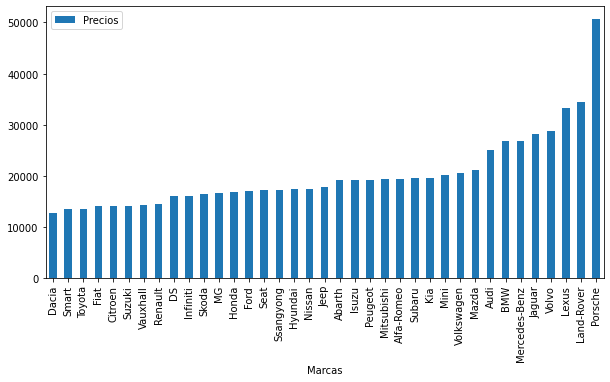

In [ ]:
ax = df_precios.plot.bar(x='Marcas', y='Precios',figsize=(10,5))

De la gráfica anterior, he considerado establecer las diferentes gamas según los escalones que aparecen. Es decir:

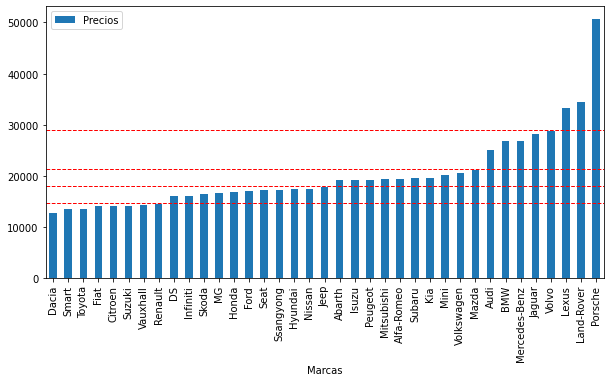

In [ ]:
ax = df_precios.plot.bar(x='Marcas', y='Precios',figsize=(10,5))
ax.axhline(y=14700, color='r', linestyle='--', lw=1)
ax.axhline(y=18100, color='r', linestyle='--', lw=1)
ax.axhline(y=21400, color='r', linestyle='--', lw=1)
ax.axhline(y=29000, color='r', linestyle='--', lw=1)

Los 3 primeros escalones aparecen de forma más natural, de manera que tenemos:
* Gama baja: Dacia, Smart, Toyota, Fiat, Citroen, Suzuki, Vauxhall y Renault
* Gama media-baja: DS, Infiniti, Skoda, MG, Honda, Ford, Seat, SSangyong, Hyundai, Nissan, Jeep
* Gama media-alta: Abarth, Isuzu, Peugeot, Mitsubishi, Alfa-Romeo, Subaru, Kia, Mini, Volkswagen, Mazda

Los siguientes dos escalones son más subjetivos porque hay mucha más variabilidad en los precios. He optado por hacer la distinción entre gama alta y gama muy alta cuando el escalón es más profundo, pero esto está sujeto a mi opinión. Quizá sería igualmente válido no hacer separación alguna entre estos coches y considerarlos todos como gama alta, o incluso hacer una distinción más entre gama muy alta y gama lujo, albergando esta última al Porsche. Según mi criterio, quedaría:
* Gama alta: Audi, BMW, Mercedes-Benz, Jaguar, Volvo
* Gama muy alta: Lexus, Land-Rover, Porsche


Si hacemos un encoding para pasarla a numérico, el 0 corresponde a la gama baja y el 4 a la gama muy alta.

In [ ]:
marcas = {'Dacia': '0', 'Smart': '0', 'Toyota': '0', 'Fiat': '0', 'Citroen': '0', 
          'Suzuki': '0', 'Vauxhall': '0', 'Renault': '0', 

          'DS': '1', 'Infiniti': '1', 'Skoda': '1', 'MG': '1', 'Honda': '1', 'Ford': '1',
          'Seat': '1', 'Ssangyong': '1', 'Hyundai': '1', 'Nissan': '1', 'Jeep': '1',

          'Abarth': '2', 'Isuzu': '2', 'Peugeot': '2', 'Mitsubishi': '2', 'Alfa-Romeo': '2',
          'Subaru': '2', 'Kia': '2', 'Mini': '2', 'Volkswagen': '2', 'Mazda': '2',

          'Audi':'3', 'BMW':'3', 'Mercedes-Benz':'3', 'Jaguar':'3', 'Volvo':'3',
          
          'Lexus':'4', 'Land-Rover':'4', 'Porsche': '4'}

df_completo['Gama']= df_completo['Marca'].map(marcas)

In [ ]:
df_completo.columns

Index(['Marca', 'Modelo', 'Versión', 'Año', 'Mes', 'Kilometros', 'Marchas',
       'Combustible', 'Cilindrada del motor en L', 'Asientos',
       'Dueños anteriores', 'Emisiones en g/km', 'Tracción',
       'Potencia del motor en bhp', 'Segmento', 'Capacidad del tanque en L',
       'Consumo en L/100Km', 'Precio en €', 'Carrocería_Convertible',
       'Carrocería_Coupe', 'Carrocería_Estate', 'Carrocería_Hatchback',
       'Carrocería_MPV', 'Carrocería_Pickup', 'Carrocería_SUV',
       'Carrocería_Saloon', 'Carrocería_Van', 'Color_Black', 'Color_Blue',
       'Color_Brown', 'Color_Green', 'Color_Grey', 'Color_Orange',
       'Color_Pink', 'Color_Purple', 'Color_Red', 'Color_White',
       'Color_Yellow', 'Gama'],
      dtype='object')

In [ ]:
df_completo = df_completo[['Marca', 'Modelo', 'Versión', 'Año', 'Mes', 'Kilometros', 'Marchas', 'Gama',
       'Combustible', 'Cilindrada del motor en L', 'Asientos',
       'Dueños anteriores', 'Emisiones en g/km', 'Tracción',
       'Potencia del motor en bhp', 'Segmento', 'Capacidad del tanque en L',
       'Consumo en L/100Km', 'Precio en €', 'Carrocería_Convertible',
       'Carrocería_Coupe', 'Carrocería_Estate', 'Carrocería_Hatchback',
       'Carrocería_MPV', 'Carrocería_Pickup', 'Carrocería_SUV',
       'Carrocería_Saloon', 'Carrocería_Van', 'Color_Black', 'Color_Blue',
       'Color_Brown', 'Color_Green', 'Color_Grey', 'Color_Orange',
       'Color_Pink', 'Color_Purple', 'Color_Red', 'Color_White',
       'Color_Yellow']]

###Almacenamiento datasets

Esto es únicamente para agilizar la ejecución y no realizar siempre el mismo tratamiento sobre el dataset inicial. Así, descargamos los datasets y los guardamos ya limpios en Drive para poder acceder a ellos directamente:

In [ ]:
df_no_combustion.to_csv('df_no_combustion.csv', index=False)
df_marcas_similares.to_csv('df_marcas_similares.csv', index=False)
df_completo.to_csv('df_completo.csv', index=False)

NameError: ignored

In [ ]:
from google.colab import files
files.download("df_no_combustion.csv")
files.download("df_marcas_similares.csv")
files.download("df_completo.csv")

FileNotFoundError: ignored

##Lectura final:

Para recapitular todo el tratamiento y limpieza de los datos inicial, veamos un resumen de los 3 datasets que hemos creado y vamos a utilizar:

* **df_no_combustion**: Un dataset de apenas 368 valores que contiene todos los coches híbridos y eléctricos. Dado su pequeño tamaño, es posible que no lo usemos para una regresión.

* **df_marcas_similares**: Un dataset de 1618 datos que consta de todos los vehículos de las marcas BMW, Audi y Mercedes-Benz. Se va a utilizar para realizar una regresión de la que a priori se esperan buenos resultados, pues se han elegido 3 marcas cuyos precios son equiparables y por tanto la comparación debería ser buena.

* **df_completo**: Dataset de 6504 valores que contiene todos los coches de combustión de la página web (a excepción de datos erróneos o anómalos). También se va a utilizar para realizar la regresión. En este caso, dada la gran variabilidad de marcas, la precisión de la predicción del precio puede ser inferior a lo esperado, por lo que se ha decidido añadir la variable *gama* que divide a los coches en subgrupos según el precio medio de la marca.

In [ ]:
df_no_combustion = pd.read_csv('/content/drive/MyDrive/Máster/TFM/df_no_combustion.csv')

In [ ]:
df_marcas_similares = pd.read_csv('/content/drive/MyDrive/Máster/TFM/df_marcas_similares.csv')

In [ ]:
df_completo = pd.read_csv('/content/drive/MyDrive/Máster/TFM/df_completo.csv')

##2. ANÁLISIS EXPLORATORIO

###Dataset reducido (BMW, Audi, Mercedes)

#### Estadísticos
En primer lugar, veamos algunos estadísticos del dataset:

In [ ]:
df_marcas_similares.describe(include='all')

,Marca,Modelo,Versión,Año,Mes,Kilometros,Marchas,Combustible,Cilindrada del motor en L,Asientos,...,Carrocería_Van,Color_Black,Color_Blue,Color_Brown,Color_Green,Color_Grey,Color_Orange,Color_Red,Color_White,Color_Yellow
count,1618,1618,1618,1618.000000,1618.000000,1618.000000,1618.000000,1618.000000,1618.000000,1618.000000,...,1618.000000,1618.000000,1618.000000,1618.000000,1618.000000,1618.000000,1618.000000,1618.000000,1618.000000,1618.000000
unique,3,62,285,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Mercedes-Benz,A Class,1L Sport TFSI,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,575,250,51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,2018.227441,5.966007,48427.562044,0.737330,0.375773,1.827503,4.848578,...,0.001236,0.257726,0.123609,0.001236,0.001236,0.306551,0.011743,0.066749,0.226823,0.004326
std,NaN,NaN,NaN,1.242989,3.049289,23530.008178,0.440221,0.484471,0.510887,0.527477,...,0.035147,0.437517,0.329237,0.035147,0.035147,0.461204,0.107760,0.249664,0.418907,0.065653
min,NaN,NaN,NaN,2014.000000,1.000000,785.358000,0.000000,0.000000,1.000000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,NaN,NaN,NaN,2017.000000,3.000000,31692.330250,0.000000,0.000000,1.500000,5.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,NaN,NaN,NaN,2018.000000,6.000000,45490.409000,1.000000,0.000000,1.900000,5.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,NaN,NaN,NaN,2019.000000,9.000000,62120.523750,1.000000,1.000000,2.000000,5.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000


De la tabla anterior se puede extraer información interesante acerca de los coches de estas marcas que se encuentran a la venta en Cazoo: por ejemplo, el año medio de los vehículos es 2018, el nº de asientos es 5, el consumo de 5,7l/100Km y el precio es de 26300 euros. El coche más caro entre estas marcas es de 65313 euros, mientras que el más barato es de 11446. La marca con mayor número de coches es Mercedes-Benz, y el modelo el A Class.

#### Scatter plot

Hacemos un scatter plot quitando las variables con las que hemos hecho con One-Hot encoding:

In [ ]:
def plotScatterMatrix(df, plotSize, textSize):
  try:
    df = df.select_dtypes(include =[np.number]) # seleccionamos solo columnas numéricas
    # eliminacion de filas y columnas que conduzcan a una matriz singular
    df = df.dropna('columns')
    #df = df[[col for col in df if df[col].nunique() > 1]] # selecciona columnas donde hay mas de un unico valor
    columnNames = list(df) 
    columnNames = columnNames[:14]
    df = df[columnNames]
    ax = pd.plotting.scatter_matrix(df, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate(round(corrs[i, j],2), (0.6, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize) #rotation = 90 
    for ax in ax.flatten():
        ax.xaxis.set_ticks([])
        ax.yaxis.set_ticks([])
        ax.xaxis.label.set_rotation(90)
        ax.yaxis.label.set_rotation(0)
        ax.yaxis.label.set_ha('right')
    plt.show()
  except: pass

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.dropna will be keyword-only
  """


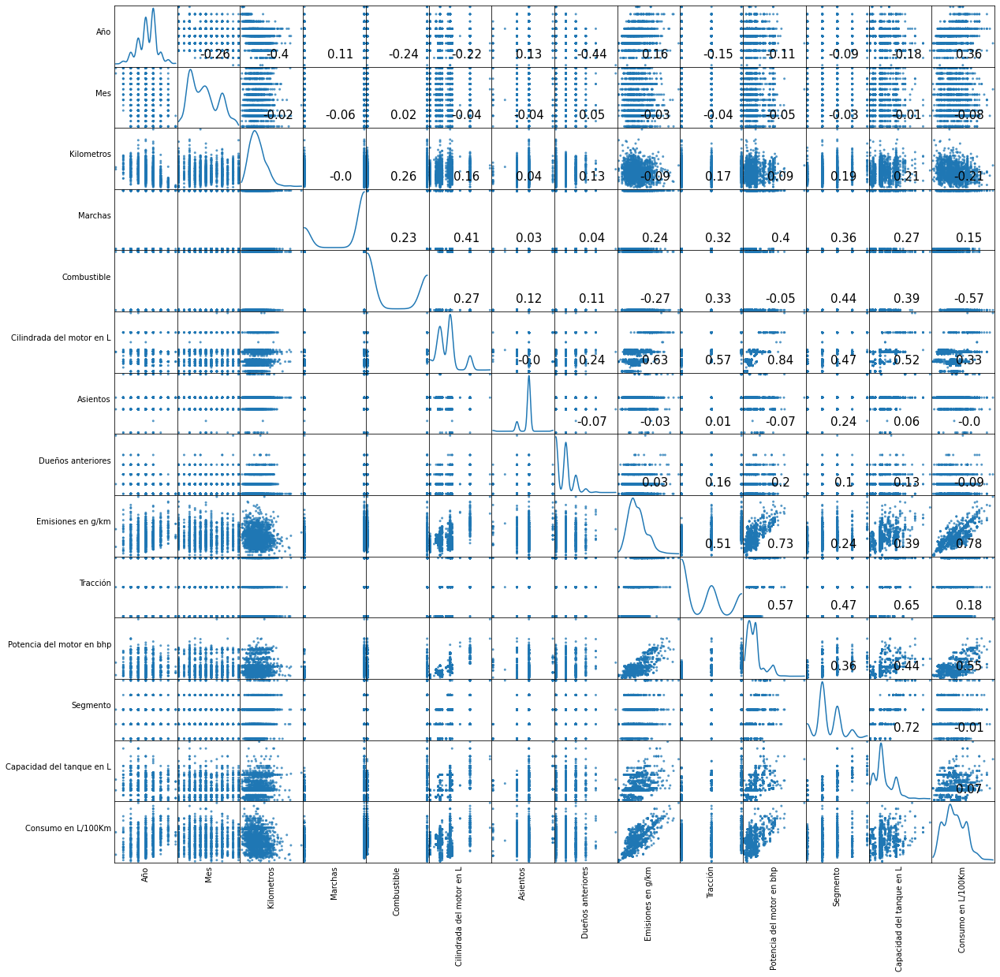

In [ ]:
plotScatterMatrix(df_marcas_similares,20,15) 

La gráfica anterior muestra la correlación entre cada una de las variables, tanto gráficamente (en forma de recta ascendente si es una correlación directa, y descendente si es indirecta) como numéricamente con el valor que acompaña a cada subplot.

Así, podemos ver que existen algunas variables que estan fuertemente relacionadas entre sí dentro del dataset que estamos trabajando. El valor máximo de correlación lo obtenemos entre las columnas de *Cilindrada del motor en L* y *Potencia del motor en bhp*, con un valor de 0.84 (recordemos que un valor a 1 indica total correlación y un valor de 0 ninguna). Esta correlación ya la sabíamos a priori, pues se trata de dos columnas estrechamente relacionadas de una forma obvia. Existen otras variables cuyas gráficas presentan una clara tendencia lineal: por ejemplo, *Emisiones en g/km-Potencia del motor en bhp*, *Emisiones en g/km-Consumo en L/100Km* o *Segmento-Capacidad del tanque en L*.

Todas estas correlaciones son obvias, pero nos sirven para averiguar si es posible eliminar algunas de las variables presentes en el dataset. Dado que los valores de estas no son superiores a 0.8 a pesar de la clara tendencia lineal de sus gráficas, lo lógico es mantener todas las variables anteriormente mencionadas, considerando únicamente deshacernos de una de las dos primeras, cuyo valor de 0.84 indicaba una mayor correlación: *Cilindrada del motor en L* y *Potencia del motor en bhp*.

Por tanto, más adelante veremos si nos es útil eliminar una de estas dos variables y cuál de ellas debemos eliminar para mejorar las predicciones.

#### Density plot

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.dropna will be keyword-only
  This is separate from the ipykernel package so we can avoid doing imports until


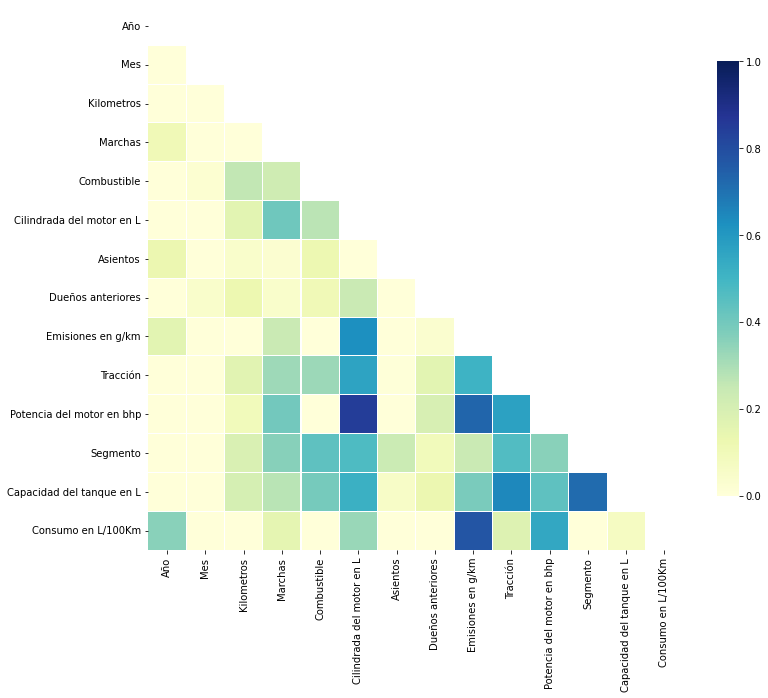

In [ ]:
df_density = df_marcas_similares.select_dtypes(include =[np.number]) # seleccionamos solo columnas numéricas
# eliminacion de filas y columnas que conduzcan a una matriz singular
df_density = df_density.dropna('columns')
#df = df[[col for col in df if df[col].nunique() > 1]] # selecciona columnas donde hay mas de un unico valor
columnNames = list(df_density) 
columnNames = columnNames[:14]
df_density= df_density[columnNames]

# Computo de la matriz de correlacion
corr = df_density.corr()
# cubrimos la triangular superior
mask = np.zeros_like(corr, dtype=bool) 
mask[np.triu_indices_from(mask)] = True
# configuramos la figura matplotlib
f, ax = plt.subplots(figsize=(12, 10))
# Dibujo del heatmap 
sns.heatmap(corr, mask=mask, vmin = 0.0, vmax=1.0, center=0.5, linewidths=.1, cmap="YlGnBu", cbar_kws={"shrink": .8})
plt.show()

Esta otra gráfica nos aporta la misma información que la anterior pero en forma de gráfico de densidades, en el que los valores de correlación más cercanos a 0 se pintan de amarillo y los más cercanos a 1 de azul. Observamos el prominente color azul de las dos variables estrechamente relacionadas anteriormente, así como el color más difuminado del resto de variables que también presentan relación lineal.

###Dataset completo

#### Estadísticos
En primer lugar, veamos algunos estadísticos del dataset:

In [ ]:
df_completo.describe(include='all')

,Marca,Modelo,Versión,Año,Mes,Kilometros,Marchas,Gama,Combustible,Cilindrada del motor en L,...,Color_Blue,Color_Brown,Color_Green,Color_Grey,Color_Orange,Color_Pink,Color_Purple,Color_Red,Color_White,Color_Yellow
count,6504,6504,6504,6504.000000,6504.000000,6504.000000,6504.000000,6504.000000,6504.000000,6504.000000,...,6504.000000,6504.000000,6504.000000,6504.000000,6504.000000,6504.000000,6504.000000,6504.000000,6504.000000,6504.000000
unique,37,293,1427,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Ford,Fiesta,1L Titanium EcoBoost T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,759,271,116,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,2018.232472,6.131150,43989.949976,0.424047,1.782134,0.307964,1.563038,...,0.147601,0.008918,0.008610,0.284902,0.016144,0.000308,0.002306,0.129920,0.190498,0.011070
std,NaN,NaN,NaN,1.413153,3.132895,24402.252665,0.494235,1.124174,0.461687,0.459816,...,0.354732,0.094018,0.092397,0.451402,0.126039,0.017534,0.047972,0.336241,0.392724,0.104639
min,NaN,NaN,NaN,2014.000000,1.000000,24.140000,0.000000,0.000000,0.000000,0.900000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,NaN,NaN,NaN,2017.000000,3.000000,25772.372750,0.000000,1.000000,0.000000,1.200000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,NaN,NaN,NaN,2018.000000,6.000000,41180.596500,0.000000,2.000000,0.000000,1.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,NaN,NaN,NaN,2019.000000,9.000000,59195.950750,1.000000,3.000000,1.000000,2.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


#### Scatter plot

Hacemos un scatter plot quitando las variables que hemos hecho con One-Hot encoding:

In [ ]:
def plotScatterMatrix(df, plotSize, textSize):
  try:
    df = df.select_dtypes(include =[np.number]) # seleccionamos solo columnas numéricas
    # eliminacion de filas y columnas que conduzcan a una matriz singular
    df = df.dropna('columns')
    #df = df[[col for col in df if df[col].nunique() > 1]] # selecciona columnas donde hay mas de un unico valor
    columnNames = list(df) 
    columnNames = columnNames[:15]
    df = df[columnNames]
    ax = pd.plotting.scatter_matrix(df, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate(round(corrs[i, j],2), (0.6, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize) #rotation = 90 
    for ax in ax.flatten():
        ax.xaxis.set_ticks([])
        ax.yaxis.set_ticks([])
        ax.xaxis.label.set_rotation(90)
        ax.yaxis.label.set_rotation(0)
        ax.yaxis.label.set_ha('right')
    plt.show()
  except: pass

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.dropna will be keyword-only
  """


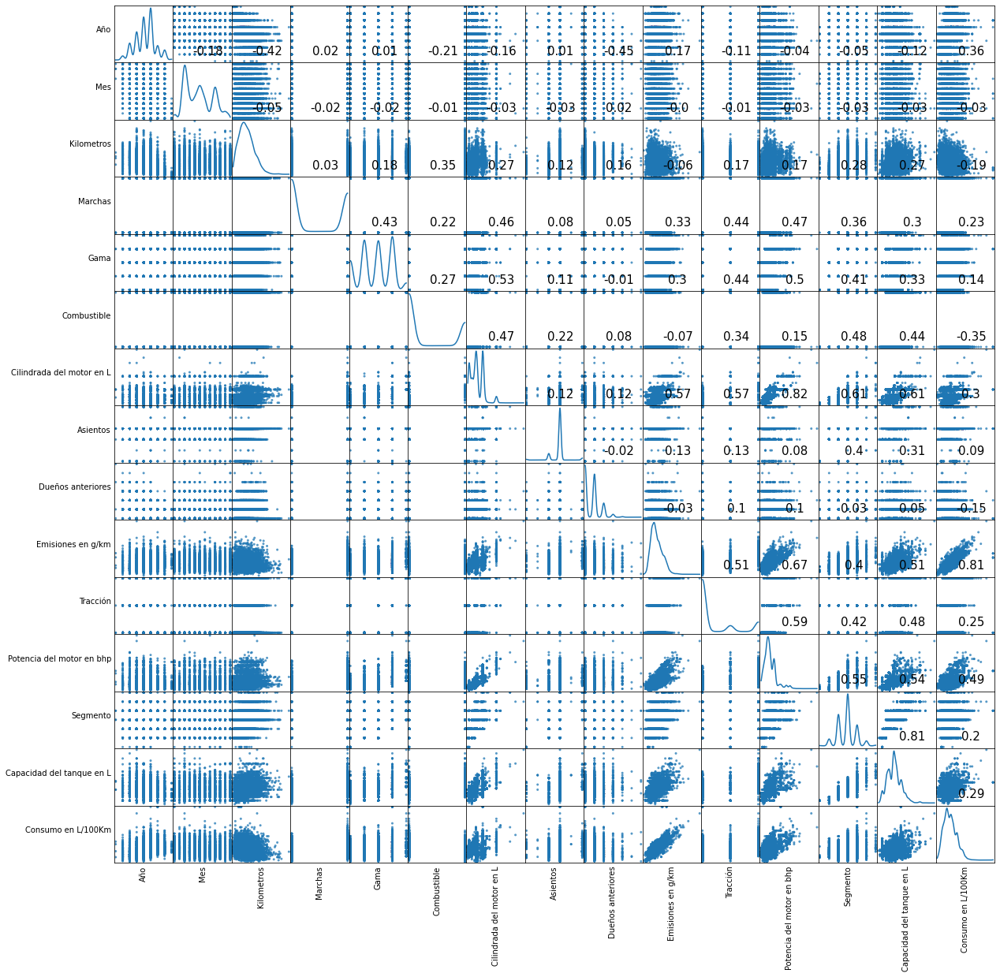

In [ ]:
plotScatterMatrix(df_completo,20,15) 

Dado que el espacio muestral es ahora mayor, los valores obtenidos en el dataset reducido han variado un poco, pero la tendencia sigue siendo la misma. De hecho, puesto que hay un mayor número de datos (y de variabilidad), las correlaciones entre las variables son más precisas en este dataset, por lo que columnas ya mencionadas anteriormente como *Emisiones en g/km-Consumo en L/100Km* o *Segmento-Capacidad del tanque en L*, presentan ahora valores más claros y superiores al 0.80. De la misma forma, las columnas *Emisiones en g/km-Potencia del motor en bhp* han reducido su grado de correlación, algo que también ocurre con las columnas de *Cilindrada del motor en L y Potencia del motor en bhp*, que aunque siguen siendo las que presentan una mayor relación lineal, han disminuido su valor de 0.84 a 0.82.

Por tanto, ahora tenemos una visión más clara y completa del dataset, y sabemos que existen 3 pares de columnas cuya correlación es superior a 0.80. Más adelante, cuando estudiemos los métodos de filtrado para regresión, veremos si es idóneo eliminar algunas columnas del dataset, para lo cual ya sabemos cuáles de ellas están más estrechamente relacionadas y aportan menos información.

#### Density plot

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.dropna will be keyword-only
  This is separate from the ipykernel package so we can avoid doing imports until


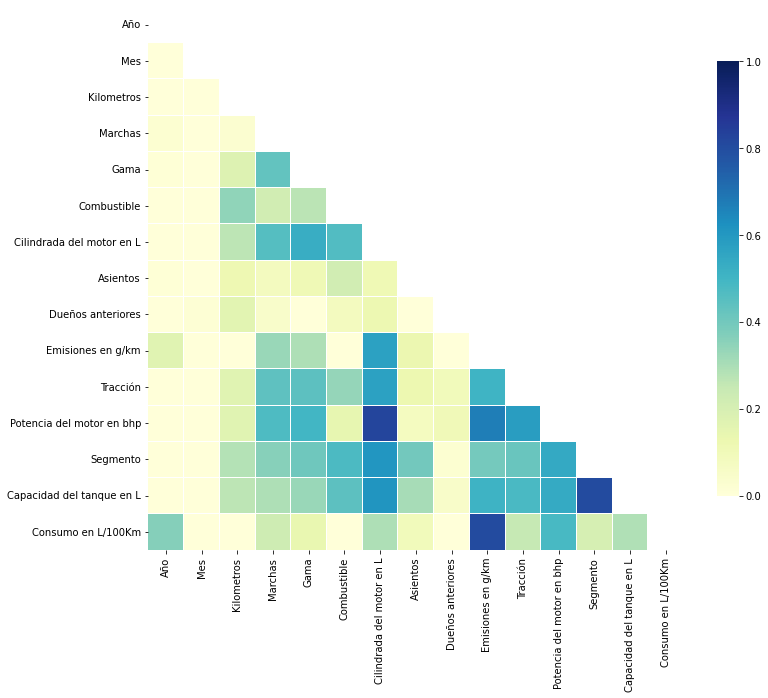

In [ ]:
df_density = df_completo.select_dtypes(include =[np.number]) # seleccionamos solo columnas numéricas
# eliminacion de filas y columnas que conduzcan a una matriz singular
df_density = df_density.dropna('columns')
#df = df[[col for col in df if df[col].nunique() > 1]] # selecciona columnas donde hay mas de un unico valor
columnNames = list(df_density) 
columnNames = columnNames[:15]
df_density= df_density[columnNames]

# Computo de la matriz de correlacion
corr = df_density.corr()
# cubrimos la triangular superior
mask = np.zeros_like(corr, dtype=bool) 
mask[np.triu_indices_from(mask)] = True
# configuramos la figura matplotlib
f, ax = plt.subplots(figsize=(12, 10))
# Dibujo del heatmap 
sns.heatmap(corr, mask=mask, vmin = 0.0, vmax=1.0, center=0.5, linewidths=.1, cmap="YlGnBu", cbar_kws={"shrink": .8})
plt.show()

##3. SELECCIÓN DE CARACTERÍSTICAS

###Métodos de filtrado simples:

* [f_regression](http://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.f_regression.html#sklearn.feature_selection.f_regression): evalúa la significancia del coeficiente de correlación de Pearson.
* [mutual_info_regression](http://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.mutual_info_regression.html#sklearn.feature_selection.mutual_info_regression): calcula una estima de la información mutua entre cada característica y la variable objetivo.

####Dataset reducido (BMW, Audi, Mercedes)

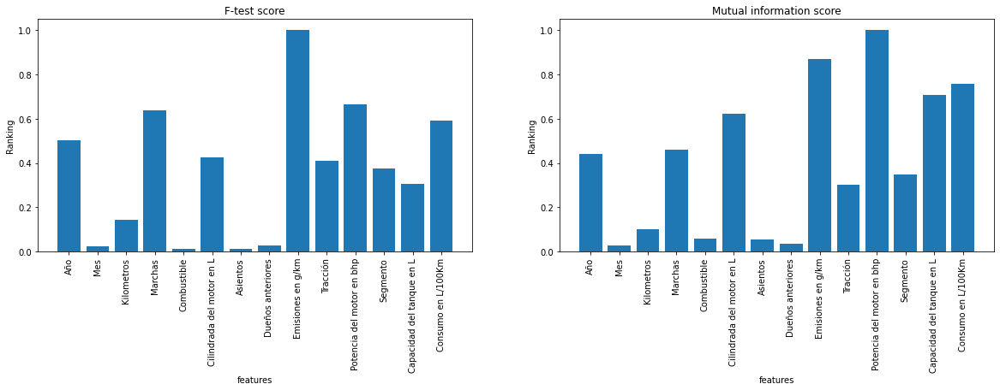

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_marcas_similares.to_numpy()

y = pd.to_numeric(data[:, 17])     # nos quedamos con la columna del precio, que es la nº 17 y es nuestra variable objetivo
X = data[:,3:17]                   # nos quedamos con el resto de variables numéricas sin one hot encoding

feature_names = df_marcas_similares.columns[3:17]

# do calculations
f_test, _ = f_regression(X, y)
f_test /= np.max(f_test)

mi = mutual_info_regression(X, y)
mi /= np.max(mi)

# do some plotting
plt.figure(figsize=(20, 5))

plt.subplot(1,2,1)
plt.bar(range(X.shape[1]), f_test,  align="center")
plt.xticks(range(X.shape[1]), feature_names, rotation = 90)
plt.xlabel('features')
plt.ylabel('Ranking')
plt.title('F-test score')

plt.subplot(1,2,2)
plt.bar(range(X.shape[1]), mi, align="center")
plt.xticks(range(X.shape[1]), feature_names, rotation = 90)
plt.xlabel('features')
plt.ylabel('Ranking')
plt.title('Mutual information score')

plt.show()

De la tabla anterior observamos que:

* La variable *Emisiones en g/km* presenta relación lineal con la variable objetivo (precio). Siendo menos estrictos, quizá también podríamos incluir las variables de *Marchas, Potencia del motor y Consumo*.

* Las variables *Emisiones y Potencia del motor* presentan relación no lineal con el precio del vehículo, así como también en menor medida el *Consumo, la Capacidad del tanque o la Cilindrada*.

Esto nos está indicando que estas variables anteriormente mencionadas son las que más influyen a la hora de determinar el precio del vehículo dentro de este dataset (es decir, dentro de los coches cuya marca es Mercedes, BMW o Audi).

####Dataset completo

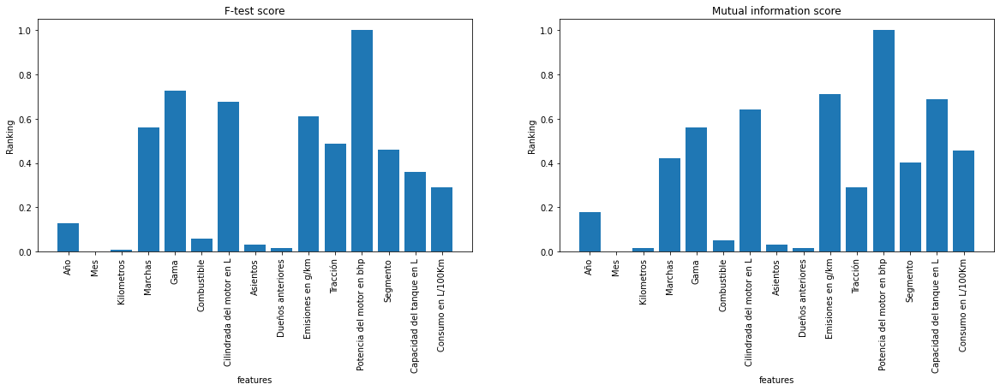

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_completo.to_numpy()

y = pd.to_numeric(data[:, 18])     # nos quedamos con la columna del precio, que es la nº 18 y es nuestra variable objetivo
X = data[:,3:18]                   # nos quedamos con el resto de variables numéricas sin one hot encoding

feature_names = df_completo.columns[3:18]

# do calculations
f_test, _ = f_regression(X, y)
f_test /= np.max(f_test)

mi = mutual_info_regression(X, y)
mi /= np.max(mi)

# do some plotting
plt.figure(figsize=(20, 5))

plt.subplot(1,2,1)
plt.bar(range(X.shape[1]), f_test,  align="center")
plt.xticks(range(X.shape[1]), feature_names, rotation = 90)
plt.xlabel('features')
plt.ylabel('Ranking')
plt.title('F-test score')

plt.subplot(1,2,2)
plt.bar(range(X.shape[1]), mi, align="center")
plt.xticks(range(X.shape[1]), feature_names, rotation = 90)
plt.xlabel('features')
plt.ylabel('Ranking')
plt.title('Mutual information score')

plt.show()

Si bien para el dataset anterior la variable dominante en el precio del vehículo eran las *Emisiones*, ahora podemos comprobar que para el dataset completo, en el que se encuentran todas las marcas, el precio se ve más influido por la *Potencia del motor*, que presenta una alta relación tanto lineal como no lineal con la variable objetivo. Además, la variable *Gama* incluida en este dataset es la segunda con mayor relación lineal con el precio.

Las variables *Emisiones, Cilindrada y Capacidad del tanque* siguen teniendo una menor relación no lineal con el precio.

Esto nos viene a decir que a la hora de determinar el precio de un coche influye mucho la marca del mismo, pues acabamos de ver como para coches de las marcas BMW, Audi y Mercedes, se le da más importancia a las Emisiones (debido a que son coches cuya alta potencia de motor se puede dar por supuesto). Por el contrario, para coches pertenecientes a todas las marcas, el precio del vehículo vendrá dictaminado en alta medida por su potencia, pues esta es la característica principal del motor, que es la parte más importante del vehículo.

###Métodos *embedded*:

Los métodos Wrapped también se pueden usar para seleccionar las características idóneas dentro del dataset, pero se usan poco porque son del tipo caja negra: el algoritmo separa y elige pero no podemos saber el motivo. 

Es por esto que he decidido usar los métodos embedded, que son más seguros y usan Lasso. 

Lasso se refiere al modelo de regresión lineal con penalización sobre la suma de las magnitudes de los coeficientes (norma 1):

$$\min_{\boldsymbol{\omega}}|| \mathbf{y} - \mathbf{X}\boldsymbol{\omega}||_2^2 + \alpha ||\boldsymbol{\omega} ||_1$$

donde $||\boldsymbol{\omega} ||_1 = |\omega_1| + |\omega_2| + \ldots + |\omega_D|$, siendo $D$ el número de atributos ($\omega_0$ no se tiene en cuenta en esta penalización).

Con esta formulación el algoritmo LASSO permite activar/desactivar coeficientes, de tal forma que se desactivan primero los coeficientes asociados a los atributos que menos influyen en la función de coste (función a minimizar anterior). Con ello:

1. Se previene el overfitting, al poder utilizar modelos con menos variables (las desactivamos)
2. Se gana interpretabilidad, al poder ver cómo evolucionan las variables supervivientes y poder explicar los resultados en base a menos variables.

La activación y desactivación de variables está determinada por el parámetro de regularización $\alpha$, de la misma forma que sucede en el algoritmo Ridge:

* Si $\alpha = 0$, entonces el resultado coincide con un modelo de [regresión lineal](http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html).
* Si $\alpha \to \infty$, entonces el valor de todos los coeficientes será nulo.

####Dataset reducido (BMW, Audi, Mercedes)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn

data = df_marcas_similares.values.copy()


y = np.log10(pd.to_numeric(data[:, 17]))    # nos quedamos con la 17º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data[:,3:17]                            # nos quedamos con el resto de variables numéricas sin one hot encoding

feature_names = df_marcas_similares.columns[3:17]  

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  
                                                      
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (1213, 14)
Datos test:  (405, 14)


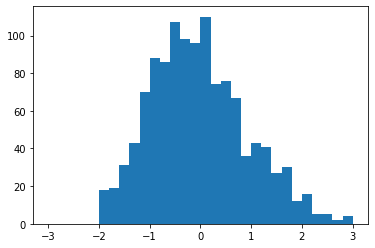

In [ ]:
plt.hist(X_train_scaled[:,2], range = [-3, 3], bins=30)
plt.show()

best mean cross-validation score: -0.002
best parameters: {'alpha': 3.039195382313195e-05}


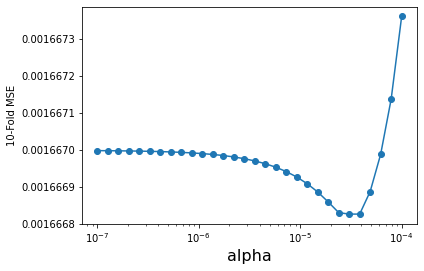

In [ ]:
K = 10 # número de folds

# Rango de búsqueda del parámetro de regularización (mejor en escala logarítmica)
alpha_vector = np.logspace(-7, -4, 30)

param_grid = {'alpha': alpha_vector}
grid = GridSearchCV(Lasso(), scoring= 'neg_mean_squared_error', param_grid=param_grid, cv = K)
grid.fit(X_train_scaled, y_train)
print("best mean cross-validation score: {:.3f}".format(grid.best_score_))
print("best parameters: {}".format(grid.best_params_))

scores = -1*np.array(grid.cv_results_['mean_test_score'])
plt.semilogx(alpha_vector, scores,'-o')
plt.xlabel('alpha', fontsize=16)
plt.ylabel('{}-Fold MSE'.format(K))
plt.show()

In [ ]:
alpha_optimo_dataset_reducido = grid.best_params_['alpha']

lasso = Lasso(alpha = alpha_optimo_dataset_reducido).fit(X_train_scaled, y_train)

ytrainLasso = lasso.predict(X_train_scaled)
ytestLasso  = lasso.predict(X_test_scaled)
mseTrainModelLasso = mean_squared_error(y_train, ytrainLasso)
mseTestModelLasso = mean_squared_error(y_test, ytestLasso)

print('alpha: %0.3g' % alpha_optimo_dataset_reducido)

print('MSE Modelo Lasso (train): %0.3g' % mseTrainModelLasso)
print('MSE Modelo Lasso (test) : %0.3g' % mseTestModelLasso)

print('RMSE Modelo Lasso (train): %0.3g' % np.sqrt(mseTrainModelLasso))
print('RMSE Modelo Lasso (test) : %0.3g' % np.sqrt(mseTestModelLasso))

w = lasso.coef_
for f, wi in zip(feature_names, w):
    print("{}: {}".format(f, wi))

alpha: 3.04e-05
MSE Modelo Lasso (train): 0.00161
MSE Modelo Lasso (test) : 0.00195
RMSE Modelo Lasso (train): 0.0401
RMSE Modelo Lasso (test) : 0.0442
Año: 0.041933239404367766
Mes: 0.003235947138469494
Kilometros: -0.02005435851559663
Marchas: 0.028377269705898583
Combustible: 0.03502653084523347
Cilindrada del motor en L: -0.02508674637590921
Asientos: -0.00437017759440053
Dueños anteriores: -0.0017639512576960378
Emisiones en g/km: 0.02484331578919502
Tracción: 0.0014364902385700991
Potencia del motor en bhp: 0.03820472404798822
Segmento: 0.020592006075312065
Capacidad del tanque en L: 0.0011006153914724457
Consumo en L/100Km: 0.02166226709656953


Vemos que al utilizar el alpha óptimo los coeficientes de todas las variables son distintas de 0, lo que nos indica que todas ellas intervienen en el cálculo del precio. 

Además, podemos observar como la mayoría de ellas tienen una relación directa con el precio: cuando estas aumentan, el precio también lo hace. No obstante, los *Kilómetros* tienen una relación inversa: a medida que aumentan, disminuye el precio, lo cual tiene sentido porque cuantos menos kilómetros, más nuevo el coche. Lo mismo sucede con los *Dueños anteriores*, cuantos más dueños, menos precio. Sin embargo, lo que no termino de entender es por qué la *Cilindrada y los Asientos* también tienen una relación negativa con el precio. A mayor cilindrada, mejor motor y por tanto el precio debería aumentar. Con los asientos pasa lo mismo, pues más asientos es más tamaño; no obstante, este último razonamiento es más limitado, pues estamos en el dataset de los coches BMW, Audi y Mercedes, y los coches con menos asientos siempre serán los deportivos o los de lujo dentro de estas marcas, por lo que es posible que esta última variable sí tenga sentido como relación inversa.

Sabemos que es posible aumentar el valor del alpha óptimo. Esto implica aumentar el error, pero generalmente sirve para reducir el número de variables significativas, lo que aumenta la interpretabilidad y reduce las posibilidades de que se produzca overfitting. Por tanto, probemos a ver que sucede con un alpha mayor:

In [ ]:
alpha_incrementado_dataset_reducido = 9e-3

lasso = Lasso(alpha = alpha_incrementado_dataset_reducido).fit(X_train_scaled, y_train)

ytrainLasso = lasso.predict(X_train_scaled)
ytestLasso  = lasso.predict(X_test_scaled)
mseTrainModelLasso = mean_squared_error(y_train, ytrainLasso)
mseTestModelLasso = mean_squared_error(y_test, ytestLasso)

print('alpha: %0.3g' % alpha_incrementado_dataset_reducido)

print('MSE Modelo Lasso (train): %0.3g' % mseTrainModelLasso)
print('MSE Modelo Lasso (test) : %0.3g' % mseTestModelLasso)

print('RMSE Modelo Lasso (train): %0.3g' % np.sqrt(mseTrainModelLasso))
print('RMSE Modelo Lasso (test) : %0.3g' % np.sqrt(mseTestModelLasso))

w = lasso.coef_
for f, wi in zip(feature_names, w):
    print("{}: {}".format(f, wi))

alpha: 0.009
MSE Modelo Lasso (train): 0.00226
MSE Modelo Lasso (test) : 0.00242
RMSE Modelo Lasso (train): 0.0475
RMSE Modelo Lasso (test) : 0.0492
Año: 0.04031758010469868
Mes: 0.0
Kilometros: -0.009926517101245732
Marchas: 0.028826011007251837
Combustible: 0.00286092172521803
Cilindrada del motor en L: 0.0
Asientos: -0.0
Dueños anteriores: -0.0
Emisiones en g/km: 0.02268447222481293
Tracción: 0.005362804688967626
Potencia del motor en bhp: 0.016756616030451095
Segmento: 0.016664952218634288
Capacidad del tanque en L: 0.0005113555646251046
Consumo en L/100Km: 0.0007973074250268462


Con un valor mayor de alpha comprobamos como, efectivamente, el error aumenta pero a consta de grandes beneficios: 

* Varias variables han dejado de tener importancia y podrían ser eliminadas del modelo: *Mes, Cilindrada, Asientos y Dueños anteriores*.

* El resto de características parecen seguir un criterio lógico, por lo que es interesante considerar este modelo a la hora de realizar la regresión.

####Dataset completo

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn

data = df_completo.values.copy()


y = np.log10(pd.to_numeric(data[:, 18]))    # nos quedamos con la 18º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data[:,3:18]                            # nos quedamos con el resto de variables numéricas sin one hot encoding

feature_names = df_completo.columns[3:18]  

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (4878, 15)
Datos test:  (1626, 15)


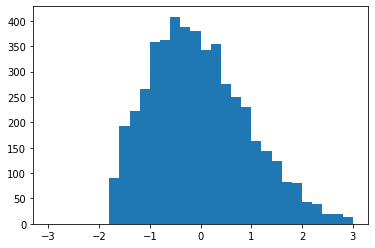

In [ ]:
plt.hist(X_train_scaled[:,2], range = [-3, 3], bins=30)
plt.show()

best mean cross-validation score: -0.003
best parameters: {'alpha': 0.00010826367338740541}


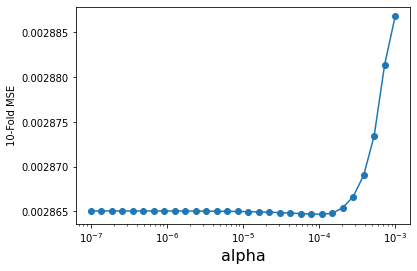

In [ ]:
K = 10 # número de folds

# Rango de búsqueda del parámetro de regularización (mejor en escala logarítmica)
alpha_vector = np.logspace(-7, -3, 30)

param_grid = {'alpha': alpha_vector}
grid = GridSearchCV(Lasso(), scoring= 'neg_mean_squared_error', param_grid=param_grid, cv = K)
grid.fit(X_train_scaled, y_train)
print("best mean cross-validation score: {:.3f}".format(grid.best_score_))
print("best parameters: {}".format(grid.best_params_))

scores = -1*np.array(grid.cv_results_['mean_test_score'])
plt.semilogx(alpha_vector, scores,'-o')
plt.xlabel('alpha', fontsize=16)
plt.ylabel('{}-Fold MSE'.format(K))
#plt.ylim((-1, 0))
plt.show()

In [ ]:
alpha_optimo_dataset_completo = grid.best_params_['alpha']

lasso = Lasso(alpha = alpha_optimo_dataset_completo).fit(X_train_scaled, y_train)

ytrainLasso = lasso.predict(X_train_scaled)
ytestLasso  = lasso.predict(X_test_scaled)
mseTrainModelLasso = mean_squared_error(y_train, ytrainLasso)
mseTestModelLasso = mean_squared_error(y_test, ytestLasso)

print('alpha: %0.3g' % alpha_optimo_dataset_completo)
  
print('MSE Modelo Lasso (train): %0.3g' % mseTrainModelLasso)
print('MSE Modelo Lasso (test) : %0.3g' % mseTestModelLasso)

print('RMSE Modelo Lasso (train): %0.3g' % np.sqrt(mseTrainModelLasso))
print('RMSE Modelo Lasso (test) : %0.3g' % np.sqrt(mseTestModelLasso))

w = lasso.coef_
for f, wi in zip(feature_names, w):
    print("{}: {}".format(f, wi))

alpha: 0.000108
MSE Modelo Lasso (train): 0.00284
MSE Modelo Lasso (test) : 0.00288
RMSE Modelo Lasso (train): 0.0533
RMSE Modelo Lasso (test) : 0.0537
Año: 0.050395169997365145
Mes: 0.0057285368172996405
Kilometros: -0.024739306181224125
Marchas: 0.030719667703913305
Gama: 0.05165396334383427
Combustible: 0.01727156970443262
Cilindrada del motor en L: -0.00891795111686267
Asientos: -0.0014499562660305065
Dueños anteriores: -0.004127516145113625
Emisiones en g/km: 0.012473812078643863
Tracción: 0.0052270458503835965
Potencia del motor en bhp: 0.05131261741051805
Segmento: 0.024892686416221818
Capacidad del tanque en L: 0.00529678042402825
Consumo en L/100Km: 0.0005593239737954123


En primera instancia, observamos como la gráfica de obtención del valor del alpha óptimo es casi una línea recta con un mínimo muy poco pronunciado, a diferencia de lo que veíamos en el dataset reducido.

Además, de nuevo obtenemos que todas las variables son distintas de 0, lo que nos indica que todas ellas intervienen en el cálculo del precio. Si nos fijamos, las variables con relación inversa son exactamente las mismas que para el otro dataset.

Los datos obtenidos para este alpha óptimo parecen corresponderse con lo ya visto en el otro dataset, por lo que no vamos a conformarnos únicamente con estos datos y vamos a aumentar el valor del alpha para ver que resultados obtenemos:

In [ ]:
alpha_incrementado_dataset_completo = 8e-4
lasso = Lasso(alpha = alpha_incrementado_dataset_completo).fit(X_train_scaled, y_train)

ytrainLasso = lasso.predict(X_train_scaled)
ytestLasso  = lasso.predict(X_test_scaled)
mseTrainModelLasso = mean_squared_error(y_train, ytrainLasso)
mseTestModelLasso = mean_squared_error(y_test, ytestLasso)

print('alpha: %0.3g' % alpha_incrementado_dataset_completo)

print('MSE Modelo Lasso (train): %0.3g' % mseTrainModelLasso)
print('MSE Modelo Lasso (test) : %0.3g' % mseTestModelLasso)

print('RMSE Modelo Lasso (train): %0.3g' % np.sqrt(mseTrainModelLasso))
print('RMSE Modelo Lasso (test) : %0.3g' % np.sqrt(mseTestModelLasso))

w = lasso.coef_
for f, wi in zip(feature_names, w):
    print("{}: {}".format(f, wi))

alpha: 0.0008
MSE Modelo Lasso (train): 0.00287
MSE Modelo Lasso (test) : 0.00291
RMSE Modelo Lasso (train): 0.0535
RMSE Modelo Lasso (test) : 0.0539
Año: 0.0508588945892767
Mes: 0.005205514833420807
Kilometros: -0.02391411182113972
Marchas: 0.03050183984274226
Gama: 0.05066072438982735
Combustible: 0.012970008341135363
Cilindrada del motor en L: -0.00037593565647205595
Asientos: -0.0
Dueños anteriores: -0.0036359744014099094
Emisiones en g/km: 0.010841400597480108
Tracción: 0.00570782177127302
Potencia del motor en bhp: 0.04601010526759473
Segmento: 0.024227785780852284
Capacidad del tanque en L: 0.005221859569341289
Consumo en L/100Km: 0.0


Con un valor de alpha algo mayor, de nuevo el error aumenta y ahora se tienen dos variables no influyentes: *Consumo y 
Asientos*.

Nótese que en el dataset reducido hemos tenido que variar el alpha dos órdenes de magnitud para poder eliminar variables no explicativas, lo que se ha conseguido a costa de casi duplicar el MSE. En este dataset, hemos variado el alpha de 0.000108 a 0.0008, lo que nos ha permitido variar poquísimo el MSE y eliminar dos variables.

Por tanto, a la hora de hacer regresión probaremos ambos casos: un modelo con todas las variables y otro modelo en el que eliminaremos las variables *Consumo y Asientos*. Lo mismo haremos para el dataset reducido: un modelo con todas las variables (como indica el alpha óptimo), y otro sin *Mes, Cilindrada, Asientos y Dueños anteriores*.

##4. ALGORITMOS DE REGRESIÓN

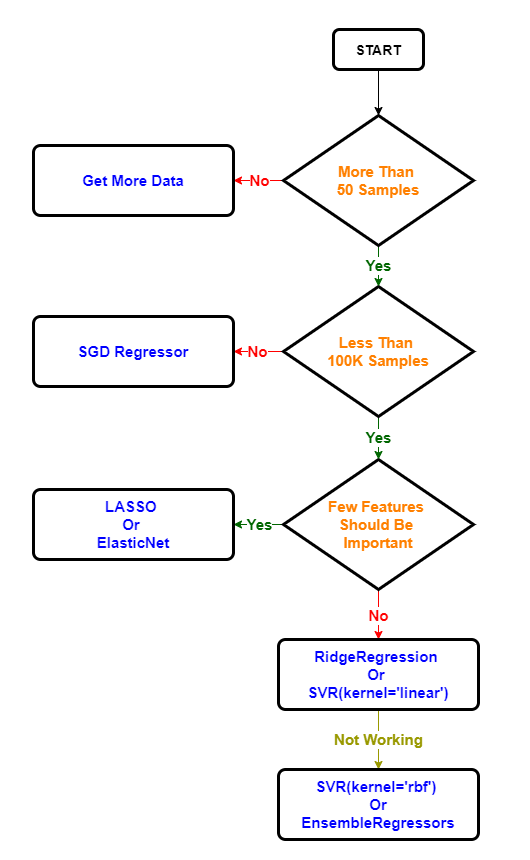

Antes de empezar con los algoritmos, creamos una tabla en la que vamos a ir incluyendo los resultados de las métricas de regresión para cada algoritmo. Así podremos al final comparar cuál de todos es el más óptimo.

In [ ]:
Tabla_results_dataset_reducido = PrettyTable()
Tabla_results_dataset_reducido.field_names = ['Model Name',
                  'R-squared train',
                  'R-squared test',
                  'MSE',
                  'RMSE',
                  'MAE',
                 ]

In [ ]:
Tabla_results_dataset_completo = PrettyTable()
Tabla_results_dataset_completo.field_names = ['Model Name',
                  'R-squared train',
                  'R-squared test',
                  'MSE',
                  'RMSE',
                  'MAE',
                 ]

###4.0. Mínimos cuadrados (OLS)

####Dataset reducido (BMW, Audi, Mercedes)

In [ ]:
df_marcas_similares_dependientes = df_marcas_similares.drop('Precio en €', axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_marcas_similares.values.copy()
data2 = df_marcas_similares_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 17]))    # nos quedamos con la 17º columna:precio. 
                                            # FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES 
                                            # DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (1213, 31)
Datos test:  (405, 31)


In [ ]:
modelo = LinearRegression()
modelo.fit(X_train_scaled, y_train)
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared: 0.8788970927882581


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8674267462018959


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.0016367459630485858
RMSE:  0.04045671715609889
MAE:  0.03183495255445976


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  6711145.158706923
RMSE:  2590.587801775289
MAE:  1966.000051012837


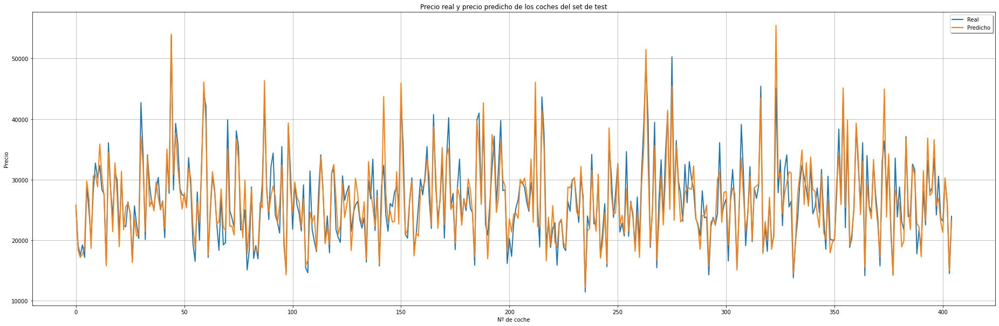

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_reducido.add_row([
    'Mínimos cuadrados (OLS)',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_reducido)

+-------------------------+--------------------+--------------------+-------------------+-------------------+-------------------+
|        Model Name       |  R-squared train   |   R-squared test   |        MSE        |        RMSE       |        MAE        |
+-------------------------+--------------------+--------------------+-------------------+-------------------+-------------------+
| Mínimos cuadrados (OLS) | 0.8788970927882581 | 0.8674267462018959 | 6711145.158706923 | 2590.587801775289 | 1966.000051012837 |
+-------------------------+--------------------+--------------------+-------------------+-------------------+-------------------+


####Dataset completo

In [ ]:
df_completo_dependientes = df_completo.drop(['Precio en €'], axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_completo.values.copy()
data2 = df_completo_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 18]))    # nos quedamos con la 18º columna:precio. 
                                            # FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES 
                                            # DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (4878, 35)
Datos test:  (1626, 35)


In [ ]:
modelo = LinearRegression()
modelo.fit(X_train_scaled, y_train)
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.901118428500083


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8969636308530846


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.0025649545605751526
RMSE:  0.050645380446543715
MAE:  0.03930863803652476


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  7472218.361789731
RMSE:  2733.535871685194
MAE:  1925.4270406085482


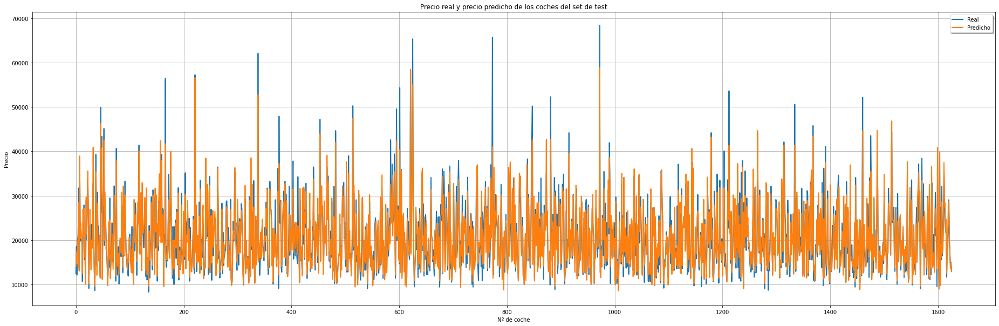

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_completo.add_row([
    'Mínimos cuadrados (OLS)',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_completo)

+-------------------------+-------------------+--------------------+-------------------+-------------------+--------------------+
|        Model Name       |  R-squared train  |   R-squared test   |        MSE        |        RMSE       |        MAE         |
+-------------------------+-------------------+--------------------+-------------------+-------------------+--------------------+
| Mínimos cuadrados (OLS) | 0.901118428500083 | 0.8969636308530846 | 7472218.361789731 | 2733.535871685194 | 1925.4270406085482 |
+-------------------------+-------------------+--------------------+-------------------+-------------------+--------------------+


###4.1. SGD REGRESSOR

Según la imagen anterior, el SGD Regressor funciona bien para más de 100K samples. Nosotros tenemos menos de una décima parte de eso, pero vamos a probar el algoritmo igualmente:

####Dataset reducido (BMW, Audi, Mercedes)

#####Con las variables según Lasso

Creamos un dataset con todas las variables (incluidas las one hot encoding que hasta ahora hemos dejado fuera de los análisis) para trabajar con él:

In [ ]:
df_marcas_similares_dependientes = df_marcas_similares.drop('Precio en €', axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_marcas_similares.values.copy()
data2 = df_marcas_similares_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 17]))    # nos quedamos con la 17º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (1213, 31)
Datos test:  (405, 31)


In [ ]:
modelo = SGDRegressor(max_iter=1000, tol=1e-3)
modelo.fit(X_train_scaled, y_train)
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared: 0.8715461072560216


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8627930526867442


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.0016939534233593875
RMSE:  0.04115766542649604
MAE:  0.032442181081251055


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  6734630.126482307
RMSE:  2595.116592078727
MAE:  1990.605848171161


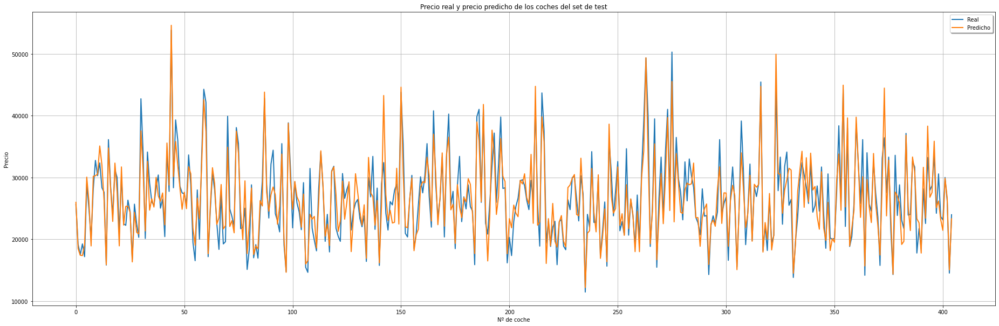

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_reducido.add_row([
    'SGD Regressor alpha óptimo',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_reducido)

+----------------------------+--------------------+--------------------+-------------------+-------------------+-------------------+
|         Model Name         |  R-squared train   |   R-squared test   |        MSE        |        RMSE       |        MAE        |
+----------------------------+--------------------+--------------------+-------------------+-------------------+-------------------+
|  Mínimos cuadrados (OLS)   | 0.8788970927882581 | 0.8674267462018959 | 6711145.158706923 | 2590.587801775289 | 1966.000051012837 |
| SGD Regressor alpha óptimo | 0.8715461072560216 | 0.8627930526867442 | 6734630.126482307 | 2595.116592078727 | 1990.605848171161 |
+----------------------------+--------------------+--------------------+-------------------+-------------------+-------------------+


NOTA: Eliminando las variables con one-hot encoding obtenemos resultados un poco peores, al contrario de lo que sucede con el dataset completo (como veremos ahora).

#####Con las variables según incremento de alpha en Lasso

Creamos un dataset con todas las variables menos *'Mes', 'Cilindrada del motor en L', 'Asientos' y 'Dueños anteriores'*, (incluidas las one hot encoding que hasta ahora hemos dejado fuera de los análisis) para trabajar con él:

In [ ]:
df_marcas_similares_dependientes_LASSO = df_marcas_similares.drop(['Precio en €', 'Mes','Cilindrada del motor en L','Asientos','Dueños anteriores'], axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_marcas_similares.values.copy()
data2 = df_marcas_similares_dependientes_LASSO.values.copy()

y = np.log10(pd.to_numeric(data[:, 17]))    # nos quedamos con la 17º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (1213, 27)
Datos test:  (405, 27)


In [ ]:
modelo = SGDRegressor(max_iter=1000, tol=1e-3)
modelo.fit(X_train_scaled, y_train)
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.8666769834965632


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8563929122596557


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.001772969391564664
RMSE:  0.04210664308116552
MAE:  0.03322927971783046


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  7068589.799875575
RMSE:  2658.68196666611
MAE:  2044.1711558523714


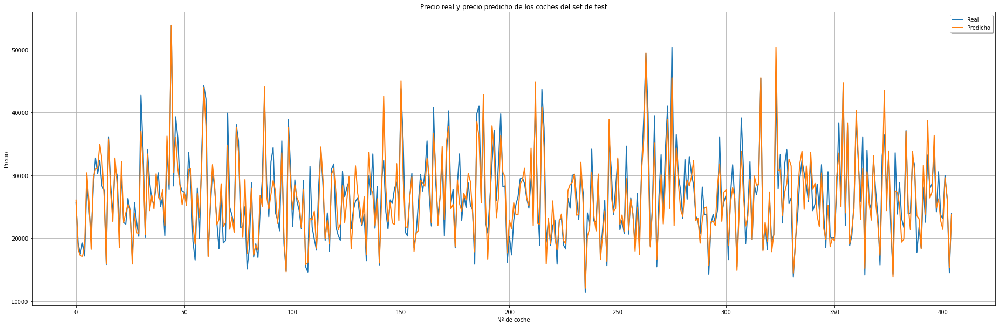

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_reducido.add_row([
    'SGD Regressor alpha incrementado',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_reducido)

+----------------------------------+--------------------+--------------------+-------------------+-------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE        |        RMSE       |        MAE         |
+----------------------------------+--------------------+--------------------+-------------------+-------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.8788970927882581 | 0.8674267462018959 | 6711145.158706923 | 2590.587801775289 | 1966.000051012837  |
|    SGD Regressor alpha óptimo    | 0.8715461072560216 | 0.8627930526867442 | 6734630.126482307 | 2595.116592078727 | 1990.605848171161  |
| SGD Regressor alpha incrementado | 0.8666769834965632 | 0.8563929122596557 | 7068589.799875575 |  2658.68196666611 | 2044.1711558523714 |
+----------------------------------+--------------------+--------------------+-------------------+-------------------+--------------------+


NOTA: Eliminando las variables con one-hot encoding obtenemos resultados un poco peores, al contrario de lo que sucede con el dataset completo (como veremos ahora).

####Dataset completo

#####Con las variables según Lasso

Creamos un dataset con todas las variables (incluidas las one hot encoding que hasta ahora hemos dejado fuera de los análisis) para trabajar con él:

In [ ]:
df_completo_dependientes = df_completo.drop(['Precio en €'], axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_completo.values.copy()
data2 = df_completo_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 18]))    # nos quedamos con la 18º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (4878, 35)
Datos test:  (1626, 35)


In [ ]:
modelo = SGDRegressor(max_iter=1000, tol=1e-3,loss="squared_error")
modelo.fit(X_train_scaled, y_train)
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: -1002367.7149989256


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))

MSE:  71753.8827461205
RMSE:  267.86915228544046


Obtenemos un valor de R2 negativo y un MSE altísimo, lo que nos viene a decir que hay algo que es erróneo en nuestro procedimiento. De acuerdo con https://scikit-learn.org/stable/modules/generated/sklearn.metrics.r2_score.html, el valor de R2 puede ser negativo.

De hecho, no hay ninguna razón por la que R2 no deba ser negativo (a pesar de ^2 en su nombre). Podemos ver R2 como la comparación del ajuste del modelo: en el contexto de la regresión lineal, por ejemplo, un modelo de orden 1 (afín) con un modelo de orden 0 (simplemente ajustando una constante), ambos minimizando una pérdida al cuadrado . La constante que minimiza el error cuadrático es la media, y puede suceder que la media del conjunto de prueba sea muy diferente de la media del conjunto de entrenamiento. Esto solo puede inducir un error cuadrático mucho mayor en su predicción en comparación con solo predecir la media de los datos de prueba, lo que da como resultado una puntuación de R2 negativa. En el peor de los casos, si los datos no explican su objetivo en absoluto, estos puntajes pueden volverse muy negativos (como estamos viendo en nuestros datos).

Por tanto, la pregunta importante ahora es si esto se debe al hecho de que los modelos lineales simplemente no encuentran nada en estos datos, o si se debe a algo más que puede corregir en el preprocesamiento de los datos.


Vamos a probar eliminando las variables sobre las que hemos hecho one hot encoding, ya que son las mismas sobre las que no hemos podido hacer un análisis exploratorio (debido a su naturaleza) y que nos están incluyendo una gran variedad de columnas. Si obtenemos unos resultados mejores, entonces significa que el fallo se encontraba en incluir dichas columnas, mientras que si no es así, esto puede deberse a que estos datos no puedan ser ajustados por modelos lineales (o al menos por el SGD en concreto).

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_completo.values.copy()
data2 = df_completo_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 18]))    # nos quedamos con la 18º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:18]                            # nos quedamos con todas variables numéricas sin las que tienen one hot encoding

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (4878, 15)
Datos test:  (1626, 15)


In [ ]:
modelo = SGDRegressor(max_iter=1000, tol=1e-3,loss="squared_error")
modelo.fit(X_train_scaled, y_train)
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.8818358921714493


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8842359884378429


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.002881792437614432
RMSE:  0.0536823289138468
MAE:  0.04128958670725481


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  8373034.506997095
RMSE:  2893.61962030207
MAE:  2029.7317834795394


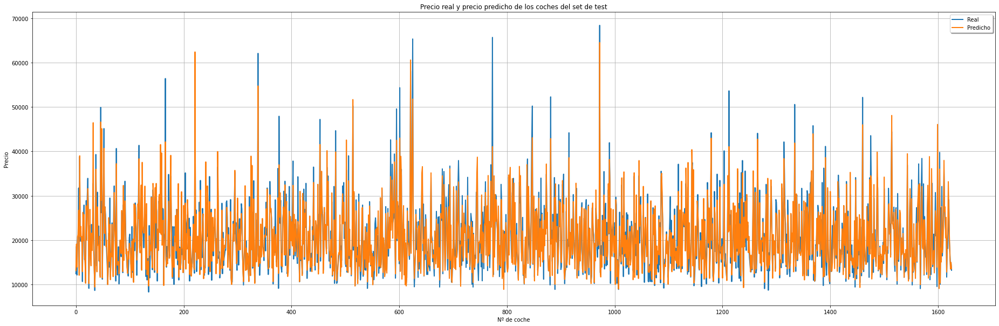

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

Los resultados hablan por sí solos. Quitando las variables con one-hot encoding obtenemos un valor de R2 de 0'88 y comprobamos como los valores predichos se ajustan bastante bien a los reales, incluso mejor que en el dataset reducido.

In [ ]:
Tabla_results_dataset_completo.add_row([
    'SGD Regressor alpha óptimo',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_completo)

+----------------------------+--------------------+--------------------+-------------------+-------------------+--------------------+
|         Model Name         |  R-squared train   |   R-squared test   |        MSE        |        RMSE       |        MAE         |
+----------------------------+--------------------+--------------------+-------------------+-------------------+--------------------+
|  Mínimos cuadrados (OLS)   | 0.901118428500083  | 0.8969636308530846 | 7472218.361789731 | 2733.535871685194 | 1925.4270406085482 |
| SGD Regressor alpha óptimo | 0.8818358921714493 | 0.8842359884378429 | 8373034.506997095 |  2893.61962030207 | 2029.7317834795394 |
+----------------------------+--------------------+--------------------+-------------------+-------------------+--------------------+


#####Con las variables según incremento de alpha en Lasso

Además de quitar las variables *Asientos y Consumo*, quitamos las one-hot encoding también ya que sabemos que son las que perjudican el modelo:

In [ ]:
df_completo_dependientes_LASSO = df_completo.drop(['Precio en €','Asientos','Consumo en L/100Km'], axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_completo.values.copy()
data2 = df_completo_dependientes_LASSO.values.copy()

y = np.log10(pd.to_numeric(data[:, 18]))    # nos quedamos con la 18º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:16]                            # nos quedamos con todas variables numéricas menos las one-hot encoding

feature_names = df_completo_dependientes_LASSO.columns[:]  

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (4878, 13)
Datos test:  (1626, 13)


In [ ]:
modelo = SGDRegressor(max_iter=1000, tol=1e-3)
modelo.fit(X_train_scaled, y_train)
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.8811407279414745


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8849081314982807


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.0028650603223186084
RMSE:  0.053526258250681115
MAE:  0.041242312990432003


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  8242338.043768177
RMSE:  2870.9472380676343
MAE:  2025.6531049792115


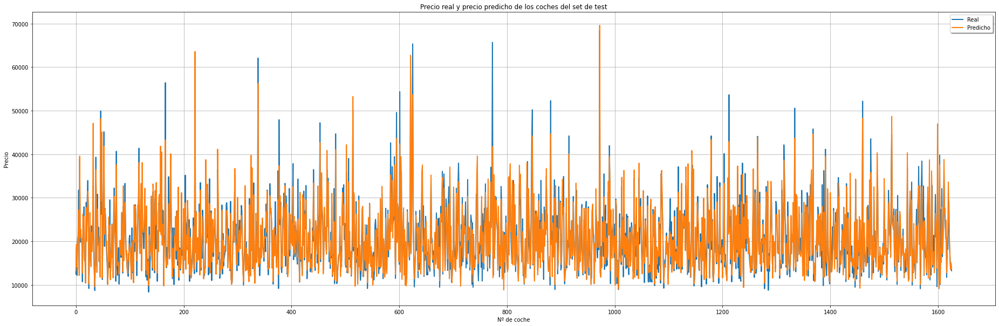

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_completo.add_row([
    'SGD Regressor alpha incrementado',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_completo)

+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE        |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.901118428500083  | 0.8969636308530846 | 7472218.361789731 | 2733.535871685194  | 1925.4270406085482 |
|    SGD Regressor alpha óptimo    | 0.8818358921714493 | 0.8842359884378429 | 8373034.506997095 |  2893.61962030207  | 2029.7317834795394 |
| SGD Regressor alpha incrementado | 0.8811407279414745 | 0.8849081314982807 | 8242338.043768177 | 2870.9472380676343 | 2025.6531049792115 |
+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+


###4.2. LASSO REGRESSOR

https://www.cienciadedatos.net/documentos/py14-ridge-lasso-elastic-net-python.html

Recordemos que a la hora de hacer un filtrado de características mediante métodos embedded ya hemos usado LASSO. De hecho, ya tenemos el alpha óptimo para cada dataset (así como el alpha que hemos usado para reducir el número de variables a costa de aumentar el error). Por tanto, procedemos a hacer uso de esos valores de alpha para la regresión LASSO.

####Dataset reducido (BMW, Audi, Mercedes)

#####Con el alpha óptimo

In [ ]:
alpha_optimo_dataset_reducido

3.039195382313195e-05

In [ ]:
df_marcas_similares_dependientes = df_marcas_similares.drop('Precio en €', axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_marcas_similares.values.copy()
data2 = df_marcas_similares_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 17]))    # nos quedamos con la 17º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (1213, 31)
Datos test:  (405, 31)


In [ ]:
modelo = Lasso(alpha=alpha_optimo_dataset_reducido)
modelo.fit(X_train_scaled, y_train)
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared: 0.8788901475088389


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8674794574869504


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.0016360951908864154
RMSE:  0.040448673536797417
MAE:  0.03182283893342266


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  6699912.405607937
RMSE:  2588.4189007206573
MAE:  1964.7670907588106


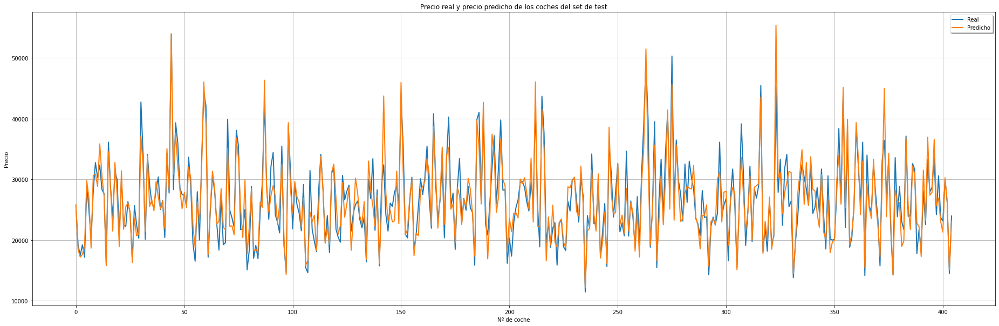

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_reducido.add_row([
    'LASSO alpha óptimo',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_reducido)

+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE        |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.8788970927882581 | 0.8674267462018959 | 6711145.158706923 | 2590.587801775289  | 1966.000051012837  |
|    SGD Regressor alpha óptimo    | 0.8715461072560216 | 0.8627930526867442 | 6734630.126482307 | 2595.116592078727  | 1990.605848171161  |
| SGD Regressor alpha incrementado | 0.8666769834965632 | 0.8563929122596557 | 7068589.799875575 |  2658.68196666611  | 2044.1711558523714 |
|        LASSO alpha óptimo        | 0.8788901475088389 | 0.8674794574869504 | 6699912.405607937 | 2588.4189007206573 | 1964.7670907588106 |
+------------

Probamos a ver que ocurre si eliminamos las variables con one-hot encoding:

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_marcas_similares.values.copy()
data2 = df_marcas_similares_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 17]))    # nos quedamos con la 17º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:17]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (1213, 14)
Datos test:  (405, 14)


In [ ]:
modelo = Lasso(alpha=alpha_optimo_dataset_reducido)
modelo.fit(X_train_scaled, y_train)
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.8589072145015837


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8421111526144941


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  8130594.8733452335
RMSE:  2851.4197995639356
MAE:  2083.0841322964275


Los resultados son algo peores.

#####Con el alpha incrementado

In [ ]:
alpha_incrementado_dataset_reducido

0.009

In [ ]:
df_marcas_similares_dependientes = df_marcas_similares.drop('Precio en €', axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_marcas_similares.values.copy()
data2 = df_marcas_similares_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 17]))    # nos quedamos con la 17º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (1213, 31)
Datos test:  (405, 31)


In [ ]:
modelo = Lasso(alpha=alpha_incrementado_dataset_reducido)
modelo.fit(X_train_scaled, y_train)
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.8087541148430063


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8087504427029221


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.002361162088678387
RMSE:  0.04859179034238589
MAE:  0.03949621573123587


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  9721458.251853831
RMSE:  3117.925312103199
MAE:  2427.1238129620006


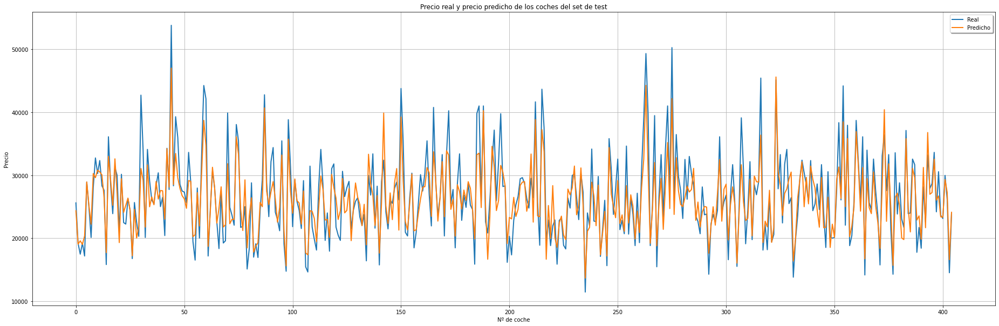

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_reducido.add_row([
    'LASSO alpha incrementado',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_reducido)

+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE        |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.8788970927882581 | 0.8674267462018959 | 6711145.158706923 | 2590.587801775289  | 1966.000051012837  |
|    SGD Regressor alpha óptimo    | 0.8715461072560216 | 0.8627930526867442 | 6734630.126482307 | 2595.116592078727  | 1990.605848171161  |
| SGD Regressor alpha incrementado | 0.8666769834965632 | 0.8563929122596557 | 7068589.799875575 |  2658.68196666611  | 2044.1711558523714 |
|        LASSO alpha óptimo        | 0.8788901475088389 | 0.8674794574869504 | 6699912.405607937 | 2588.4189007206573 | 1964.7670907588106 |
|     LASSO a

####Dataset completo

#####Con el alpha óptimo

In [ ]:
alpha_optimo_dataset_completo

0.00010826367338740541

In [ ]:
df_completo_dependientes = df_completo.drop(['Precio en €'], axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_completo.values.copy()
data2 = df_completo_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 18]))    # nos quedamos con la 18º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (4878, 35)
Datos test:  (1626, 35)


In [ ]:
modelo = Lasso(alpha=alpha_optimo_dataset_completo)
modelo.fit(X_train_scaled, y_train)
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.901100118389432


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8968994646756133


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.0025665518929627595
RMSE:  0.05066114776594347
MAE:  0.039302064993284


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  7467148.796840813
RMSE:  2732.608423620335
MAE:  1924.2575400119506


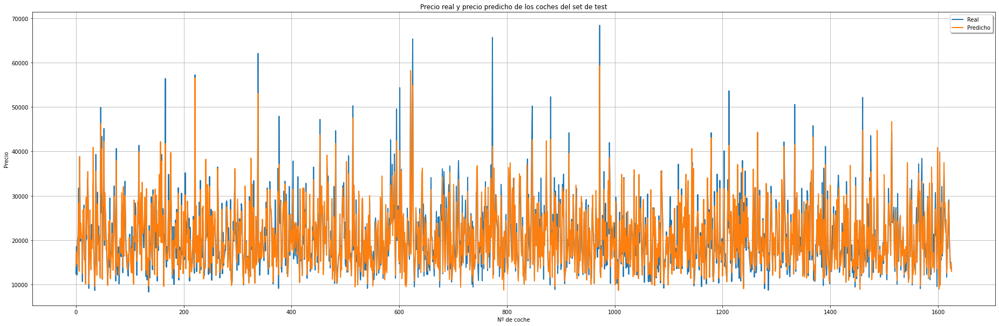

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_completo.add_row([
    'LASSO alpha óptimo',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_completo)

+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE        |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.901118428500083  | 0.8969636308530846 | 7472218.361789731 | 2733.535871685194  | 1925.4270406085482 |
|    SGD Regressor alpha óptimo    | 0.8818358921714493 | 0.8842359884378429 | 8373034.506997095 |  2893.61962030207  | 2029.7317834795394 |
| SGD Regressor alpha incrementado | 0.8811407279414745 | 0.8849081314982807 | 8242338.043768177 | 2870.9472380676343 | 2025.6531049792115 |
|        LASSO alpha óptimo        | 0.901100118389432  | 0.8968994646756133 | 7467148.796840813 | 2732.608423620335  | 1924.2575400119506 |
+------------

Probemos ahora que sucede si eliminamos las variables con one-hot encoding:

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_completo.values.copy()
data2 = df_completo_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 18]))    # nos quedamos con la 18º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:18]                            # nos quedamos con todas variables numéricas sin las que tienen one hot encoding

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (4878, 15)
Datos test:  (1626, 15)


In [ ]:
modelo = Lasso(alpha=alpha_optimo_dataset_completo)
modelo.fit(X_train_scaled, y_train)
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.8819542690933774


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.884266062830841


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  8323751.536698001
RMSE:  2885.0912527505957
MAE:  2027.6012487224023


Los resultados son algo peores.

#####Con el alpha incrementado

In [ ]:
alpha_incrementado_dataset_completo

0.0008

In [ ]:
df_completo_dependientes = df_completo.drop(['Precio en €'], axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_completo.values.copy()
data2 = df_completo_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 18]))    # nos quedamos con la 18º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (4878, 35)
Datos test:  (1626, 35)


In [ ]:
modelo = Lasso(alpha=alpha_incrementado_dataset_completo)
modelo.fit(X_train_scaled, y_train)
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.8997072176638506


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.895815143166714


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.0025935446472922087
RMSE:  0.05092685585515965
MAE:  0.039404879862988317


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  7464866.72924864
RMSE:  2732.190829581389
MAE:  1926.9545547522632


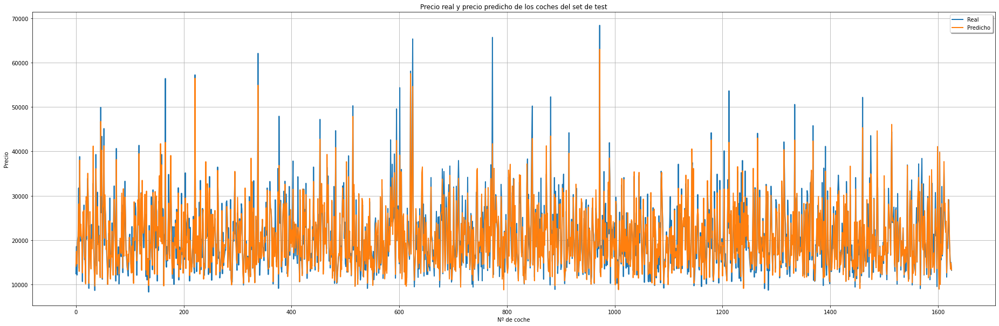

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_completo.add_row([
    'LASSO alpha incrementado',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_completo)

+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE        |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.901118428500083  | 0.8969636308530846 | 7472218.361789731 | 2733.535871685194  | 1925.4270406085482 |
|    SGD Regressor alpha óptimo    | 0.8818358921714493 | 0.8842359884378429 | 8373034.506997095 |  2893.61962030207  | 2029.7317834795394 |
| SGD Regressor alpha incrementado | 0.8811407279414745 | 0.8849081314982807 | 8242338.043768177 | 2870.9472380676343 | 2025.6531049792115 |
|        LASSO alpha óptimo        | 0.901100118389432  | 0.8968994646756133 | 7467148.796840813 | 2732.608423620335  | 1924.2575400119506 |
|     LASSO a

###4.3. ElasticNet REGRESSOR

####Dataset reducido (BMW, Audi, Mercedes)

#####ElasticNet CV (Cross validation) para hallar el alpha óptimo

In [ ]:
df_marcas_similares_dependientes = df_marcas_similares.drop('Precio en €', axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_marcas_similares.values.copy()
data2 = df_marcas_similares_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 17]))    # nos quedamos con la 17º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (1213, 31)
Datos test:  (405, 31)


In [ ]:
# Creación y entrenamiento del modelo (con búsqueda por CV del valor óptimo alpha)
modelo = ElasticNetCV(
            l1_ratio        = [0, 0.1, 0.5, 0.7, 0.9, 0.95, 0.99],
            alphas          = np.logspace(-10, 3, 200),
         )
_ = modelo.fit(X = X_train_scaled, y = y_train)

In [ ]:
# Mejor valor alpha y l1_ratio_ encontrado
# ==============================================================================
print(f"Mejor valor de alpha encontrado: {modelo.alpha_}")
print(f"Mejor valor de l1_ratio encontrado: {modelo.l1_ratio_}")

Mejor valor de alpha encontrado: 0.00021711179456945052
Mejor valor de l1_ratio encontrado: 0.99


In [ ]:
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.8785898645136849


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.86753750565096


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.0016353785297546783
RMSE:  0.04043981367111721
MAE:  0.03181614697384047


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  6656870.125898825
RMSE:  2580.091108061656
MAE:  1961.7303289281829


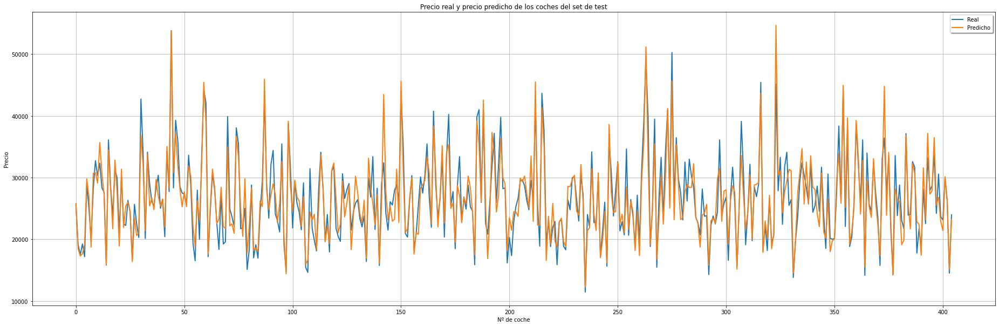

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_reducido.add_row([
    'ElasticNet CV',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_reducido)

+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE        |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.8788970927882581 | 0.8674267462018959 | 6711145.158706923 | 2590.587801775289  | 1966.000051012837  |
|    SGD Regressor alpha óptimo    | 0.8715461072560216 | 0.8627930526867442 | 6734630.126482307 | 2595.116592078727  | 1990.605848171161  |
| SGD Regressor alpha incrementado | 0.8666769834965632 | 0.8563929122596557 | 7068589.799875575 |  2658.68196666611  | 2044.1711558523714 |
|        LASSO alpha óptimo        | 0.8788901475088389 | 0.8674794574869504 | 6699912.405607937 | 2588.4189007206573 | 1964.7670907588106 |
|     LASSO a

#####ElasticNet con el alpha óptimo obtenido previamente con Lasso

In [ ]:
df_marcas_similares_dependientes = df_marcas_similares.drop('Precio en €', axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_marcas_similares.values.copy()
data2 = df_marcas_similares_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 17]))    # nos quedamos con la 17º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (1213, 31)
Datos test:  (405, 31)


In [ ]:
modelo = ElasticNet(alpha=alpha_optimo_dataset_reducido)
modelo.fit(X_train_scaled, y_train)
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

ElasticNet(alpha=3.039195382313195e-05)

In [ ]:
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.878895542093514


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8674555732676907


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.0016363900648397503
RMSE:  0.040452318411183186
MAE:  0.031828722847255894


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  6705210.5449095005
RMSE:  2589.4421300561053
MAE:  1965.3658246770667


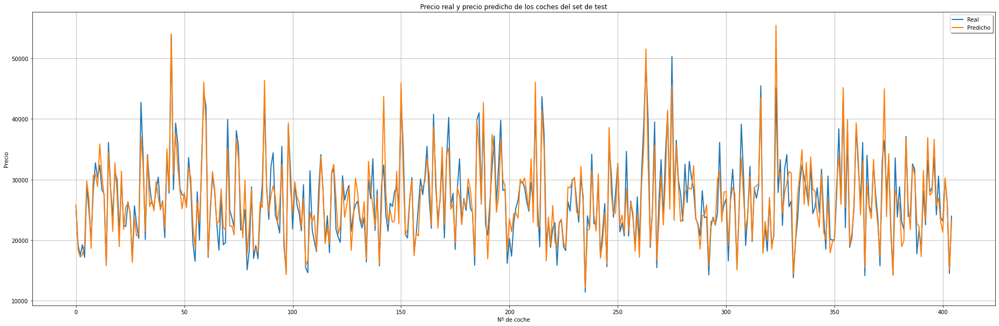

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_reducido.add_row([
    'ElasticNet alpha óptimo',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_reducido)

+----------------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE         |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.8788970927882581 | 0.8674267462018959 | 6711145.158706923  | 2590.587801775289  | 1966.000051012837  |
|    SGD Regressor alpha óptimo    | 0.8715461072560216 | 0.8627930526867442 | 6734630.126482307  | 2595.116592078727  | 1990.605848171161  |
| SGD Regressor alpha incrementado | 0.8666769834965632 | 0.8563929122596557 | 7068589.799875575  |  2658.68196666611  | 2044.1711558523714 |
|        LASSO alpha óptimo        | 0.8788901475088389 | 0.8674794574869504 | 6699912.405607937  | 2588.4189007206573 | 1964.7670907588106 |
|     

####Dataset completo

#####ElasticNet CV (Cross validation) para hallar el alpha óptimo

In [ ]:
df_completo_dependientes = df_completo.drop(['Precio en €'], axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_completo.values.copy()
data2 = df_completo_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 18]))    # nos quedamos con la 18º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (4878, 35)
Datos test:  (1626, 35)


In [ ]:
# Creación y entrenamiento del modelo (con búsqueda por CV del valor óptimo alpha)
modelo = ElasticNetCV(
            l1_ratio        = [0, 0.1, 0.5, 0.7, 0.9, 0.95, 0.99],
            alphas          = np.logspace(-10, 3, 200),
            cv              = 10
         )
_ = modelo.fit(X = X_train_scaled, y = y_train)

In [ ]:
# Mejor valor alpha y l1_ratio_ encontrado
# ==============================================================================
print(f"Mejor valor de alpha encontrado: {modelo.alpha_}")
print(f"Mejor valor de l1_ratio encontrado: {modelo.l1_ratio_}")

Mejor valor de alpha encontrado: 0.00011895340673703207
Mejor valor de l1_ratio encontrado: 0.9


In [ ]:
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.9011008371697966


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8969004628227591


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.002566527045405581
RMSE:  0.05066090253248141
MAE:  0.03930207192375648


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  7467240.862244945
RMSE:  2732.625269268537
MAE:  1924.2650359647089


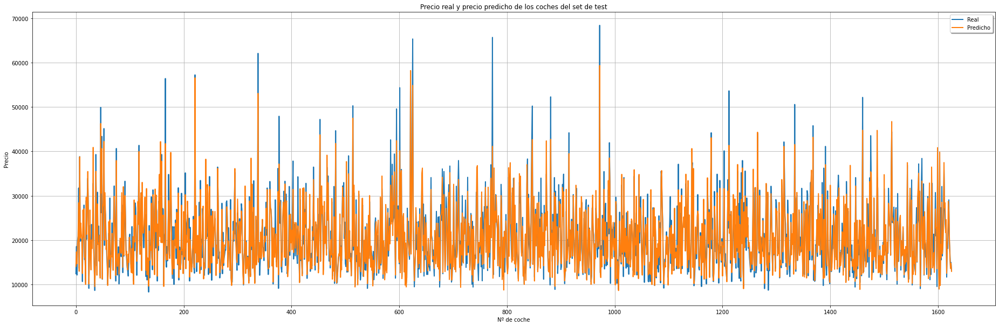

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_completo.add_row([
    'ElasticNet CV',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_completo)

+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE        |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.901118428500083  | 0.8969636308530846 | 7472218.361789731 | 2733.535871685194  | 1925.4270406085482 |
|    SGD Regressor alpha óptimo    | 0.8818358921714493 | 0.8842359884378429 | 8373034.506997095 |  2893.61962030207  | 2029.7317834795394 |
| SGD Regressor alpha incrementado | 0.8811407279414745 | 0.8849081314982807 | 8242338.043768177 | 2870.9472380676343 | 2025.6531049792115 |
|        LASSO alpha óptimo        | 0.901100118389432  | 0.8968994646756133 | 7467148.796840813 | 2732.608423620335  | 1924.2575400119506 |
|     LASSO a

#####ElasticNet con el alpha óptimo obtenido previamente con Lasso

In [ ]:
df_completo_dependientes = df_completo.drop(['Precio en €'], axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_completo.values.copy()
data2 = df_completo_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 18]))    # nos quedamos con la 18º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (4878, 35)
Datos test:  (1626, 35)


In [ ]:
modelo = ElasticNet(alpha=alpha_optimo_dataset_completo)
modelo.fit(X_train_scaled, y_train)

ElasticNet(alpha=0.00010826367338740541)

In [ ]:
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.9011280522986361


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8969269814790697


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.002565866898420519
RMSE:  0.05065438676383832
MAE:  0.03930230064305589


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  7473506.733879697
RMSE:  2733.771521886878
MAE:  1924.5894677792016


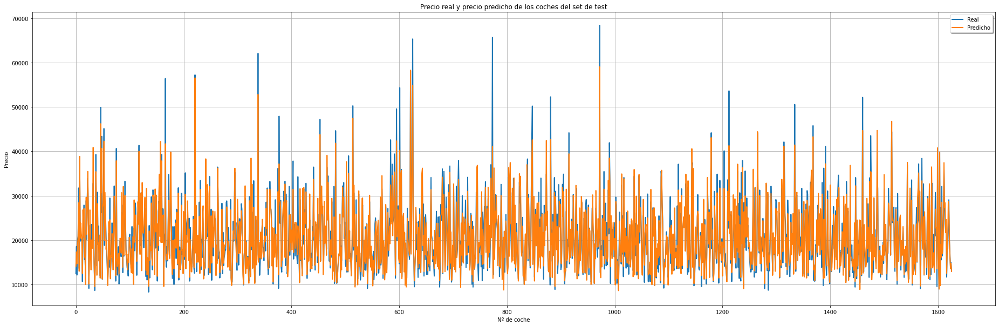

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_completo.add_row([
    'ElasticNet alpha óptimo',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_completo)

+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE        |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.901118428500083  | 0.8969636308530846 | 7472218.361789731 | 2733.535871685194  | 1925.4270406085482 |
|    SGD Regressor alpha óptimo    | 0.8818358921714493 | 0.8842359884378429 | 8373034.506997095 |  2893.61962030207  | 2029.7317834795394 |
| SGD Regressor alpha incrementado | 0.8811407279414745 | 0.8849081314982807 | 8242338.043768177 | 2870.9472380676343 | 2025.6531049792115 |
|        LASSO alpha óptimo        | 0.901100118389432  | 0.8968994646756133 | 7467148.796840813 | 2732.608423620335  | 1924.2575400119506 |
|     LASSO a

###4.4. RIDGE REGRESSOR

####Dataset reducido (BMW, Audi, Mercedes)

#####RidgeCV (Cross validation) para hallar el alpha óptimo

In [ ]:
df_marcas_similares_dependientes = df_marcas_similares.drop('Precio en €', axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_marcas_similares.values.copy()
data2 = df_marcas_similares_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 17]))    # nos quedamos con la 17º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (1213, 31)
Datos test:  (405, 31)


In [ ]:
# Creación y entrenamiento del modelo (con búsqueda por CV del valor óptimo alpha)
modelo = RidgeCV(
            alphas          = np.logspace(-10, 3, 200),
            fit_intercept   = True,
            store_cv_values = True
         )

_ = modelo.fit(X = X_train_scaled, y = y_train)

score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

In [ ]:
# Mejor valor alpha encontrado
# ==============================================================================
print(f"Mejor valor de alpha encontrado: {modelo.alpha_}")

Mejor valor de alpha encontrado: 3.2929712550971617


In [ ]:
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.8788645036106089


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8675942983658983


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.0016346773683647087
RMSE:  0.04043114354510281
MAE:  0.03180496643821092


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  6678180.913534949
RMSE:  2584.2176598605133
MAE:  1962.472984632173


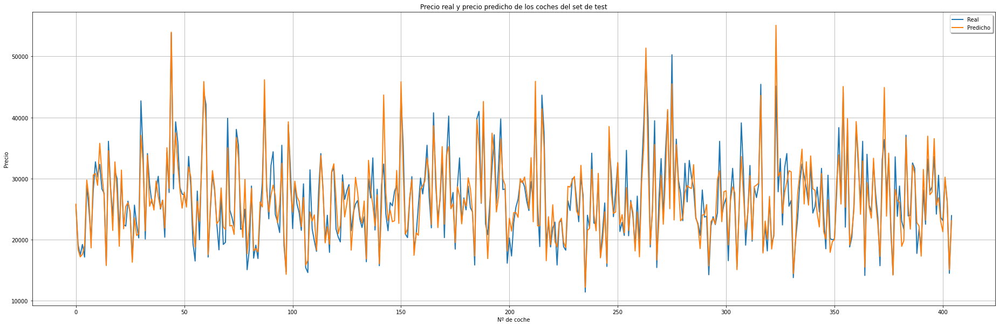

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_reducido.add_row([
    'RidgeCV',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_reducido)

+----------------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE         |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.8788970927882581 | 0.8674267462018959 | 6711145.158706923  | 2590.587801775289  | 1966.000051012837  |
|    SGD Regressor alpha óptimo    | 0.8715461072560216 | 0.8627930526867442 | 6734630.126482307  | 2595.116592078727  | 1990.605848171161  |
| SGD Regressor alpha incrementado | 0.8666769834965632 | 0.8563929122596557 | 7068589.799875575  |  2658.68196666611  | 2044.1711558523714 |
|        LASSO alpha óptimo        | 0.8788901475088389 | 0.8674794574869504 | 6699912.405607937  | 2588.4189007206573 | 1964.7670907588106 |
|     

#####Ridge con el alpha óptimo obtenido previamente con Lasso

In [ ]:
df_marcas_similares_dependientes = df_marcas_similares.drop('Precio en €', axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_marcas_similares.values.copy()
data2 = df_marcas_similares_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 17]))    # nos quedamos con la 17º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (1213, 31)
Datos test:  (405, 31)


In [ ]:
modelo = Ridge(alpha=alpha_optimo_dataset_reducido)
modelo.fit(X_train_scaled, y_train)
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

Ridge(alpha=3.039195382313195e-05)

In [ ]:
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.87889744635862


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.867425399697496


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.001636762586957086
RMSE:  0.04045692260858562
MAE:  0.031835019919092655


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  6711150.949149824
RMSE:  2590.5889193675293
MAE:  1966.0058547840995


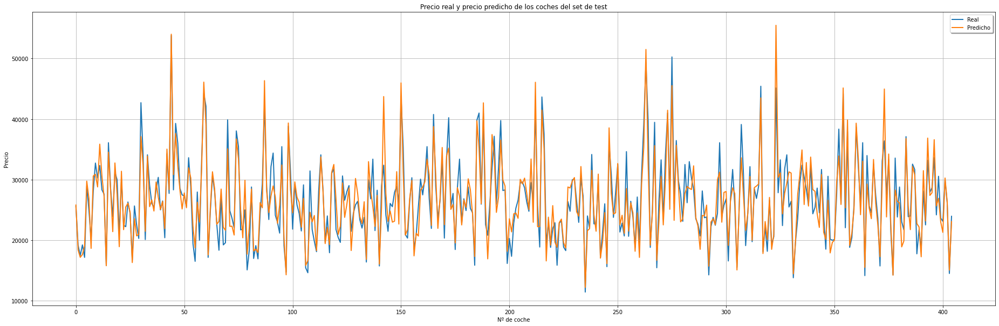

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_reducido.add_row([
    'Ridge alpa óptimo',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_reducido)

+----------------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE         |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.8788970927882581 | 0.8674267462018959 | 6711145.158706923  | 2590.587801775289  | 1966.000051012837  |
|    SGD Regressor alpha óptimo    | 0.8715461072560216 | 0.8627930526867442 | 6734630.126482307  | 2595.116592078727  | 1990.605848171161  |
| SGD Regressor alpha incrementado | 0.8666769834965632 | 0.8563929122596557 | 7068589.799875575  |  2658.68196666611  | 2044.1711558523714 |
|        LASSO alpha óptimo        | 0.8788901475088389 | 0.8674794574869504 | 6699912.405607937  | 2588.4189007206573 | 1964.7670907588106 |
|     

####Dataset completo

#####RidgeCV (Cross validation) para hallar el alpha óptimo

In [ ]:
df_completo_dependientes = df_completo.drop(['Precio en €'], axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_completo.values.copy()
data2 = df_completo_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 18]))    # nos quedamos con la 18º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (4878, 35)
Datos test:  (1626, 35)


In [ ]:
# Creación y entrenamiento del modelo (con búsqueda por CV del valor óptimo alpha)
modelo = RidgeCV(
            alphas          = np.logspace(-10, 3, 200),
            fit_intercept   = True,
            store_cv_values = True
         )

_ = modelo.fit(X = X_train_scaled, y = y_train)

In [ ]:
# Mejor valor alpha encontrado
# ==============================================================================
print(f"Mejor valor de alpha encontrado: {modelo.alpha_}")

Mejor valor de alpha encontrado: 1.8251834943190463e-10


In [ ]:
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.874983612424422


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8745068462829927


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.0031239866040740916
RMSE:  0.055892634613820914
MAE:  0.044474739017284125


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  9147800.806771418
RMSE:  3024.533155178071
MAE:  2180.812746991039


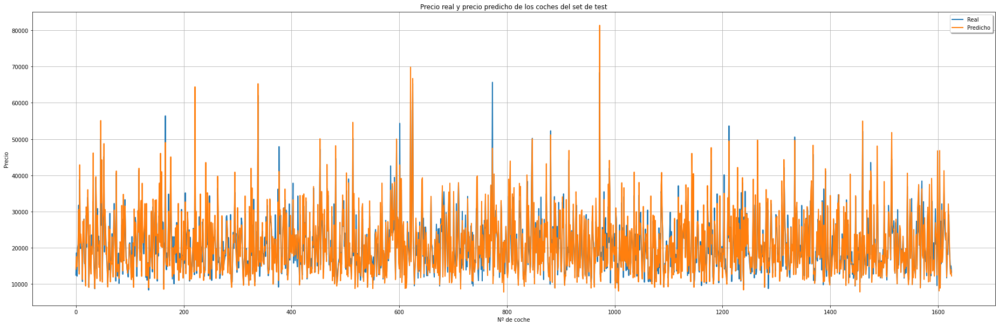

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_completo.add_row([
    'RidgeCV',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_completo)

+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE        |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.901118428500083  | 0.8969636308530846 | 7472218.361789731 | 2733.535871685194  | 1925.4270406085482 |
|    SGD Regressor alpha óptimo    | 0.8818358921714493 | 0.8842359884378429 | 8373034.506997095 |  2893.61962030207  | 2029.7317834795394 |
| SGD Regressor alpha incrementado | 0.8811407279414745 | 0.8849081314982807 | 8242338.043768177 | 2870.9472380676343 | 2025.6531049792115 |
|        LASSO alpha óptimo        | 0.901100118389432  | 0.8968994646756133 | 7467148.796840813 | 2732.608423620335  | 1924.2575400119506 |
|     LASSO a

#####Ridge con el alpha óptimo obtenido previamente con Lasso

In [ ]:
df_completo_dependientes = df_completo.drop(['Precio en €'], axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_completo.values.copy()
data2 = df_completo_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 18]))    # nos quedamos con la 18º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (4878, 35)
Datos test:  (1626, 35)


In [ ]:
modelo = Ridge(alpha=alpha_optimo_dataset_completo)
modelo.fit(X_train_scaled, y_train)

Ridge(alpha=0.00010826367338740541)

In [ ]:
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.9011379009321137


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8969308173684002


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.002565771409013103
RMSE:  0.050653444196945806
MAE:  0.039303583780905774


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  7481785.148384277
RMSE:  2735.2852042125837
MAE:  1924.949490069835


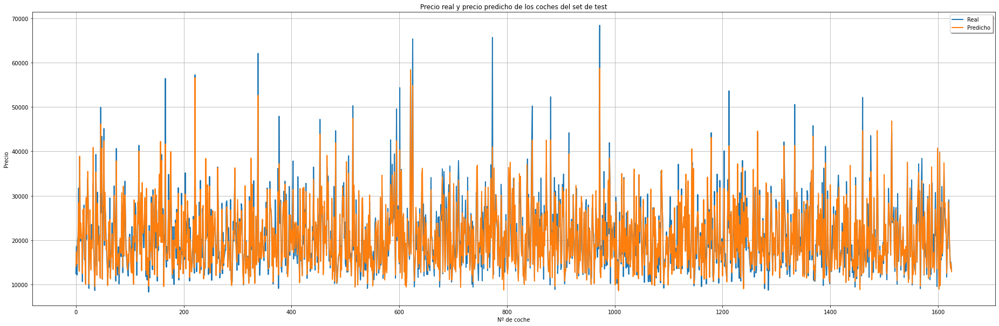

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_completo.add_row([
    'Ridge alpha óptimo',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_completo)

+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE        |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.901118428500083  | 0.8969636308530846 | 7472218.361789731 | 2733.535871685194  | 1925.4270406085482 |
|    SGD Regressor alpha óptimo    | 0.8818358921714493 | 0.8842359884378429 | 8373034.506997095 |  2893.61962030207  | 2029.7317834795394 |
| SGD Regressor alpha incrementado | 0.8811407279414745 | 0.8849081314982807 | 8242338.043768177 | 2870.9472380676343 | 2025.6531049792115 |
|        LASSO alpha óptimo        | 0.901100118389432  | 0.8968994646756133 | 7467148.796840813 | 2732.608423620335  | 1924.2575400119506 |
|     LASSO a

###4.5. SVR REGRESSOR

####Dataset reducido (BMW, Audi, Mercedes)

In [ ]:
df_marcas_similares_dependientes = df_marcas_similares.drop('Precio en €', axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_marcas_similares.values.copy()
data2 = df_marcas_similares_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 17]))    # nos quedamos con la 17º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (1213, 31)
Datos test:  (405, 31)


Vemos qué tipo de Kernel es el más adecuado mediante validación cruzada:


1.   https://www.kaggle.com/questions-and-answers/153964
2.   https://colab.research.google.com/drive/1vPFNyZRJOWfw8zbnrCf7T-cBOXmXXiK0#scrollTo=kbeMUmQfigzG



In [ ]:
param_grid = {
            'kernel': ("linear", "rbf", "poly", "sigmoid")}
grid_search = GridSearchCV(SVR(), param_grid = param_grid, 
                         cv = 5, n_jobs = -1, verbose = 2, scoring="neg_mean_squared_error")
grid_search.fit(X_train_scaled, y_train)
print(grid_search.best_params_)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
{'kernel': 'linear'}


In [ ]:
modelo = SVR(kernel = 'linear')
modelo.fit(X_train_scaled, y_train)
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

SVR(kernel='linear')

In [ ]:
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.8425139108281404


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8463127200268077


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.0018974191841977523
RMSE:  0.04355937538805799
MAE:  0.03524687923248489


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  7268886.938599109
RMSE:  2696.08733882994
MAE:  2142.6054883046377


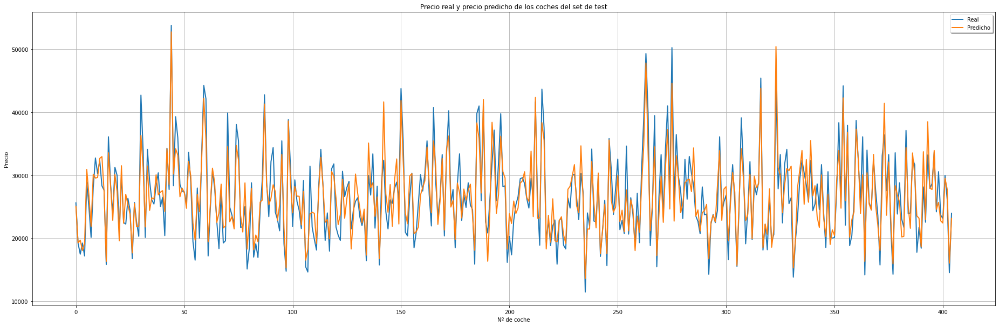

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_reducido.add_row([
    'SVR',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_reducido)

+----------------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE         |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.8788970927882581 | 0.8674267462018959 | 6711145.158706923  | 2590.587801775289  | 1966.000051012837  |
|    SGD Regressor alpha óptimo    | 0.8715461072560216 | 0.8627930526867442 | 6734630.126482307  | 2595.116592078727  | 1990.605848171161  |
| SGD Regressor alpha incrementado | 0.8666769834965632 | 0.8563929122596557 | 7068589.799875575  |  2658.68196666611  | 2044.1711558523714 |
|        LASSO alpha óptimo        | 0.8788901475088389 | 0.8674794574869504 | 6699912.405607937  | 2588.4189007206573 | 1964.7670907588106 |
|     

####Dataset completo

In [ ]:
df_completo_dependientes = df_completo.drop(['Precio en €'], axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_completo.values.copy()
data2 = df_completo_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 18]))    # nos quedamos con la 18º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (4878, 35)
Datos test:  (1626, 35)


Vemos qué tipo de Kernel es el más adecuado mediante validación cruzada:


1.   https://www.kaggle.com/questions-and-answers/153964
2.   https://colab.research.google.com/drive/1vPFNyZRJOWfw8zbnrCf7T-cBOXmXXiK0#scrollTo=kbeMUmQfigzG


In [ ]:
param_grid = {
            'kernel': ("linear", "rbf", "poly", "sigmoid")}
grid_search = GridSearchCV(SVR(), param_grid = param_grid, 
                         cv = 5, n_jobs = -1, verbose = 2, scoring="neg_mean_squared_error")
grid_search.fit(X_train_scaled, y_train)
print(grid_search.best_params_)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
{'kernel': 'linear'}


In [ ]:
modelo = SVR(kernel = 'linear')
modelo.fit(X_train_scaled, y_train)

SVR(kernel='linear')

In [ ]:
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.894932384442326


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8915079792647286


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.0027007658138085643
RMSE:  0.051968892751419714
MAE:  0.04090107074199852


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  7611235.299239817
RMSE:  2758.846733553681
MAE:  1988.3209871268555


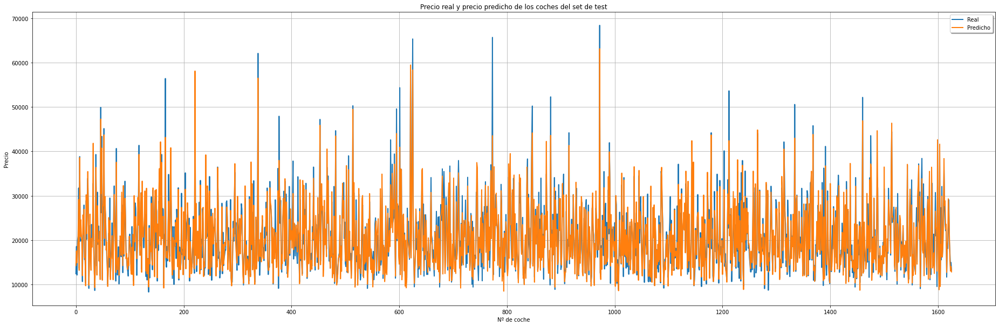

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_completo.add_row([
    'SVR',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_completo)

+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE        |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.901118428500083  | 0.8969636308530846 | 7472218.361789731 | 2733.535871685194  | 1925.4270406085482 |
|    SGD Regressor alpha óptimo    | 0.8818358921714493 | 0.8842359884378429 | 8373034.506997095 |  2893.61962030207  | 2029.7317834795394 |
| SGD Regressor alpha incrementado | 0.8811407279414745 | 0.8849081314982807 | 8242338.043768177 | 2870.9472380676343 | 2025.6531049792115 |
|        LASSO alpha óptimo        | 0.901100118389432  | 0.8968994646756133 | 7467148.796840813 | 2732.608423620335  | 1924.2575400119506 |
|     LASSO a

###4.6. Ensemble REGRESSOR (RandomForest/GradientBoosting)

####4.6.1. RandomForest

#####Dataset reducido (BMW, Audi, Mercedes)

In [ ]:
df_marcas_similares_dependientes = df_marcas_similares.drop('Precio en €', axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_marcas_similares.values.copy()
data2 = df_marcas_similares_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 17]))    # nos quedamos con la 17º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (1213, 31)
Datos test:  (405, 31)


In [ ]:
max_depth_arr = range(1, 20+1)
param_grid = {'n_estimators'  : [50, 100, 500],
              'max_features'  : ['auto', 'sqrt', 'log2'],
              'max_depth': max_depth_arr
             }

n_folds = 5

grid = GridSearchCV(estimator  = RandomForestRegressor(random_state=0),param_grid = 
                    param_grid,cv=n_folds, return_train_score=True)
grid.fit(X_train_scaled, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=0),
             param_grid={'max_depth': range(1, 21),
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [50, 100, 500]},
             return_train_score=True)

In [ ]:
print("best mean cross-validation score: {:.3f}".format(grid.best_score_))
print("best parameters: {}".format(grid.best_params_))

best mean cross-validation score: 0.869
best parameters: {'max_depth': 17, 'max_features': 'auto', 'n_estimators': 500}


In [ ]:
modelo = RandomForestRegressor(random_state=0, **grid.best_params_)
modelo.fit(X_train_scaled, y_train)
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

RandomForestRegressor(max_depth=17, n_estimators=500, random_state=0)

In [ ]:
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.9839473859605876


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8983618228811339


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.0012548223063474384
RMSE:  0.035423471122229655
MAE:  0.02650926174401565


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  4843788.769189355
RMSE:  2200.860915457711
MAE:  1616.4214311257017


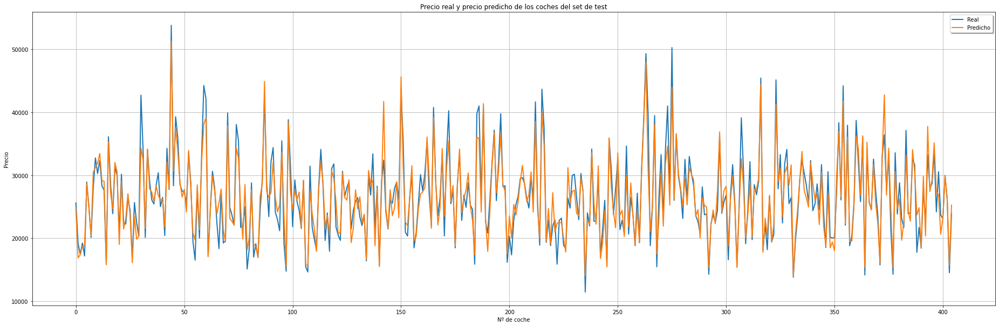

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_reducido.add_row([
    'Random Forest',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_reducido)

+----------------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE         |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.8788970927882581 | 0.8674267462018959 | 6711145.158706923  | 2590.587801775289  | 1966.000051012837  |
|    SGD Regressor alpha óptimo    | 0.8715461072560216 | 0.8627930526867442 | 6734630.126482307  | 2595.116592078727  | 1990.605848171161  |
| SGD Regressor alpha incrementado | 0.8666769834965632 | 0.8563929122596557 | 7068589.799875575  |  2658.68196666611  | 2044.1711558523714 |
|        LASSO alpha óptimo        | 0.8788901475088389 | 0.8674794574869504 | 6699912.405607937  | 2588.4189007206573 | 1964.7670907588106 |
|     

#####Dataset completo

In [ ]:
df_completo_dependientes = df_completo.drop(['Precio en €'], axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_completo.values.copy()
data2 = df_completo_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 18]))    # nos quedamos con la 18º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (4878, 35)
Datos test:  (1626, 35)


In [ ]:
max_depth_arr = range(1, 20+1)
param_grid = {'n_estimators'  : [50, 100, 500],
              'max_features'  : ['auto', 'sqrt', 'log2'],
              'max_depth': max_depth_arr
             }

n_folds = 5

grid = GridSearchCV(estimator  = RandomForestRegressor(random_state=0),param_grid = param_grid,cv=n_folds, return_train_score=True)
grid.fit(X_train_scaled, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=0),
             param_grid={'max_depth': range(1, 21),
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [50, 100, 500]},
             return_train_score=True)

In [ ]:
print("best mean cross-validation score: {:.3f}".format(grid.best_score_))
print("best parameters: {}".format(grid.best_params_))

best mean cross-validation score: 0.927
best parameters: {'max_depth': 19, 'max_features': 'auto', 'n_estimators': 500}


In [ ]:
modelo = RandomForestRegressor(random_state=0, **grid.best_params_)
modelo.fit(X_train_scaled, y_train)

RandomForestRegressor(max_depth=19, n_estimators=500, random_state=0)

In [ ]:
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.9907097713147929


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.9323933052868899


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.0016829795281562004
RMSE:  0.04102413348452592
MAE:  0.029601150195483258


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  4961590.703323417
RMSE:  2227.4628399422104
MAE:  1441.651293137837


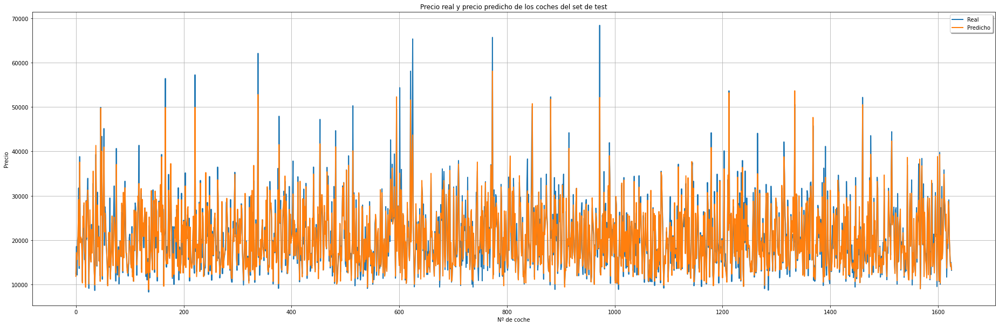

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_completo.add_row([
    'Random Forest',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_completo)

+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE        |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.901118428500083  | 0.8969636308530846 | 7472218.361789731 | 2733.535871685194  | 1925.4270406085482 |
|    SGD Regressor alpha óptimo    | 0.8818358921714493 | 0.8842359884378429 | 8373034.506997095 |  2893.61962030207  | 2029.7317834795394 |
| SGD Regressor alpha incrementado | 0.8811407279414745 | 0.8849081314982807 | 8242338.043768177 | 2870.9472380676343 | 2025.6531049792115 |
|        LASSO alpha óptimo        | 0.901100118389432  | 0.8968994646756133 | 7467148.796840813 | 2732.608423620335  | 1924.2575400119506 |
|     LASSO a

###4.6.2. Gradient Boosting

#####Dataset reducido (BMW, Audi, Mercedes)

In [ ]:
df_marcas_similares_dependientes = df_marcas_similares.drop('Precio en €', axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_marcas_similares.values.copy()
data2 = df_marcas_similares_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 17]))    # nos quedamos con la 17º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (1213, 31)
Datos test:  (405, 31)


In [ ]:
Niterations = [500, 1000, 1500, 2000]
learningRate = [0.1, 0.05]

n_folds = 5

param_grid = {'n_estimators': Niterations, 'learning_rate': learningRate}
clf = GradientBoostingRegressor(random_state=0, max_depth=3)
grid = GridSearchCV(clf, param_grid=param_grid, cv=n_folds)
grid.fit(X_train_scaled, y_train)
print("best mean cross-validation score: {:.3f}".format(grid.best_score_))
print("best parameters: {}".format(grid.best_params_))

best mean cross-validation score: 0.905
best parameters: {'learning_rate': 0.05, 'n_estimators': 1000}


In [ ]:
modelo = GradientBoostingRegressor(random_state=0, max_depth=3, **grid.best_params_)
modelo.fit(X_train_scaled, y_train)
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

GradientBoostingRegressor(learning_rate=0.05, n_estimators=1000, random_state=0)

In [ ]:
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.9764033928803891


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.9239589689124075


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.000938800603387234
RMSE:  0.03063985318808225
MAE:  0.02340826238227635


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  3801630.1665684558
RMSE:  1949.7769530303858
MAE:  1437.9357719519135


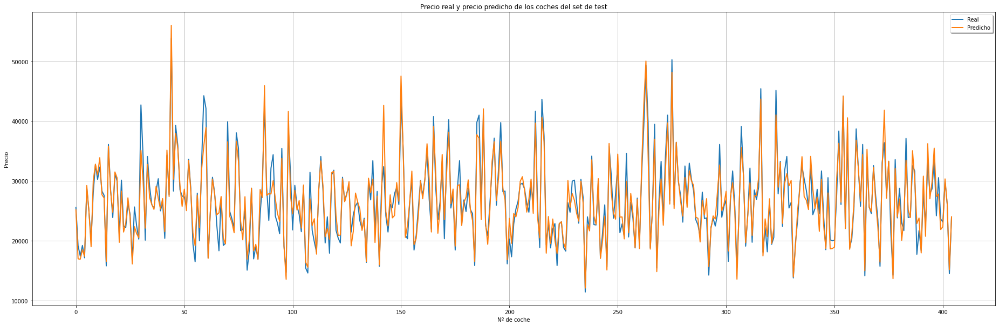

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_reducido.add_row([
    'Gradient Boosting',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_reducido)

+----------------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE         |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.8788970927882581 | 0.8674267462018959 | 6711145.158706923  | 2590.587801775289  | 1966.000051012837  |
|    SGD Regressor alpha óptimo    | 0.8715461072560216 | 0.8627930526867442 | 6734630.126482307  | 2595.116592078727  | 1990.605848171161  |
| SGD Regressor alpha incrementado | 0.8666769834965632 | 0.8563929122596557 | 7068589.799875575  |  2658.68196666611  | 2044.1711558523714 |
|        LASSO alpha óptimo        | 0.8788901475088389 | 0.8674794574869504 | 6699912.405607937  | 2588.4189007206573 | 1964.7670907588106 |
|     

#####Dataset completo

In [ ]:
df_completo_dependientes = df_completo.drop(['Precio en €'], axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_completo.values.copy()
data2 = df_completo_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 18]))    # nos quedamos con la 18º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (4878, 35)
Datos test:  (1626, 35)


In [ ]:
Niterations = [500, 1000, 1500, 2000]
learningRate = [0.1, 0.05]

n_folds = 5

param_grid = {'n_estimators': Niterations, 'learning_rate': learningRate}
clf = GradientBoostingRegressor(random_state=0, max_depth=3)
grid = GridSearchCV(clf, param_grid=param_grid, cv=n_folds)
grid.fit(X_train_scaled, y_train)
print("best mean cross-validation score: {:.3f}".format(grid.best_score_))
print("best parameters: {}".format(grid.best_params_))

best mean cross-validation score: 0.948
best parameters: {'learning_rate': 0.1, 'n_estimators': 2000}


In [ ]:
modelo = GradientBoostingRegressor(random_state=0, max_depth=3, **grid.best_params_)
modelo.fit(X_train_scaled, y_train)

GradientBoostingRegressor(n_estimators=2000, random_state=0)

In [ ]:
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.985811837828646


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.9496094559903914


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.0012544061551995975
RMSE:  0.035417596688646136
MAE:  0.02640318762457331


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  3503150.262077194
RMSE:  1871.6704469743584
MAE:  1274.4846573193704


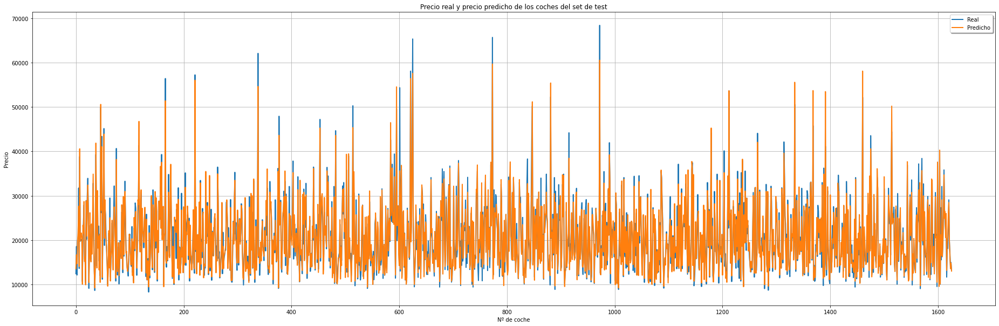

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_completo.add_row([
    'Gradient Boosting',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_completo)

+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE        |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.901118428500083  | 0.8969636308530846 | 7472218.361789731 | 2733.535871685194  | 1925.4270406085482 |
|    SGD Regressor alpha óptimo    | 0.8818358921714493 | 0.8842359884378429 | 8373034.506997095 |  2893.61962030207  | 2029.7317834795394 |
| SGD Regressor alpha incrementado | 0.8811407279414745 | 0.8849081314982807 | 8242338.043768177 | 2870.9472380676343 | 2025.6531049792115 |
|        LASSO alpha óptimo        | 0.901100118389432  | 0.8968994646756133 | 7467148.796840813 | 2732.608423620335  | 1924.2575400119506 |
|     LASSO a

###4.7. DecisionTree REGRESSOR

####Dataset reducido (BMW, Audi, Mercedes)

In [ ]:
df_marcas_similares_dependientes = df_marcas_similares.drop('Precio en €', axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_marcas_similares.values.copy()
data2 = df_marcas_similares_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 17]))    # nos quedamos con la 17º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (1213, 31)
Datos test:  (405, 31)


In [ ]:
# parámetros para GridSearch
max_depth = range(1, 20)
tuned_parameters = {'max_depth': max_depth}

n_folds = 15

modelo = DecisionTreeRegressor(random_state=0)
grid = GridSearchCV(modelo, param_grid=tuned_parameters, cv=n_folds, return_train_score=True) 
grid.fit(X_train_scaled, y_train)

GridSearchCV(cv=15, estimator=DecisionTreeRegressor(random_state=0),
             param_grid={'max_depth': range(1, 20)}, return_train_score=True)

In [ ]:
print("best mean cross-validation score: {:.3f}".format(grid.best_score_))
print("best parameters: {}".format(grid.best_params_))

best mean cross-validation score: 0.768
best parameters: {'max_depth': 9}


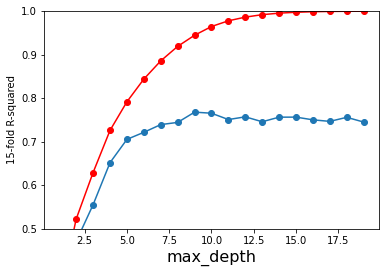

In [ ]:
scores_test = np.array(grid.cv_results_['mean_test_score'])
scores_train = np.array(grid.cv_results_['mean_train_score'])
plt.plot(max_depth, scores_test, '-o', label='Validación')
plt.plot(max_depth, scores_train, '-or', label='Entrenamiento')
plt.xlabel('max_depth', fontsize=16)
plt.ylabel('{}-fold R-squared'.format(n_folds))
plt.ylim((0.5, 1))
plt.show()

In [ ]:
best_max_depth = grid.best_params_['max_depth']
modelo = DecisionTreeRegressor(max_depth=best_max_depth)
modelo.fit(X_train_scaled, y_train)
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

DecisionTreeRegressor(max_depth=9)

In [ ]:
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.9463252356193461


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.7927054785865747


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.002559252800736225
RMSE:  0.05058905811276016
MAE:  0.037169953658320945


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  10477961.784001464
RMSE:  3236.9679924277075
MAE:  2293.16764822907


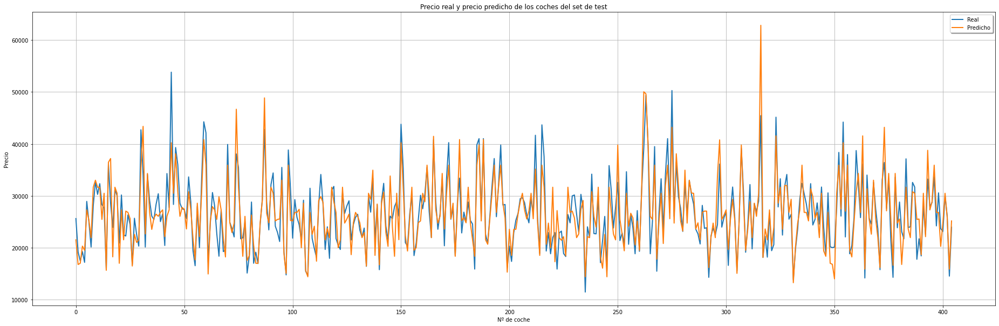

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_reducido.add_row([
    'DecissionTree',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_reducido)

+----------------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE         |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.8788970927882581 | 0.8674267462018959 | 6711145.158706923  | 2590.587801775289  | 1966.000051012837  |
|    SGD Regressor alpha óptimo    | 0.8715461072560216 | 0.8627930526867442 | 6734630.126482307  | 2595.116592078727  | 1990.605848171161  |
| SGD Regressor alpha incrementado | 0.8666769834965632 | 0.8563929122596557 | 7068589.799875575  |  2658.68196666611  | 2044.1711558523714 |
|        LASSO alpha óptimo        | 0.8788901475088389 | 0.8674794574869504 | 6699912.405607937  | 2588.4189007206573 | 1964.7670907588106 |
|     

####Dataset completo

In [ ]:
df_completo_dependientes = df_completo.drop(['Precio en €'], axis=1)

In [ ]:
# convertimos el DataFrame al formato necesario para scikit-learn
data = df_completo.values.copy()
data2 = df_completo_dependientes.values.copy()

y = np.log10(pd.to_numeric(data[:, 18]))    # nos quedamos con la 18º columna:precio. FORMATO LOGARÍTMICO PARA QUE NO HAYAN GRANDES DIFERENCIAS ENTRE EL PRECIO #MÁS ALTO Y EL MÁS BAJO, EXISTIENDO ASI UNA RELACION MÁS LINEAL.
                                                                           

X = data2[:,3:]                            # nos quedamos con todas variables numéricas

In [ ]:
# Dividimos los datos en entrenamiento y test (75% training, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state = 2)

print('Datos entrenamiento: ', X_train.shape)
print('Datos test: ', X_test.shape)

# Escalamos (obtenemos la transformación con los datos de train y la aplicamos a train y a test)

scaler = preprocessing.StandardScaler().fit(X_train)  #ESCALAR LAS VARIABLES IMPLICA QUE TODAS LAS VARIABLES ESTEN DENTRO DEL MISMO RANGO PARA QUE EL ALGORITMO
                                                      #DESPUÉS DE LASSO, ESTANDO EN EL MISMO RANGO, PUEDA DETERMINAR CUALES SON LAS MAS IMPORTANTES
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

Datos entrenamiento:  (4878, 35)
Datos test:  (1626, 35)


In [ ]:
# parámetros para GridSearch
max_depth = range(1, 20)
tuned_parameters = {'max_depth': max_depth}

n_folds = 15

modelo = DecisionTreeRegressor(random_state=0)
grid = GridSearchCV(modelo, param_grid=tuned_parameters, cv=n_folds, return_train_score=True) 
grid.fit(X_train_scaled, y_train)

GridSearchCV(cv=15, estimator=DecisionTreeRegressor(random_state=0),
             param_grid={'max_depth': range(1, 20)}, return_train_score=True)

In [ ]:
print("best mean cross-validation score: {:.3f}".format(grid.best_score_))
print("best parameters: {}".format(grid.best_params_))

best mean cross-validation score: 0.861
best parameters: {'max_depth': 11}


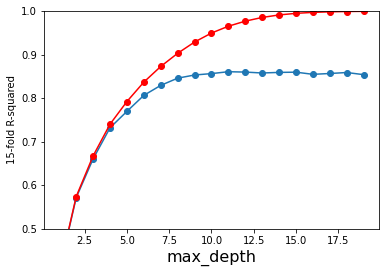

In [ ]:
scores_test = np.array(grid.cv_results_['mean_test_score'])
scores_train = np.array(grid.cv_results_['mean_train_score'])
plt.plot(max_depth, scores_test, '-o', label='Validación')
plt.plot(max_depth, scores_train, '-or', label='Entrenamiento')
plt.xlabel('max_depth', fontsize=16)
plt.ylabel('{}-fold R-squared'.format(n_folds))
plt.ylim((0.5, 1))
plt.show()

In [ ]:
best_max_depth = grid.best_params_['max_depth']
modelo = DecisionTreeRegressor(max_depth=best_max_depth)
modelo.fit(X_train_scaled, y_train)

DecisionTreeRegressor(max_depth=11)

In [ ]:
score = modelo.score(X_train_scaled, y_train)
print("R-squared:", score)

R-squared: 0.9634848982285569


In [ ]:
print("R-squared del Test: ", modelo.score(X_test_scaled, y_test))

R-squared del Test:  0.8725537333745994


In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  0.0031726067748271813
RMSE:  0.05632589790520149
MAE:  0.0409762168777371


MSE Y RMSE con el precio real (sin escala logarítmica):

In [ ]:
y_pred = modelo.predict(X_test_scaled)

mse = mean_squared_error(10 ** y_test, 10 ** y_pred)
mae = mean_absolute_error(10 **y_test, 10 **y_pred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))
print("MAE: ", mae)

MSE:  8863492.830718944
RMSE:  2977.16187512855
MAE:  1983.7161790455407


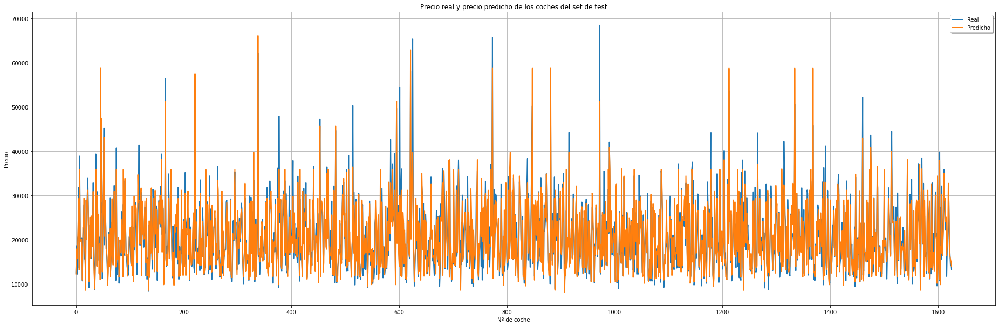

In [ ]:
# Logarithm and back to normal value

#y = np.log10(Price)
#Price = 10 ** y

x_ax = range(len(y_test))
plt.figure(figsize=(32, 10))
plt.plot(x_ax, 10 ** y_test, linewidth=2, label="Real")
plt.plot(x_ax, 10 ** y_pred, linewidth=2, label="Predicho")
plt.title("Precio real y precio predicho de los coches del set de test")
plt.xlabel('Nº de coche')
plt.ylabel('Precio')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show() 

In [ ]:
Tabla_results_dataset_completo.add_row([
    'DecissionTree',
    modelo.score(X_train_scaled, y_train),
    modelo.score(X_test_scaled, y_test),
    mean_squared_error(10 ** y_test, 10 ** y_pred),
    mean_squared_error(10 ** y_test, 10 ** y_pred)**(1/2.0),
    mean_absolute_error(10 **y_test, 10 **y_pred)
])

In [ ]:
print(Tabla_results_dataset_completo)

+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE        |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|     Mínimos cuadrados (OLS)      | 0.901118428500083  | 0.8969636308530846 | 7472218.361789731 | 2733.535871685194  | 1925.4270406085482 |
|    SGD Regressor alpha óptimo    | 0.8818358921714493 | 0.8842359884378429 | 8373034.506997095 |  2893.61962030207  | 2029.7317834795394 |
| SGD Regressor alpha incrementado | 0.8811407279414745 | 0.8849081314982807 | 8242338.043768177 | 2870.9472380676343 | 2025.6531049792115 |
|        LASSO alpha óptimo        | 0.901100118389432  | 0.8968994646756133 | 7467148.796840813 | 2732.608423620335  | 1924.2575400119506 |
|     LASSO a

##5. CONCLUSIONES

In [ ]:
print(Tabla_results_dataset_reducido.get_string(sortby="R-squared test",reversesort=True))

+----------------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE         |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|        Gradient Boosting         | 0.9764033928803891 | 0.9239589689124075 | 3801630.1665684558 | 1949.7769530303858 | 1437.9357719519135 |
|          Random Forest           | 0.9839473859605876 | 0.8983618228811339 | 4843788.769189355  | 2200.860915457711  | 1616.4214311257017 |
|             RidgeCV              | 0.8788645036106089 | 0.8675942983658983 | 6678180.913534949  | 2584.2176598605133 | 1962.472984632173  |
|          ElasticNet CV           | 0.8785898645136849 |  0.86753750565096  | 6656870.125898825  | 2580.091108061656  | 1961.7303289281829 |
|     

In [ ]:
print(Tabla_results_dataset_completo.get_string(sortby="R-squared test",reversesort=True))

+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|            Model Name            |  R-squared train   |   R-squared test   |        MSE        |        RMSE        |        MAE         |
+----------------------------------+--------------------+--------------------+-------------------+--------------------+--------------------+
|        Gradient Boosting         | 0.985811837828646  | 0.9496094559903914 | 3503150.262077194 | 1871.6704469743584 | 1274.4846573193704 |
|          Random Forest           | 0.9907097713147929 | 0.9323933052868899 | 4961590.703323417 | 2227.4628399422104 | 1441.651293137837  |
|     Mínimos cuadrados (OLS)      | 0.901118428500083  | 0.8969636308530846 | 7472218.361789731 | 2733.535871685194  | 1925.4270406085482 |
|        Ridge alpha óptimo        | 0.9011379009321137 | 0.8969308173684002 | 7481785.148384277 | 2735.2852042125837 | 1924.949490069835  |
|     Elastic